## Overview

My dataset is from Kaggle: https://www.kaggle.com/datasets/arunavakrchakraborty/australia-weather-data

It is weather data for Australia, contains about 10 years of daily weather observations from many locations across Australia. It's suitable for developing a classifier to predict the next-day rain on the target variable RainTomorrow.

Weather forecasting is very important in modern life, it affects people’s personal and business decisions in many ways. On top of that I have been always interested in knowning what factors affect weather in which way, it's exciting to learn some techniques to do my own weather forecast.

I follow CRISP-DM for this project.

I built a model for the whole Australia and separate models for two locations Sydney and Perth, to see how models of the same kind (e.g. LogisticRegression) perform in different datasets.
I used visualization in for both data analysis and model comparisons, specifically feature correlation heapmap is used to examine the datasets and believed to be quite useful.

The model is also compared to the DummyClassifier and the "common windom" approach by guessing tomorrow's weather is the same as today's.

## Data Analysis and simple model

This includes typical data understanding, data preparation, visualization and a simple LogisticRegression model.
Besides operation like .dropna() to remove NaN entries, two useful steps are used:
1. Convert Celsius to Kelvin, Kelvin is the system that directly related to thermodynamics, it's a much better farmework for any scientic projects.
2. The full date info like 2017-06-22 probably isn't useful for weather forecasting. I never heard anyone used weather info of specific dates in the past to do forecast. However month is a useful piece of data, November in Chicago or July in London both provide significant amount of info. The full date format is processed to become month only like 03, 12 for March and December.

A dumb person's forecast is put to test, which simply predicts tomorrow's weather is same as today's, and it performs close to the dummy model which predicts the majority class all the time.

Heapmaps are informative, I observed Pressure has strong negative correlation with RainTomorrow, Humidity and Cloud have string positive correlatioin with RainTomorrow, also as expected RainToday also have strong correlation with RainTomorrow.
Raining days per month Barcharts of Sudney and Perth clearly shows they have very different climate across the year.

heapmap and mpnthly raining days chart 

## Optimization and model comparison

Since Australia is a very large country spanning a wide range of latitude, with coastlines on Pacific and Idian oceans, it doesn't make much sense to use a single model to predict tomorrow's weather. For optimization and model comparison I focused on Sydney and Perth, though I still built a simple LogisticRegression model for Australia just for the record.

### Feature Engineering

I used a function to calculate square root values for all numerical numbers to create a list of new features. These square root features and existing numerical featuers are then processed through PolynomialFeatures(degree=2), so there are feature like 
- "WindSpeed3pm_sq_root Humidity3pm_sq_root"
- "Temp3pm WindGustSpeed_sq_root"

One thing worth noting, features like WindGustSpeed_sq_root^2 (which is WindGustSpeed) are manually removed.

### Different classifiers and grid search

I used
- LogisticRgression
- SVM
- DecisionTreeClassifier
- KNeighborsClassifier
- RandomForestClassifier
- GradientBoostingClassifie

for both Sydney and Perth. Models for Perth consistently perform better than Sydney's, in other words Perth's weather has stronger pattern and is easier to predict - this is similar to say Los Angeles' weather is easier to predict than Miami's, between April and November you don't need a weather man to do forecast for Los Angeles, one can get close to 99% accuracy by predicting every day is a sunny day :-)

GridSearchCV and for loop are used for most classifiers to find the best hyperparameters.

Since Models for Perth have higer accuracy, I applied more optimization (imbalanced data handling, TargetEncoder()) to Perth models only to cut down repeatitive works.

### Custom threshold for preditction
In many appliactions accuracy is not the best performance measurement, confusion matrix is used throughout the project. I pay more attention to recall and specificity beause it is annoying or even frustrating to have a wrong prediction, people do not have rain gears rain cloths when the forecast misses a raining day, while people cancel their activities or trips unneceaasrily if the forecast misses a sunny day.

I used threshold = 0.3 to improve recall.

Average of recall and specificity or recall * 2/3 + specifity * 1/3 is a good measurement


### Imbalanced data and class_weights='balanced'

Raining days account for 20.36% in Perth dataset, it is imbalanced but not at all extreme. I used class_weights='balanced in the classifiers support it to see if this option improve model accuracy. The result is mixed, it helps LogisticRegression a lot but not mcuh or even hurts other models, details can be seen in the tables.

### TargetEncoder()

Month feature has 12 different values, each of [WindGustDir, WindDir9am, WindDir3pm] has 16 different values, OneHotEncoder create many features for them and most of those entries are 0, this leads to more complex model and can potential be overfitting. TargetEncoder is an alternative worth exploring. In the round of attempts TargetEncoder was used then LogisticRgression, RandomForestClassifier and GradientBoostingClassifier were trained and tested again.



In [520]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import OneHotEncoder, StandardScaler, PolynomialFeatures
from sklearn.compose import make_column_selector
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyClassifier

In [522]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeClassifier, export_text, plot_tree
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
import time
import seaborn as sns
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import TargetEncoder
from sklearn.linear_model import RidgeClassifier
from sklearn.inspection import permutation_importance

In [524]:
pd.options.display.max_columns = None

## Data Understanding

### Examine the data

In [529]:
weather = pd.read_csv('weather/weatherAUS.csv')
df = weather.copy()

In [531]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [533]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [535]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [537]:
df.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

#### Drop NaN

In [540]:
df=df.dropna()

In [542]:
df['Location'].value_counts()

Location
Darwin              3062
Perth               3025
Brisbane            2953
MelbourneAirport    2929
PerthAirport        2913
SydneyAirport       2870
Watsonia            2730
Mildura             2594
MountGambier        2465
NorfolkIsland       2464
Cairns              2444
Townsville          2419
WaggaWagga          2416
AliceSprings        2223
Nuriootpa           2008
Hobart              1939
Moree               1913
Melbourne           1898
Portland            1863
Woomera             1734
Sydney              1690
Sale                1678
CoffsHarbour        1380
Williamtown         1198
Canberra            1078
Cobar                534
Name: count, dtype: int64

### Keep the month portion of the Date feature
The full date info like 2017-06-22 probably isn't useful for weather forecasting. I never heard anyone used weather info of specific dates in the past to do forecast. However month is a useful piece of data, November in Chicago or July in London both provide significant amount of info.

In [546]:
df['Date'] = df['Date'].map(lambda x: x.split('-')[1])

/var/folders/53/8cwfffh14nj6bpk9_kvxyx8r0000gn/T/ipykernel_23946/875933511.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Date'] = df['Date'].map(lambda x: x.split('-')[1])


In [548]:
df0 = df.rename(columns={'Date': 'Month'})
df0

,Month,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
6049,01,Cobar,17.9,35.2,0.0,12.0,12.3,SSW,48.0,ENE,SW,6.0,20.0,20.0,13.0,1006.3,1004.4,2.0,5.0,26.6,33.4,No,No
6050,01,Cobar,18.4,28.9,0.0,14.8,13.0,S,37.0,SSE,SSE,19.0,19.0,30.0,8.0,1012.9,1012.1,1.0,1.0,20.3,27.0,No,No
6052,01,Cobar,19.4,37.6,0.0,10.8,10.6,NNE,46.0,NNE,NNW,30.0,15.0,42.0,22.0,1012.3,1009.2,1.0,6.0,28.7,34.9,No,No
6053,01,Cobar,21.9,38.4,0.0,11.4,12.2,WNW,31.0,WNW,WSW,6.0,6.0,37.0,22.0,1012.7,1009.1,1.0,5.0,29.1,35.6,No,No
6054,01,Cobar,24.2,41.0,0.0,11.2,8.4,WNW,35.0,NW,WNW,17.0,13.0,19.0,15.0,1010.7,1007.4,1.0,6.0,33.6,37.6,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142298,06,Darwin,19.3,33.4,0.0,6.0,11.0,ENE,35.0,SE,NE,9.0,20.0,63.0,32.0,1013.9,1010.5,0.0,1.0,24.5,32.3,No,No
142299,06,Darwin,21.2,32.6,0.0,7.6,8.6,E,37.0,SE,SE,13.0,11.0,56.0,28.0,1014.6,1011.2,7.0,0.0,24.8,32.0,No,No
142300,06,Darwin,20.7,32.8,0.0,5.6,11.0,E,33.0,E,W,17.0,11.0,46.0,23.0,1015.3,1011.8,0.0,0.0,24.8,32.1,No,No
142301,06,Darwin,19.5,31.8,0.0,6.2,10.6,ESE,26.0,SE,NNW,9.0,17.0,62.0,58.0,1014.9,1010.7,1.0,1.0,24.8,29.2,No,No


#### Create a dict for collecting model performance results

In [552]:
df_results = {}

# Data analysis and simple models

## Australia as a whole

#### drop Location

In [557]:
aus = df0.drop(columns='Location')
aus

,Month,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
6049,01,17.9,35.2,0.0,12.0,12.3,SSW,48.0,ENE,SW,6.0,20.0,20.0,13.0,1006.3,1004.4,2.0,5.0,26.6,33.4,No,No
6050,01,18.4,28.9,0.0,14.8,13.0,S,37.0,SSE,SSE,19.0,19.0,30.0,8.0,1012.9,1012.1,1.0,1.0,20.3,27.0,No,No
6052,01,19.4,37.6,0.0,10.8,10.6,NNE,46.0,NNE,NNW,30.0,15.0,42.0,22.0,1012.3,1009.2,1.0,6.0,28.7,34.9,No,No
6053,01,21.9,38.4,0.0,11.4,12.2,WNW,31.0,WNW,WSW,6.0,6.0,37.0,22.0,1012.7,1009.1,1.0,5.0,29.1,35.6,No,No
6054,01,24.2,41.0,0.0,11.2,8.4,WNW,35.0,NW,WNW,17.0,13.0,19.0,15.0,1010.7,1007.4,1.0,6.0,33.6,37.6,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142298,06,19.3,33.4,0.0,6.0,11.0,ENE,35.0,SE,NE,9.0,20.0,63.0,32.0,1013.9,1010.5,0.0,1.0,24.5,32.3,No,No
142299,06,21.2,32.6,0.0,7.6,8.6,E,37.0,SE,SE,13.0,11.0,56.0,28.0,1014.6,1011.2,7.0,0.0,24.8,32.0,No,No
142300,06,20.7,32.8,0.0,5.6,11.0,E,33.0,E,W,17.0,11.0,46.0,23.0,1015.3,1011.8,0.0,0.0,24.8,32.1,No,No
142301,06,19.5,31.8,0.0,6.2,10.6,ESE,26.0,SE,NNW,9.0,17.0,62.0,58.0,1014.9,1010.7,1.0,1.0,24.8,29.2,No,No


#### function for feature encoding and polynomial feature engineering

In [561]:
def featureEncoding(df, oneHot=False, PolyNomial=False):
    # Define column selectors
    categorical_selector = make_column_selector(dtype_include=object)
    numerical_selector = make_column_selector(dtype_include=['int64', 'float64'])
    
    # Identify categorical and numerical columns
    categorical_columns = categorical_selector(df)
    numerical_columns = numerical_selector(df)
    OneHotEncoding = OneHotEncoder(drop='if_binary', sparse_output=False) if oneHot else 'passthrough'
    PolynomialEncoding = PolynomialFeatures(degree=2, include_bias=False) if PolyNomial else 'passthrough'
    preprocessor = ColumnTransformer(verbose_feature_names_out=False,
        transformers=[
            ('onehot', OneHotEncoding, categorical_columns),
            ('polynomial', PolynomialEncoding, numerical_columns)  # polynomial on numerical columns
        ])
    
    encoded_data = preprocessor.fit_transform(df)
    return pd.DataFrame(encoded_data, columns = preprocessor.get_feature_names_out())

#### function for making prediction with specific threshold

In [565]:
def custom_predict(model, X, threshold):
    probs = model.predict_proba(X) 
    return (probs[:, 1] > threshold).astype(int)

In [567]:
aus1 = featureEncoding(aus, oneHot=True, PolyNomial=False)
aus1

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,RainTomorrow_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,17.9,35.2,0.0,12.0,12.3,48.0,6.0,20.0,20.0,13.0,1006.3,1004.4,2.0,5.0,26.6,33.4
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.4,28.9,0.0,14.8,13.0,37.0,19.0,19.0,30.0,8.0,1012.9,1012.1,1.0,1.0,20.3,27.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.4,37.6,0.0,10.8,10.6,46.0,30.0,15.0,42.0,22.0,1012.3,1009.2,1.0,6.0,28.7,34.9
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,21.9,38.4,0.0,11.4,12.2,31.0,6.0,6.0,37.0,22.0,1012.7,1009.1,1.0,5.0,29.1,35.6
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,24.2,41.0,0.0,11.2,8.4,35.0,17.0,13.0,19.0,15.0,1010.7,1007.4,1.0,6.0,33.6,37.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56415,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.3,33.4,0.0,6.0,11.0,35.0,9.0,20.0,63.0,32.0,1013.9,1010.5,0.0,1.0,24.5,32.3
56416,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.2,32.6,0.0,7.6,8.6,37.0,13.0,11.0,56.0,28.0,1014.6,1011.2,7.0,0.0,24.8,32.0
56417,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,20.7,32.8,0.0,5.6,11.0,33.0,17.0,11.0,46.0,23.0,1015.3,1011.8,0.0,0.0,24.8,32.1
56418,0.0,0.0,0.0,0.0,0.0,

In [570]:
aus1[aus1.columns] = StandardScaler().fit_transform(aus1[aus1.columns])
aus1

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,RainTomorrow_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,3.116405,-0.284656,-0.317748,-0.291619,-0.308259,-0.296705,-0.301768,-0.302432,-0.299279,-0.30532,-0.302047,-0.285928,-0.294969,-0.277276,-0.249727,-0.283965,-0.2446,-0.216045,-0.205636,-0.220325,-0.262459,-0.273626,-0.249045,3.670707,-0.278165,-0.282175,-0.236519,-0.268389,-0.292834,3.653619,-0.253233,-0.3107,-0.252836,-0.247919,-0.237645,-0.230825,-0.254064,-0.271751,-0.272239,-0.233875,-0.251484,-0.265187,-0.233538,-0.238518,-0.266944,-0.274225,-0.265034,-0.262073,-0.252836,-0.212607,-0.227052,-0.225364,-0.280267,-0.281882,-0.250527,-0.256584,3.614251,-0.273327,-0.245210,-0.270847,-0.532445,-0.531485,0.691208,1.575298,-0.303702,1.757691,1.214537,0.534126,-1.162355,0.025055,-2.477924,-1.812261,-1.583303,-1.513002,-0.801428,0.254411,1.278186,1.563621
1,3.116405,-0.284656,-0.317748,-0.291619,-0.308259,-0.296705,-0.301768,-0.302432,-0.299279,-0.30532,-0.302047,-0.285928,-0.294969,-0.277276,-0.249727,-0.283965,-0.2446,-0.216045,-0.205636,-0.220325,3.810125,-0.273626,-0.249045,-0.272427,-0.278165,-0.282175,-0.236519,-0.268389,-0.292834,-0.273701,-0.253233,-0.3107,-0.252836,-0.247919,-0.237645,-0.230825,-0.254064,-0.271751,3.673238,-0.233875,-0.251484,-0.265187,-0.233538,-0.238518,-0.266944,-0.274225,-0.265034,-0.262073,-0.252836,-0.212607,-0.227052,-0.225364,-0.280267,-0.281882,3.991588,-0.256584,-0.276682,-0.273327,-0.245210,-0.270847,-0.532445,-0.531485,0.769131,0.671504,-0.303702,2.515216,1.400800,-0.290764,0.400721,-0.092452,-1.937767,-2.059824,-0.628068,-0.392322,-1.158937,-1.256603,0.318980,0.627467
2,3.116405,-0.284656,-0.317748,-0.291619,-0.308259,-0.296705,-0.301768,-0.302432,-0.299279,-0.30532,-0.302047,-0.285928,-0.294969,-0.277276,-0.249727,-0.283965,-0.2446,4.628659,-0.205636,-0.220325,-0.262459,-0.273626,-0.249045,-0.272427,-0.278165,-0.282175,-0.236519,-0.268389,-0.292834,-0.273701,-0.253233,-0.3107,-0.252836,4.033567,-0.237645,-0.230825,-0.254064,-0.271751,-0.272239,-0.233875,-0.251484,-0.265187,-0.233538,-0.238518,-0.266944,-0.274225,-0.265034,-0.262073,-0.252836,-0.212607,4.404280,-0.225364,-0.280267,-0.281882,-0.250527,-0.256584,-0.276682,-0.273327,-0.245210,-0.270847,-0.532445,-0.531485,0.924976,1.919600,-0.303702,1.433038,0.762183,0.384146,1.723325,-0.562482,-1.289578,-1.366647,-0.714907,-0.814396,-1.158937,0.632165,1.597921,1.783032
3,3.116405,-0.284656,-0.317748,-0.291619,-0.308259,-0.296705,-0.301768,-0.302432,-0.299279,-0.30532,-0.302047,-0.285928,-0.294969,-0.277276,-0.249727,-0.283965,-0.2446,-0.216045,-0.205636,-0.220325,-0.262459,-0.273626,-0.249045,-0.272427,-0.278165,-0.282175,4.227987,-0.268389,-0.292834,-0.273701,-0.253233,-0.3107,-0.252836,-0.247919,-0.237645,-0.230825,-0.254064,-0.271751,-0.272239,-0.233875,-0.251484,-0.265187,4.281958,-0.238518,-0.266944,-0.274225,-0.265034,-0.262073,-0.252836,-0.212607,-0.227052,-0.225364,-0.280267,-0.281882,-0.250527,-0.256584,-0.276682,-0.273327,-0.245210,3.692119,-0.532445,-0.531485,1.314588,2.034368,-0.303702,1.595364,1.187928,-0.740704,-1.162355,-1.620048,-1.559657

### Heapmaps on correlations

#### full heapmap

In [575]:
full_corr_matrix = aus1.corr()
full_corr_matrix

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,RainTomorrow_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
Month_01,1.000000,-0.091341,-0.101960,-0.093575,-0.098915,-0.095208,-0.096832,-0.097045,-0.096033,-0.097972,-0.096922,-0.091749,0.007951,0.013244,0.008764,-0.037563,0.016807,0.005349,-0.030783,-0.025178,0.026689,0.021329,0.021927,0.021406,0.006544,-0.031338,-0.022312,-0.009710,0.020108,0.014819,0.027290,-0.018639,-0.002427,0.004960,-0.018025,-0.025140,0.020074,0.025227,0.015282,0.014245,-0.014242,-0.022883,-0.028997,-0.018496,0.009204,0.008510,0.017544,-0.024471,0.010647,-0.008021,-0.030534,-0.023740,0.020962,0.011036,0.022212,0.008772,0.007933,-0.017998,-0.016259,-0.005546,-0.018265,-0.013834,0.250762,0.271835,0.028536,0.275334,0.119843,0.077484,0.034683,0.050714,-0.101663,-0.061849,-0.225915,-0.215629,0.004594,-0.028256,0.255811,0.259968
Month_02,-0.091341,1.000000,-0.090449,-0.083011,-0.087748,-0.084459,-0.085900,-0.086089,-0.085192,-0.086911,-0.085980,-0.081391,0.029394,0.004203,0.020544,-0.030626,-0.001089,-0.011605,-0.022372,-0.031324,0.038230,0.035015,0.043349,0.001545,-0.004881,-0.032936,-0.020147,-0.026659,0.026454,0.013554,0.023519,-0.031430,-0.005410,-0.017257,-0.013785,-0.029770,0.018495,0.035156,0.032718,-0.000704,-0.006133,-0.022511,-0.023319,-0.007051,0.023687,0.001643,0.030834,-0.026292,-0.004843,-0.016840,-0.023794,-0.027745,0.030049,0.028795,0.036334,0.005810,-0.006737,-0.026989,-0.014218,-0.020814,-0.006831,-0.007548,0.218819,0.215969,0.033749,0.168723,0.072163,0.026655,-0.000305,0.013183,-0.016196,-0.020359,-0.131097,-0.120155,0.005747,-0.009887,0.194351,0.210306
Month_03,-0.101960,-0.090449,1.000000,-0.092661,-0.097949,-0.094278,-0.095886,-0.096097,-0.095095,-0.097015,-0.095975,-0.090853,0.030068,0.004916,0.024107,-0.020117,0.000511,-0.011523,-0.023318,-0.025583,0.007893,0.043810,0.026406,0.006910,-0.008703,-0.029978,-0.024431,-0.012180,0.023536,0.005889,0.031536,-0.028068,-0.012115,-0.015934,-0.013264,-0.012814,0.007276,0.027467,0.023501,0.001017,-0.005131,-0.011390,-0.007652,-0.018371,0.024357,0.005570,0.034574,-0.024422,-0.001261,-0.018042,-0.027776,-0.020353,0.007606,0.037899,0.006888,0.003931,-0.003804,-0.018030,-0.007555,-0.011345,0.002838,-0.000833,0.167710,0.153751,0.012317,0.067173,-0.003754,-0.012823,-0.026651,-0.011942,0.034941,-0.012299,-0.039621,-0.031944,0.009362,0.011753,0.126101,0.155007
Month_04,-0.093575,-0.083011,-0.092661,1.000000,-0.089894,-0.086525,-0.088001,-0.088195,-0.087275,-0.089037,-0.088083,-0.083382,0.015566,0.002894,0.017791,-0.017810,-0.002751,-0.017315,-0.009828,-0.008072,0.017464,0.015797,0.014272,0.003248,-0.005002,-0.014414,-0.010383,-0.006882,0.006297,0.011091,0.007904,-0.016361,-0.003801,-0.017804,-0.007149,0.000696,-0.002522,0.010137,0.013759,0.000199,-0.000009,-0.004137,0.003960,-0.002639,0.013723,-0.000071,0.010591,-0.021834,-0.009073,-0.001698,-0.013069,-0.010372,0.021052,0.018815,0.016464,0.002427,-0.000115,-0.017734,-0.012489,-0.002148,-0.000275,-0.002066,0.029850,0.015709,-0.004925,-0.073620,-0.039566,-0.075579,-0.041934,-0.057904,0.035624,0.015745,0.076037,0.069126,0.00927

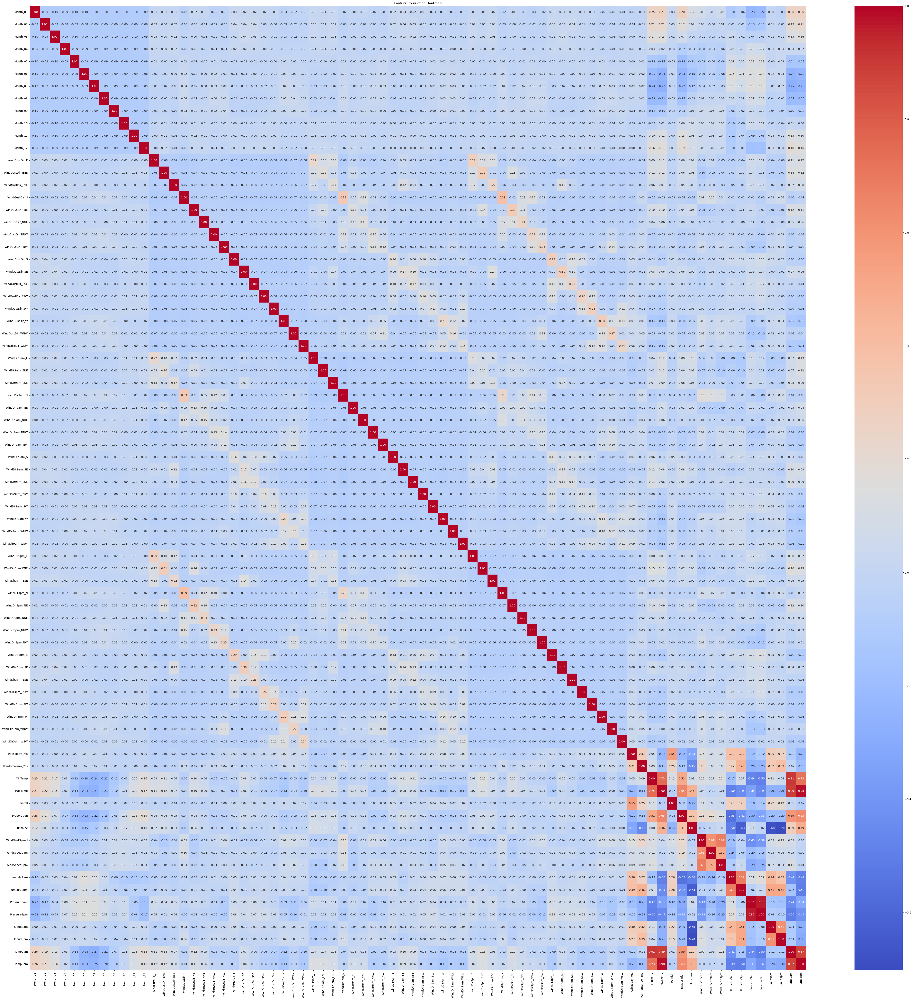

In [577]:
plt.figure(figsize=(64, 64))
sns_plot = sns.heatmap(full_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlation Heatmap')
plt.show()

fig = sns_plot.get_figure()
fig.savefig("australia_full_heapmap.png", dpi=300)

The lower right corner of the heapmap has stronger correlation, they are features with numerical values(e.g. MinTemp, WindSpeed9am, Humidity3pm, Pressure9am ...), RainToday and RainTomorrow.

The lower left corner also have some level of correlation, they are between 'Month' and features with numerical values. For example, temperature is higher for January and Feburary and lower for June and July(remember this is Australia in the southern hemisphere), pressure and humidity are higher in June and July and lower in January and Feburary. These are really interesting information.

There are two diagonal strips at both below and above the main diagonal. The stronger and shorter one is between wind direction at 3PM and windGust direction. The longer and weaker one is between wind direction at 9am and (windGust directioin + wind irection at 3PM)

### Let's check the corellation of the lower right corner more closely by selecting only those columns

In [583]:
selected_clms = ['MinTemp', 'MaxTemp',	'Rainfall',	'Evaporation', 'Sunshine', 'WindGustSpeed',	'WindSpeed9am',	'WindSpeed3pm',	'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm',	'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday_Yes', 'RainTomorrow_Yes']
selected_corr_matrix = aus1[selected_clms].corr()

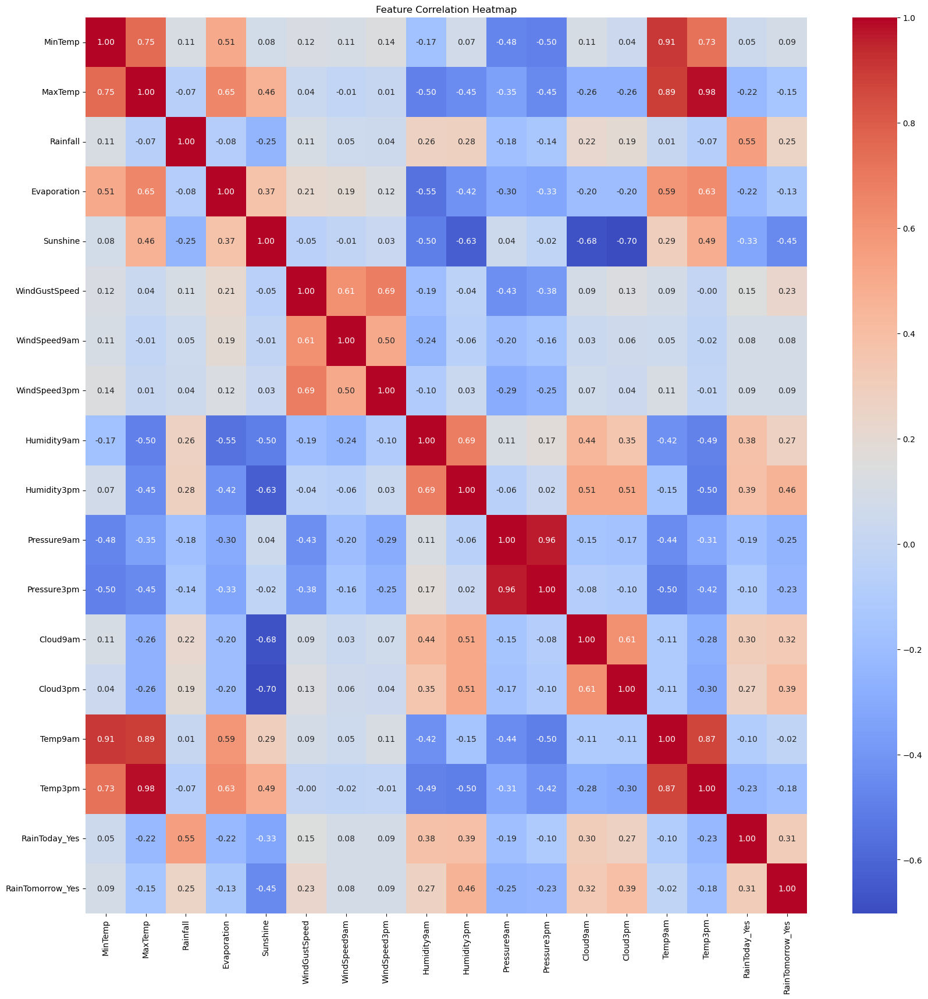

In [584]:
plt.figure(figsize=(20, 20))
sns_plot = sns.heatmap(selected_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlation Heatmap')
plt.show()

fig = sns_plot.get_figure()
fig.savefig("australia_selected_heapmap.png", dpi=300)

The bottom row is for RainTomorrow_Yes, we can see it has positive correlatioins with RainFall, WindGustSpeed, Cloud, Humidity and RainToday, negative correlation with Sunshine and Pressure.

In [587]:
selected_corr_matrix

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday_Yes,RainTomorrow_Yes
MinTemp,1.000000,0.749687,0.110800,0.506764,0.076087,0.118054,0.108522,0.137273,-0.174991,0.070827,-0.475661,-0.495577,0.106177,0.042173,0.906295,0.727222,0.048953,0.087428
MaxTemp,0.749687,1.000000,-0.069981,0.650964,0.463913,0.035531,-0.008171,0.012266,-0.495781,-0.448116,-0.350980,-0.451691,-0.263634,-0.257752,0.893387,0.984841,-0.221810,-0.147467
Rainfall,0.110800,-0.069981,1.000000,-0.077239,-0.246379,0.106308,0.050584,0.044112,0.263625,0.277625,-0.180606,-0.137302,0.217169,0.191433,0.013713,-0.074627,0.550515,0.254342
Evaporation,0.506764,0.650964,-0.077239,1.000000,0.369250,0.209566,0.193154,0.124345,-0.554232,-0.422436,-0.297319,-0.325954,-0.199809,-0.202366,0.593122,0.630727,-0.218079,-0.130002
Sunshine,0.076087,0.463913,-0.246379,0.369250,1.000000,-0.052422,-0.013842,0.029200,-0.500343,-0.629299,0.043330,-0.020632,-0.677939,-0.702022,0.289038,0.486129,-0.328904,-0.453407
WindGustSpeed,0.118054,0.035531,0.106308,0.209566,-0.052422,1.000000,0.608852,0.685236,-0.193410,-0.042653,-0.430363,-0.383683,0.088129,0.131590,0.085520,-0.000382,0.146276,0.233158
WindSpeed9am,0.108522,-0.008171,0.050584,0.193154,-0.013842,0.608852,1.000000,0.502226,-0.236795,-0.058449,-0.201518,-0.155484,0.034908,0.062507,0.053749,-0.018357,0.083125,0.083904
WindSpeed3pm,0.137273,0.012266,0.044112,0.124345,0.029200,0.685236,0.502226,1.000000,-0.100626,0.031843,-0.293155,-0.252095,0.068224,0.041475,0.114043,-0.009436,0.085627,0.088862
Humidity9am,-0.174991,-0.495781,0.263625,-0.554232,-0.500343,-0.193410,-0.236795,-0.100626,1.000000,0.685697,0.114575,0.172972,0.438962,0.348707,-0.423598,-0.487758,0.379451,0.271033
Humidity3pm,0.070827,-0.448116,0.277625,-0.422436,-0.629299,-0.042653,-0.058449,0.031843,0.685697,1.000000,-0.063454,0.024109,0.509223,0.510996,-0.151614,-0.497245,0.385440,0.455358


### What is the accuracy of guessing tomorrow's weather is same as today
It's commonly known that guessing tomorrow's weather is the same as today's has pretty good accuracy, let's see!

The probability of raining tomorrow:

In [591]:
df[(df['RainTomorrow'] == 'Yes')].shape[0]/df.shape[0]

0.22025877348457992

The probably of not raining tomorrow:

In [595]:
df[df['RainTomorrow'] == 'No'].shape[0]/df.shape[0]

0.7797412265154201

The majority class is not raining, with a probability of 78%

The probability of having rain tomorrow if it rains today:

In [602]:
df[(df['RainToday'] == 'Yes') & (df['RainTomorrow'] == 'Yes')].shape[0] / df[(df['RainToday'] == 'Yes')].shape[0]

0.4608409565077837

It's 46.1%

The probability of not raining tomorrow if it's not raining today:

In [606]:
df[(df['RainToday'] == 'No') & (df['RainTomorrow'] == 'No')].shape[0] / df[(df['RainToday'] == 'No')].shape[0]

0.8479457664133946

It's 84.8%

#### Combining both we have the accuracy of guessing tomorrow's weather is the same as today


In [611]:
(df[(df['RainToday'] == 'No') & (df['RainTomorrow'] == 'No')].shape[0] + df[(df['RainToday'] == 'Yes') & (df['RainTomorrow'] == 'Yes')].shape[0]) / df.shape[0]

0.7624423963133641

76% is not bad but slightly fall short of blinding guessing tomorrow will not rain at 78%

### prepare data for modeling

In [617]:
X_aus, y_aus = aus.drop('RainTomorrow', axis = 1), aus['RainTomorrow']

In [619]:
X_aus.sample(10)

,Month,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
93861,07,20.3,26.9,0.0,6.6,2.4,SE,39.0,S,E,7.0,26.0,67.0,67.0,1020.4,1016.7,7.0,7.0,22.1,24.0,No
101228,11,6.7,15.8,3.6,1.8,3.6,SW,44.0,S,SSW,20.0,30.0,74.0,56.0,1019.9,1021.1,7.0,7.0,11.0,13.4,Yes
35587,11,18.6,21.2,0.0,7.6,0.0,SE,48.0,S,SE,31.0,22.0,80.0,61.0,1022.2,1022.5,6.0,7.0,18.8,20.3,No
129914,09,7.5,16.0,0.4,6.4,8.1,NNW,83.0,NNW,NNW,43.0,39.0,48.0,31.0,988.0,984.0,6.0,3.0,14.7,15.5,No
85441,07,6.8,19.3,0.0,2.8,10.1,SW,20.0,SSW,WSW,4.0,6.0,58.0,35.0,1022.9,1021.0,1.0,0.0,12.4,18.9,No
13489,01,20.5,35.1,18.4,11.2,12.0,E,57.0,NE,N,22.0,17.0,65.0,37.0,1011.5,1008.3,2.0,2.0,26.0,32.9,Yes
34944,01,21.6,31.2,0.0,4.6,12.8,ENE,52.0,N,NE,17.0,37.0,63.0,56.0,1012.9,1010.4,2.0,1.0,27.1,29.3,No
36937,02,19.6,22.0,6.2,2.2,0.0,NE,22.0,NE,WNW,11.0,4.0,95.0,93.0,1009.8,1008.3,8.0,8.0,19.9,21.8,Yes
34155,09,15.1,28.2,0.0,7.6,9.8,WNW,41.0,WNW,NW,19.0,24.0,30.0,15.0,1013.4,1009.0,2.0,6.0,22.4,27.4,No
88213,10,19.0,31.4,0.0,5.8,10.6,NNE,33.0,ESE,N,11.0,24.0,59.0,70.0,1012.0,1007.8,0.0,1.0,27.7,28.5,No


In [621]:
X_aus = featureEncoding(X_aus, oneHot=True, PolyNomial=True)
X_aus[X_aus.columns] = StandardScaler().fit_transform(X_aus[X_aus.columns])
X_aus

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Sunshine^2,Sunshine WindGustSpeed,Sunshine WindSpeed9am,Sunshine WindSpeed3pm,Sunshine Humidity9am,Sunshine Humidity3pm,Sunshine Pressure9am,Sunshine Pressure3pm,Sunshine Cloud9am,Sunshine Cloud3pm,Sunshine Temp9am,Sunshine Temp3pm,WindGustSpeed^2,WindGustSpeed WindSpeed9am,WindGustSpeed WindSpeed3pm,WindGustSpeed Humidity9am,WindGustSpeed Humidity3pm,WindGustSpeed Pressure9am,WindGustSpeed Pressure3pm,WindGustSpeed Cloud9am,WindGustSpeed Cloud3pm,WindGustSpeed Temp9am,WindGustSpeed Temp3pm,WindSpeed9am^2,WindSpeed9am WindSpeed3pm,WindSpeed9am Humidity9am,WindSpeed9am Humidity3pm,WindSpeed9am Pressure9am,WindSpeed9am Pressure3pm,WindSpeed9am Cloud9am,WindSpeed9am Cloud3pm,WindSpeed9am Temp9am,WindSpeed9am Temp3pm,WindSpeed3pm^2,WindSpeed3pm Humidity9am,WindSpeed3pm Humidity3pm,WindSpeed3pm Pressure9am,WindSpeed3pm Pressure3pm,WindSpeed3pm Cloud9am,WindSpeed3pm Cloud3pm,WindSpeed3pm Temp9am,WindSpeed3pm Temp3pm,Humidity9am^2,Humidity9am Humidity3pm,Humidity9am Pressure9am,Humidity9am Pressure3pm,Humidity9am Cloud9am,Humidity9am Cloud3pm,Humidity9am Temp9am,Humidity9am Temp3pm,Humidity3pm^2,Humidity3pm Pressure9am,Humidity3pm Pressure3pm,Humidity3pm Cloud9am,Humidity3pm Cloud3pm,Humidity3pm Temp9am,Humidity3pm Temp3pm,Pressure9am^2,Pressure9am Pressure3pm,Pressure9am Cloud9am,Pressure9am Cloud3pm,Pressure9am Temp9am,Pressure9am Temp3pm,Pressure3pm^2,Pressure3pm Cloud9am,Pressure3pm Cloud3pm,Pressure3pm Temp9am,Pressure3pm Temp3pm,Cloud9am^2,Cloud9am Cloud3pm,Cloud9am Temp9am,Cloud9am Temp3pm,Cloud3pm^2,Cloud3pm Temp9am,Cloud3pm Temp3pm,Temp9am^2,Temp9am Temp3pm,Temp3pm^2
0,3.116405,-0.284656,-0.317748,-0.291619,-0.308259,-0.296705,-0.301768,-0.302432,-0.299279,-0.30532,-0.302047,-0.285928,-0.294969,-0.277276,-0.249727,-0.283965,-0.2446,-0.216045,-0.205636,-0.220325,-0.262459,-0.273626,-0.249045,3.670707,-0.278165,-0.282175,-0.236519,-0.268389,-0.292834,3.

#### function for plotting confusion matrix

In [625]:
def plotConfusionMatrix(cm, model):
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
    disp.plot()
    plt.show()
    if (cm[1][1] + cm[0][1]) != 0:
        precision = cm[1][1]/(cm[1][1] + cm[0][1])
    recall = cm[1][1]/(cm[1][1] + cm[1][0])
    specificity = cm[0][0]/(cm[0][0] + cm[0][1])
    accuracy = (cm[0][0] + cm[1][1])/(cm[0][0] + cm[1][1] + cm[0][1] + cm[1][0])
    print('accuracy:', accuracy)
    print('precision:', precision if (cm[1][1] + cm[0][1]) != 0 else "Nan")
    print('recall:', recall)
    print('specificity:', specificity)

In [627]:
X_aus_train, X_aus_test, y_aus_train, y_aus_test = train_test_split(X_aus, y_aus, random_state=42)


### Dummy Classifier

In [630]:
dummy = DummyClassifier().fit(X_aus_train, y_aus_train)
accuracy_score(y_aus_train, dummy.predict(X_aus_train))

0.7801961479380835

In [632]:
accuracy_score(y_aus_test, dummy.predict(X_aus_test))


0.77837646224743

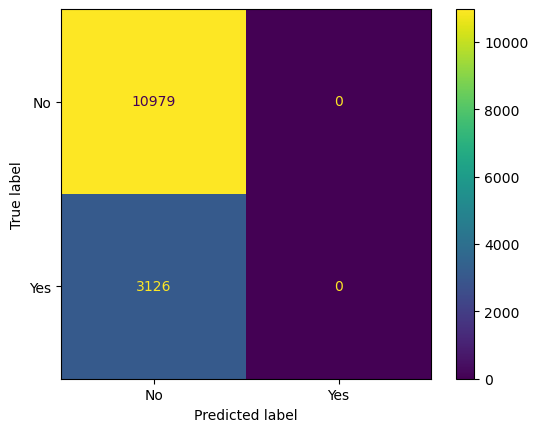

accuracy: 0.77837646224743
precision: Nan
recall: 0.0
specificity: 1.0


In [634]:
cm = confusion_matrix(y_aus_test, dummy.predict(X_aus_test))
plotConfusionMatrix(cm, dummy)

The DummyClassifier() has an accuracy of 0.78, by falling back to the majority class as expected.

In [637]:
df_results['Dummy Australia'] = cm

### LogisticRegression

In [640]:
lgr = LogisticRegression(max_iter=1000).fit(X_aus_train, y_aus_train)
accuracy_score(y_aus_train, lgr.predict(X_aus_train))

0.8598133049745953

In [642]:
accuracy_score(y_aus_test, lgr.predict(X_aus_test))

0.857851825593761

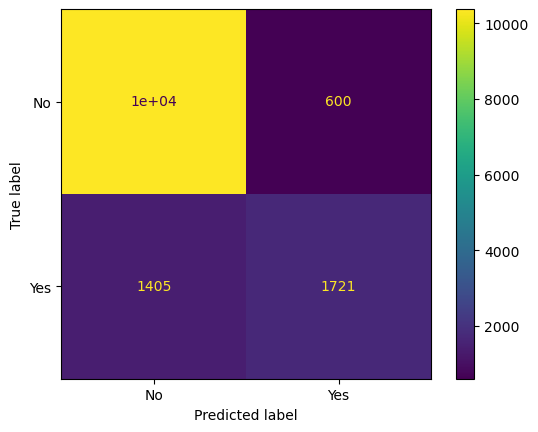

accuracy: 0.857851825593761
precision: 0.7414907367514002
recall: 0.5505438259756877
specificity: 0.945350214044995


In [644]:
cm = confusion_matrix(y_aus_test, lgr.predict(X_aus_test))
plotConfusionMatrix(cm, lgr)

In [645]:
df_results['LogisticRegression Base Australia'] = cm

## Sydney

#### Include both Sydney and SydneyAirport since they very close

In [652]:
syd = df0[(df0['Location'] == 'Sydney') | (df0['Location'] == 'SydneyAirport')]
syd

,Month,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
31168,10,Sydney,12.9,20.3,0.2,3.0,10.9,ENE,37.0,W,E,11.0,26.0,70.0,57.0,1028.8,1025.6,3.0,1.0,16.9,19.8,No,No
31169,10,Sydney,13.3,21.5,0.0,6.6,11.0,ENE,41.0,W,ENE,11.0,28.0,75.0,58.0,1025.9,1022.4,2.0,5.0,17.6,21.3,No,No
31170,10,Sydney,15.3,23.0,0.0,5.6,11.0,NNE,41.0,W,ENE,6.0,19.0,70.0,63.0,1021.4,1017.8,1.0,4.0,19.0,22.2,No,No
31174,10,Sydney,12.9,26.7,0.2,3.8,12.1,NE,33.0,W,ENE,13.0,24.0,73.0,56.0,1018.0,1015.0,1.0,5.0,17.8,22.5,No,No
31175,10,Sydney,14.8,23.8,0.0,6.8,9.6,SSE,54.0,SSE,SE,13.0,26.0,76.0,69.0,1016.0,1014.7,2.0,7.0,20.2,20.6,No,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36524,06,SydneyAirport,8.6,18.6,0.2,2.0,7.8,SSW,56.0,NNW,S,13.0,28.0,69.0,67.0,1025.7,1025.3,2.0,2.0,13.3,17.7,No,No
36525,06,SydneyAirport,9.5,17.8,0.2,2.0,9.2,SW,35.0,NNW,SSE,9.0,9.0,74.0,70.0,1028.3,1024.6,2.0,2.0,14.3,16.8,No,No
36526,06,SydneyAirport,8.7,19.4,0.0,2.4,2.7,NNW,30.0,NW,NW,13.0,15.0,83.0,57.0,1020.8,1014.7,6.0,6.0,10.9,18.2,No,No
36527,06,SydneyAirport,9.4,19.9,0.0,1.4,9.3,SW,43.0,WNW,W,22.0,28.0,61.0,41.0,1017.3,1015.2,5.0,2.0,12.9,19.3,No,No


#### Drop Locatiion

In [655]:
syd = syd.drop(columns=['Location'])

In [656]:
syd1 = featureEncoding(syd, oneHot=True, PolyNomial=False)
syd1

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,RainTomorrow_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.9,20.3,0.2,3.0,10.9,37.0,11.0,26.0,70.0,57.0,1028.8,1025.6,3.0,1.0,16.9,19.8
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.3,21.5,0.0,6.6,11.0,41.0,11.0,28.0,75.0,58.0,1025.9,1022.4,2.0,5.0,17.6,21.3
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.3,23.0,0.0,5.6,11.0,41.0,6.0,19.0,70.0,63.0,1021.4,1017.8,1.0,4.0,19.0,22.2
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.9,26.7,0.2,3.8,12.1,33.0,13.0,24.0,73.0,56.0,1018.0,1015.0,1.0,5.0,17.8,22.5
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,14.8,23.8,0.0,6.8,9.6,54.0,13.0,26.0,76.0,69.0,1016.0,1014.7,2.0,7.0,20.2,20.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4555,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.6,18.6,0.2,2.0,7.8,56.0,13.0,28.0,69.0,67.0,1025.7,1025.3,2.0,2.0,13.3,17.7
4556,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.5,17.8,0.2,2.0,9.2,35.0,9.0,9.0,74.0,70.0,1028.3,1024.6,2.0,2.0,14.3,16.8
4557,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.7,19.4,0.0,2.4,2.7,30.0,13.0,15.0,83.0,57.0,1020.8,1014.7,6.0,6.0,10.9,18.2
4558,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,

### Check Sydney's average and monthly raining probability

In [659]:
syd1[(syd1['RainTomorrow_Yes'] == 1.0)].shape[0]/syd1.shape[0]

0.24802631578947368

Year round average is 24.8%

In [664]:
rainData = {'month': [], 'raining Probability': []}

for m in ['Month_01', 'Month_02', 'Month_03', 'Month_04', 'Month_05', 'Month_06', 'Month_07', 'Month_08', 'Month_09', 'Month_10', 'Month_11', 'Month_12']:
    p = syd1[(syd1[m] == 1.0) & (syd1['RainTomorrow_Yes'] == 1.0)].shape[0] / syd1[syd1[m] == 1.0].shape[0]
    rainData['month'].append(m)
    rainData['raining Probability'].append(p)
rainData
rainDF = pd.DataFrame(rainData)
rainDF

,month,raining Probability
0,Month_01,0.231527
1,Month_02,0.275758
2,Month_03,0.314356
3,Month_04,0.338798
4,Month_05,0.180288
5,Month_06,0.303342
6,Month_07,0.222222
7,Month_08,0.193634
8,Month_09,0.200535
9,Month_10,0.205063


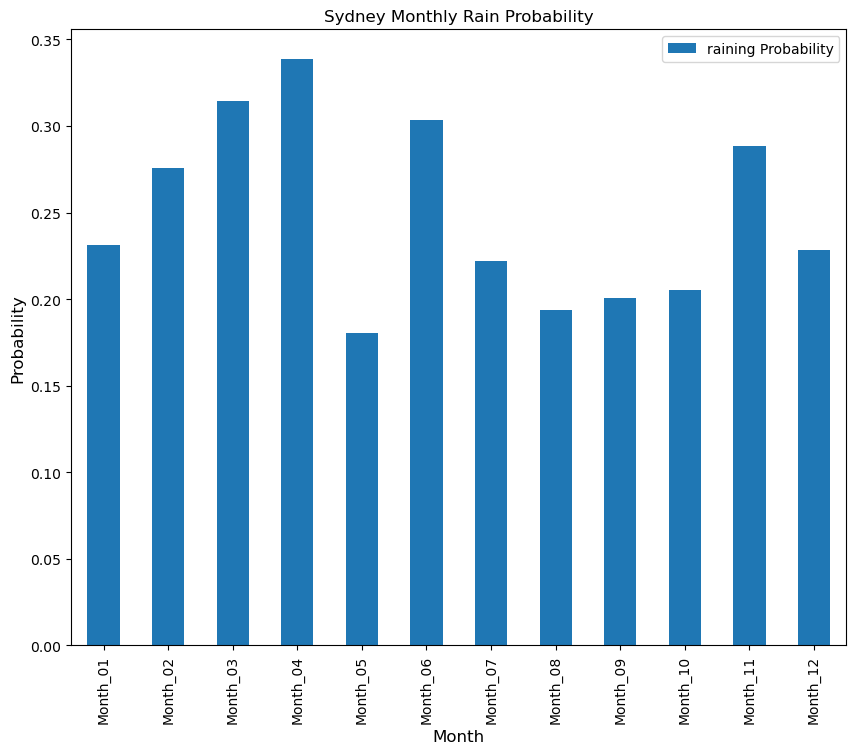

In [665]:
ax = rainDF.plot.bar(x='month', title ="Sydney Monthly Rain Probability", figsize=(10, 8), legend=True)
ax.set_xlabel("Month", fontsize=12)
ax.set_ylabel("Probability", fontsize=12)
plt.show()

### Accuracy of guessing tomorrow's weather is same as today, for Sydney

In [668]:
df2 = df[(df['Location'] == 'Sydney') | (df['Location'] == 'SydneyAirport')]
(df2[(df2['RainToday'] == 'No') & (df2['RainTomorrow'] == 'No')].shape[0] + df2[(df2['RainToday'] == 'Yes') & (df2['RainTomorrow'] == 'Yes')].shape[0]) / df2.shape[0]

0.7410087719298246

The common wisdom guess is still slightly lower than the majority class, which is about 0.752

In [671]:
syd1[syd1.columns] = StandardScaler().fit_transform(syd1[syd1.columns])
syd1

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,RainTomorrow_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,-0.312629,-0.27931,-0.311783,-0.295411,-0.316838,-0.305390,-0.300645,-0.300211,-0.298907,3.247199,-0.304961,-0.282491,-0.210226,3.506346,-0.174667,-0.142697,-0.356034,-0.266790,-0.152019,-0.216407,-0.383627,-0.191924,-0.255774,-0.339794,-0.172657,-0.363808,-0.233099,-0.253822,-0.163694,-0.122115,-0.162987,-0.234664,-0.165101,-0.202721,-0.243884,-0.412469,-0.264424,-0.180579,-0.189454,-0.283846,-0.183791,2.096771,-0.397427,-0.236737,2.846365,-0.346977,-0.274259,-0.142697,-0.397797,-0.167192,-0.135321,-0.175996,-0.346580,-0.298907,-0.299777,-0.241859,-0.127551,-0.235183,-0.236737,-0.183153,-0.573299,-0.574312,-0.442937,-0.640533,-0.326300,-0.816348,0.952002,-0.585698,-0.752423,0.278299,0.306625,0.207571,1.478600,1.356389,-0.451730,-1.226503,-0.316570,-0.440958
1,-0.312629,-0.27931,-0.311783,-0.295411,-0.316838,-0.305390,-0.300645,-0.300211,-0.298907,3.247199,-0.304961,-0.282491,-0.210226,3.506346,-0.174667,-0.142697,-0.356034,-0.266790,-0.152019,-0.216407,-0.383627,-0.191924,-0.255774,-0.339794,-0.172657,-0.363808,-0.233099,-0.253822,-0.163694,-0.122115,-0.162987,-0.234664,-0.165101,-0.202721,-0.243884,-0.412469,-0.264424,-0.180579,-0.189454,-0.283846,-0.183791,2.096771,-0.397427,-0.236737,-0.351325,2.882034,-0.274259,-0.142697,-0.397797,-0.167192,-0.135321,-0.175996,-0.346580,-0.298907,-0.299777,-0.241859,-0.127551,-0.235183,-0.236737,-0.183153,-0.573299,-0.574312,-0.356037,-0.394798,-0.353505,0.459334,0.978487,-0.293538,-0.752423,0.496816,0.624546,0.264419,1.063931,0.901841,-0.819699,0.301912,-0.167673,-0.117728
2,-0.312629,-0.27931,-0.311783,-0.295411,-0.316838,-0.305390,-0.300645,-0.300211,-0.298907,3.247199,-0.304961,-0.282491,-0.210226,-0.285197,-0.174667,-0.142697,-0.356034,3.748267,-0.152019,-0.216407,-0.383627,-0.191924,-0.255774,-0.339794,-0.172657,-0.363808,-0.233099,-0.253822,-0.163694,-0.122115,-0.162987,-0.234664,-0.165101,-0.202721,-0.243884,-0.412469,-0.264424,-0.180579,-0.189454,-0.283846,-0.183791,2.096771,-0.397427,-0.236737,-0.351325,2.882034,-0.274259,-0.142697,-0.397797,-0.167192,-0.135321,-0.175996,-0.346580,-0.298907,-0.299777,-0.241859,-0.127551,-0.235183,-0.236737,-0.183153,-0.573299,-0.574312,0.078462,-0.087629,-0.353505,0.104978,0.978487,-0.293538,-1.357397,-0.486513,0.306625,0.548660,0.420479,0.248428,-1.187668,-0.080192,0.130122,0.076209
3,-0.312629,-0.27931,-0.311783,-0.295411,-0.316838,-0.305390,-0.300645,-0.300211,-0.298907,3.247199,-0.304961,-0.282491,-0.210226,-0.285197,-0.174667,-0.142697,2.808717,-0.266790,-0.152019,-0.216407,-0.383627,-0.191924,-0.255774,-0.339794,-0.172657,-0.363808,-0.233099,-0.253822,-0.163694,-0.122115,-0.162987,-0.234664,-0.165101,-0.202721,-0.243884,-0.412469,-0.264424,-0.180579,-0.189454,-0.283846,-0.183791,2.096771,-0.397427,-0.236737,-0.351325,2.882034,-0.274259,-0.142697,-0.397797,-0.167192,-0.135321,-0.175996,-0.346580,-0.298907,-0.299777,-0.241859,-0.127551,-0.235183,-0.236737,-0.183153,-0.573299,-0.574312,-0.442937,0.670056,-0.326300,-0.532863,1.269813,-0.877858,-0.510433

In [677]:
syd_full_corr_matrix = syd1.corr()

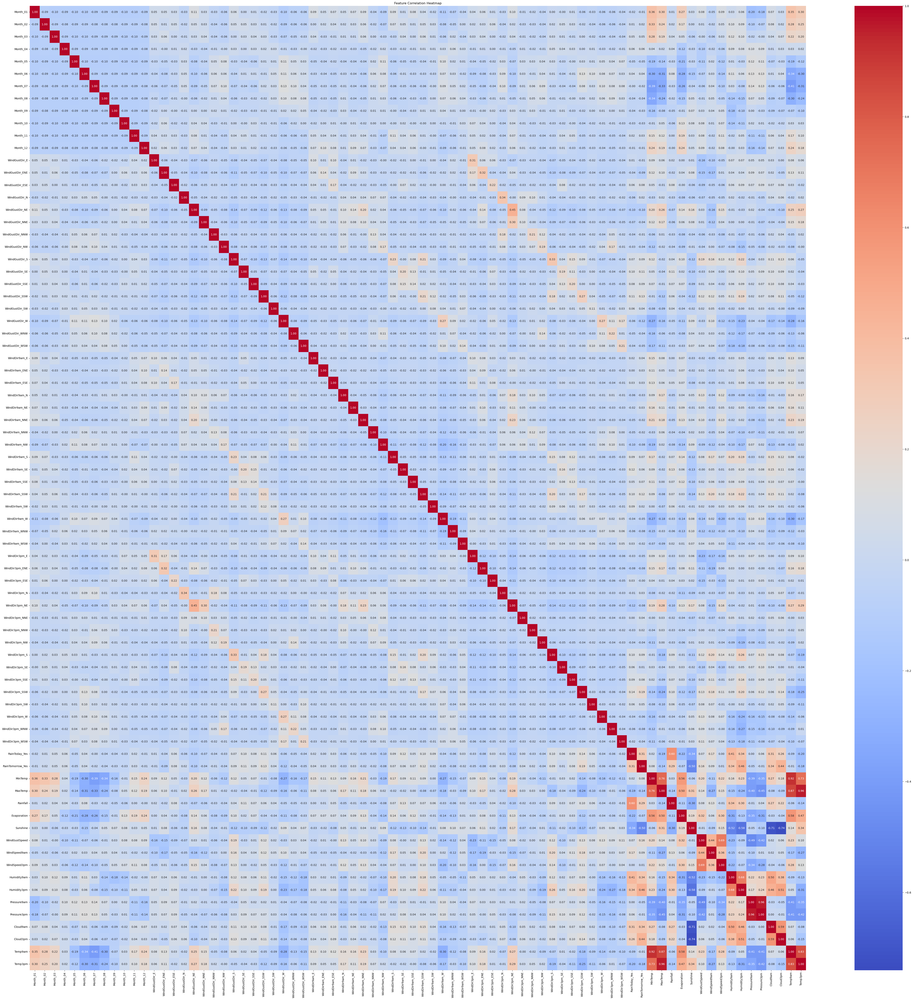

In [679]:
plt.figure(figsize=(64, 64))
sns_plot = sns.heatmap(syd_full_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlation Heatmap')
plt.show()
fig = sns_plot.get_figure()
fig.savefig("sydney_full_heapmap.png", dpi=300)

### Sydney has stronger correlation between numerical features, RainToday and RainTomorrow when compared to the whole Australia
In the Sydney heatmap, we see the colors are slightly deeper for most cells in the lowest 20% rows or rightmost 20% columns.
It makes sense since data for the whole Australia contain cities in different regions, things got averaged out so it won't show characteristics as string as a single city like Sydney here.
For example, the correlations between (temperature, humidity) and Month are stronger. The correlation between (windGust direction, wind direction) and humility are also stronger.

### Let's have a heapmap for numerical features, RainToday and RainTomorrow

In [684]:
selected_clms = ['MinTemp', 'MaxTemp',	'Rainfall',	'Evaporation', 'Sunshine', 'WindGustSpeed',	'WindSpeed9am',	'WindSpeed3pm',	'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm',	'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday_Yes', 'RainTomorrow_Yes']
syd_selected_corr_matrix = syd1[selected_clms].corr()

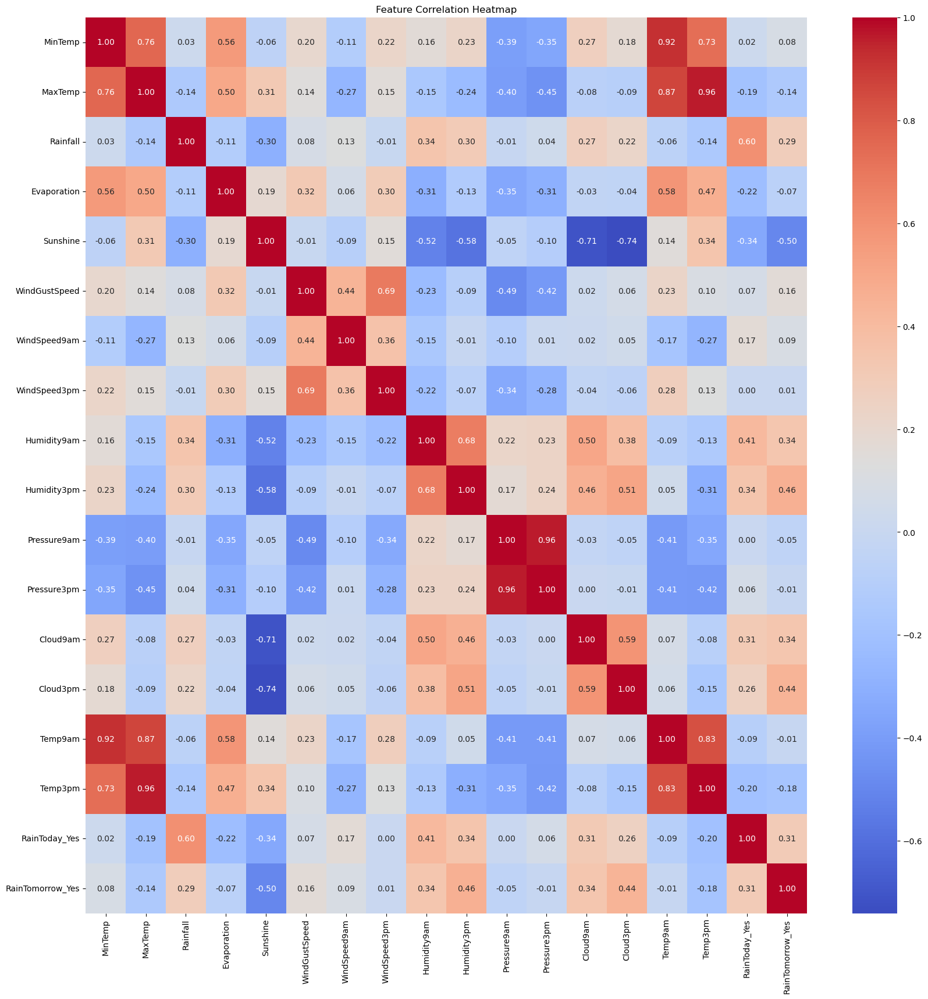

In [685]:
plt.figure(figsize=(20, 20))
sns_plot = sns.heatmap(syd_selected_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlation Heatmap')
plt.show()
fig = sns_plot.get_figure()
fig.savefig("sydney_selected_heapmap.png", dpi=300)

We see humidity has positive correlation with (Cloud, Pressure and rain). We also see pressure has negative correlation with (rain, temperature, cloud, wind speed, evaporation)

### Let's have a heatmap for the months, some of the numerical features, RainToday and RainTomorrow

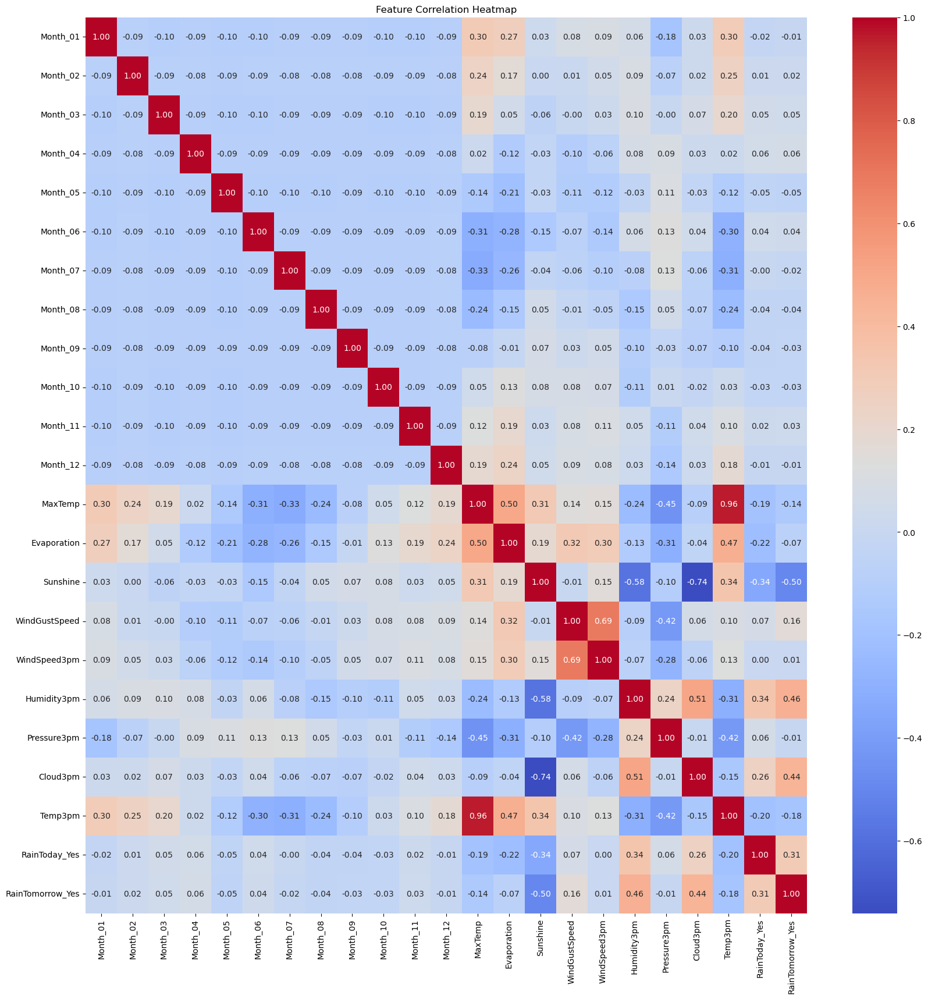

In [688]:
selected_clms2 = ['Month_01', 'Month_02', 'Month_03', 'Month_04', 'Month_05', 'Month_06', 'Month_07', 'Month_08', 'Month_09', 'Month_10', 'Month_11', 'Month_12', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed',	'WindSpeed3pm', 'Humidity3pm', 'Pressure3pm', 'Cloud3pm', 'Temp3pm', 'RainToday_Yes', 'RainTomorrow_Yes']
syd_selected_corr_matrix2 = syd1[selected_clms2].corr()
plt.figure(figsize=(20, 20))
sns_plot = sns.heatmap(syd_selected_corr_matrix2, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlation Heatmap')
plt.show()
fig = sns_plot.get_figure()
fig.savefig("sydney_selected_heapmap2.png", dpi=300)

Here we can see the pattern of temperature, wind speed, pressure, humidity... across the year.

### LogisticRegression for Sydney

In [692]:
X_syd, y_syd = syd.drop('RainTomorrow', axis = 1), syd['RainTomorrow']
X_syd = featureEncoding(X_syd, oneHot=True, PolyNomial=True)
X_syd[X_syd.columns] = StandardScaler().fit_transform(X_syd[X_syd.columns])
X_syd

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Sunshine^2,Sunshine WindGustSpeed,Sunshine WindSpeed9am,Sunshine WindSpeed3pm,Sunshine Humidity9am,Sunshine Humidity3pm,Sunshine Pressure9am,Sunshine Pressure3pm,Sunshine Cloud9am,Sunshine Cloud3pm,Sunshine Temp9am,Sunshine Temp3pm,WindGustSpeed^2,WindGustSpeed WindSpeed9am,WindGustSpeed WindSpeed3pm,WindGustSpeed Humidity9am,WindGustSpeed Humidity3pm,WindGustSpeed Pressure9am,WindGustSpeed Pressure3pm,WindGustSpeed Cloud9am,WindGustSpeed Cloud3pm,WindGustSpeed Temp9am,WindGustSpeed Temp3pm,WindSpeed9am^2,WindSpeed9am WindSpeed3pm,WindSpeed9am Humidity9am,WindSpeed9am Humidity3pm,WindSpeed9am Pressure9am,WindSpeed9am Pressure3pm,WindSpeed9am Cloud9am,WindSpeed9am Cloud3pm,WindSpeed9am Temp9am,WindSpeed9am Temp3pm,WindSpeed3pm^2,WindSpeed3pm Humidity9am,WindSpeed3pm Humidity3pm,WindSpeed3pm Pressure9am,WindSpeed3pm Pressure3pm,WindSpeed3pm Cloud9am,WindSpeed3pm Cloud3pm,WindSpeed3pm Temp9am,WindSpeed3pm Temp3pm,Humidity9am^2,Humidity9am Humidity3pm,Humidity9am Pressure9am,Humidity9am Pressure3pm,Humidity9am Cloud9am,Humidity9am Cloud3pm,Humidity9am Temp9am,Humidity9am Temp3pm,Humidity3pm^2,Humidity3pm Pressure9am,Humidity3pm Pressure3pm,Humidity3pm Cloud9am,Humidity3pm Cloud3pm,Humidity3pm Temp9am,Humidity3pm Temp3pm,Pressure9am^2,Pressure9am Pressure3pm,Pressure9am Cloud9am,Pressure9am Cloud3pm,Pressure9am Temp9am,Pressure9am Temp3pm,Pressure3pm^2,Pressure3pm Cloud9am,Pressure3pm Cloud3pm,Pressure3pm Temp9am,Pressure3pm Temp3pm,Cloud9am^2,Cloud9am Cloud3pm,Cloud9am Temp9am,Cloud9am Temp3pm,Cloud3pm^2,Cloud3pm Temp9am,Cloud3pm Temp3pm,Temp9am^2,Temp9am Temp3pm,Temp3pm^2
0,-0.312629,-0.27931,-0.311783,-0.295411,-0.316838,-0.305390,-0.300645,-0.300211,-0.298907,3.247199,-0.304961,-0.282491,-0.210226,3.506346,-0.174667,-0.142697,-0.356034,-0.266790,-0.152019,-0.216407,-0.383627,-0.191924,-0.255774,-0.339794,-0.172657,-0.363808,-0.233099,-0.253822,-0.163694,

In [695]:
X_syd_train, X_syd_test, y_syd_train, y_syd_test = train_test_split(X_syd, y_syd, random_state=42)
lgr_syd = LogisticRegression(max_iter=1000).fit(X_syd_train, y_syd_train)

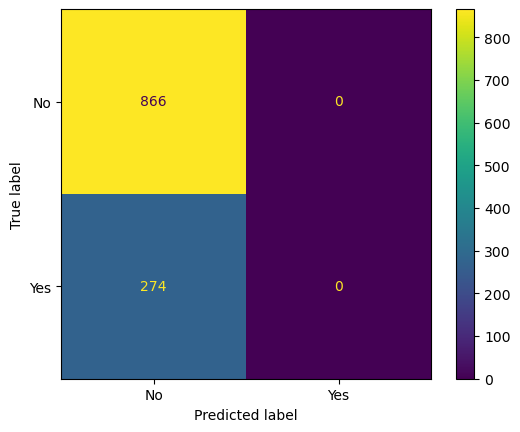

accuracy: 0.7596491228070176
precision: Nan
recall: 0.0
specificity: 1.0


In [696]:
dummy_syd = DummyClassifier().fit(X_syd_train, y_syd_train)
cm = confusion_matrix(y_syd_test, dummy_syd.predict(X_syd_test))
plotConfusionMatrix(cm, dummy_syd)

In [697]:
df_results['Dummy Sydney'] = cm

In [698]:
accuracy_score(y_syd_train, lgr_syd.predict(X_syd_train))

0.8508771929824561

In [699]:
accuracy_score(y_syd_test, lgr_syd.predict(X_syd_test))

0.8526315789473684

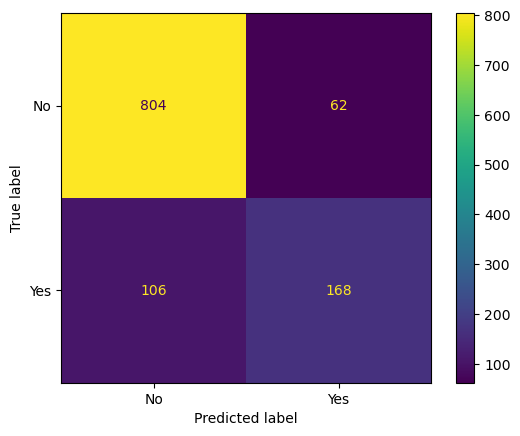

accuracy: 0.8526315789473684
precision: 0.7304347826086957
recall: 0.6131386861313869
specificity: 0.9284064665127021


In [700]:
cm = confusion_matrix(y_syd_test, lgr_syd.predict(X_syd_test))
plotConfusionMatrix(cm, lgr_syd)

In [701]:
df_results['LogisticRegression Base Sydney'] = cm

## Perth

In [704]:
pth = df0[df0['Location'] == 'Perth']
pth

,Month,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
120639,07,Perth,6.4,20.7,0.0,1.8,7.0,NE,22.0,ESE,ENE,6.0,9.0,80.0,39.0,1024.1,1019.0,0.0,6.0,11.1,19.7,No,No
120641,07,Perth,9.5,19.2,1.8,1.2,4.7,W,26.0,NNE,NNW,11.0,6.0,93.0,73.0,1019.3,1018.4,6.0,6.0,13.2,17.7,Yes,Yes
120642,07,Perth,9.5,16.4,1.8,1.4,4.9,WSW,44.0,W,SW,13.0,17.0,69.0,57.0,1020.4,1022.1,7.0,5.0,15.9,16.0,Yes,Yes
120643,07,Perth,0.7,15.9,6.8,2.4,9.3,NNE,24.0,ENE,NE,4.0,7.0,86.0,41.0,1032.0,1029.6,0.0,1.0,6.9,15.5,Yes,No
120644,07,Perth,0.7,18.3,0.0,0.8,9.3,N,37.0,NE,NNE,15.0,13.0,72.0,36.0,1028.9,1024.2,1.0,5.0,8.7,17.9,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123826,06,Perth,10.3,19.9,0.2,1.8,7.5,NW,37.0,NNE,NNW,9.0,15.0,89.0,60.0,1017.1,1013.8,5.0,6.0,13.0,18.5,No,Yes
123827,06,Perth,13.0,16.8,61.2,3.6,0.0,SSW,46.0,W,SW,17.0,17.0,90.0,75.0,1005.6,1008.9,7.0,7.0,16.4,15.6,Yes,No
123828,06,Perth,13.3,18.9,0.4,1.8,6.5,SE,37.0,SE,ESE,11.0,11.0,85.0,65.0,1019.2,1019.4,6.0,6.0,15.1,18.0,No,No
123829,06,Perth,11.5,18.2,0.0,3.8,9.3,SE,30.0,ESE,ESE,9.0,11.0,62.0,47.0,1025.9,1023.4,1.0,3.0,14.0,17.6,No,No


In [705]:
pth = pth.drop(columns=['Location'])
pth

,Month,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
120639,07,6.4,20.7,0.0,1.8,7.0,NE,22.0,ESE,ENE,6.0,9.0,80.0,39.0,1024.1,1019.0,0.0,6.0,11.1,19.7,No,No
120641,07,9.5,19.2,1.8,1.2,4.7,W,26.0,NNE,NNW,11.0,6.0,93.0,73.0,1019.3,1018.4,6.0,6.0,13.2,17.7,Yes,Yes
120642,07,9.5,16.4,1.8,1.4,4.9,WSW,44.0,W,SW,13.0,17.0,69.0,57.0,1020.4,1022.1,7.0,5.0,15.9,16.0,Yes,Yes
120643,07,0.7,15.9,6.8,2.4,9.3,NNE,24.0,ENE,NE,4.0,7.0,86.0,41.0,1032.0,1029.6,0.0,1.0,6.9,15.5,Yes,No
120644,07,0.7,18.3,0.0,0.8,9.3,N,37.0,NE,NNE,15.0,13.0,72.0,36.0,1028.9,1024.2,1.0,5.0,8.7,17.9,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123826,06,10.3,19.9,0.2,1.8,7.5,NW,37.0,NNE,NNW,9.0,15.0,89.0,60.0,1017.1,1013.8,5.0,6.0,13.0,18.5,No,Yes
123827,06,13.0,16.8,61.2,3.6,0.0,SSW,46.0,W,SW,17.0,17.0,90.0,75.0,1005.6,1008.9,7.0,7.0,16.4,15.6,Yes,No
123828,06,13.3,18.9,0.4,1.8,6.5,SE,37.0,SE,ESE,11.0,11.0,85.0,65.0,1019.2,1019.4,6.0,6.0,15.1,18.0,No,No
123829,06,11.5,18.2,0.0,3.8,9.3,SE,30.0,ESE,ESE,9.0,11.0,62.0,47.0,1025.9,1023.4,1.0,3.0,14.0,17.6,No,No


In [706]:
pth1 = featureEncoding(pth, oneHot=True, PolyNomial=False)


### Check Perth's average and monthly raining probability

In [709]:
pth1[(pth1['RainTomorrow_Yes'] == 1.0)].shape[0]/pth1.shape[0]

0.20363636363636364

On average it rains less in Perth

In [713]:
rainData = {'month': [], 'raining Probability': []}

for m in ['Month_01', 'Month_02', 'Month_03', 'Month_04', 'Month_05', 'Month_06', 'Month_07', 'Month_08', 'Month_09', 'Month_10', 'Month_11', 'Month_12']:
    p = pth1[(pth1[m] == 1.0) & (pth1['RainTomorrow_Yes'] == 1.0)].shape[0] / pth1[pth1[m] == 1.0].shape[0]
    rainData['month'].append(m)
    rainData['raining Probability'].append(p)
rainData
rainDF = pd.DataFrame(rainData)
rainDF

,month,raining Probability
0,Month_01,0.066914
1,Month_02,0.040179
2,Month_03,0.077206
3,Month_04,0.128440
4,Month_05,0.272727
5,Month_06,0.329004
6,Month_07,0.459677
7,Month_08,0.386100
8,Month_09,0.347170
9,Month_10,0.148014


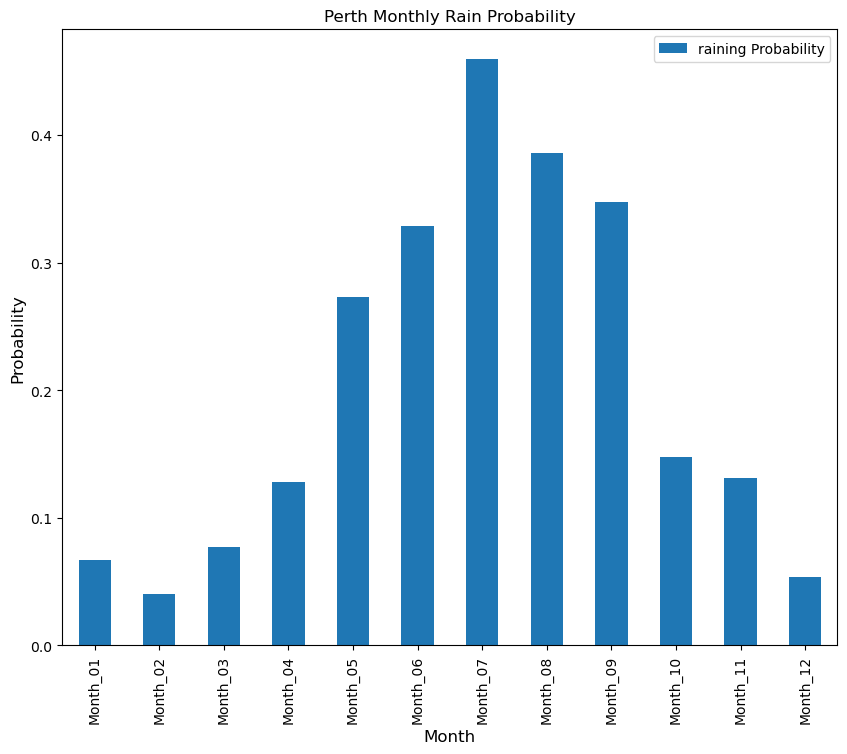

In [714]:
ax = rainDF.plot.bar(x='month', title ="Perth Monthly Rain Probability", figsize=(10, 8), legend=True)
ax.set_xlabel("Month", fontsize=12)
ax.set_ylabel("Probability", fontsize=12)
plt.show()

### Perth has a typical mediterranean climate, very dry in the summer and wet in the winter

### Accuracy of guessing tomorrow's weather is same as today, for Perth

In [729]:
df2 = df[df['Location'] == 'Perth']
(df2[(df2['RainToday'] == 'No') & (df2['RainTomorrow'] == 'No')].shape[0] + df2[(df2['RainToday'] == 'Yes') & (df2['RainTomorrow'] == 'Yes')].shape[0]) / df2.shape[0]

0.8023140495867769

We have better luck in guessing Perth's weather, which is even sligtly better than guessing the majority class

In [737]:
pth1[pth1.columns] = StandardScaler().fit_transform(pth1[pth1.columns])
pth1

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,RainTomorrow_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,-0.312418,-0.282792,-0.314327,-0.278681,-0.302109,-0.287536,3.346279,-0.306002,-0.309862,-0.317491,-0.310502,-0.295546,-0.217802,-0.237097,-0.206746,-0.142254,3.227243,-0.202360,-0.134817,-0.216968,-0.172081,-0.205001,-0.189628,-0.420765,-0.536453,-0.202360,-0.219462,-0.310502,-0.428897,-0.361135,3.338951,-0.191491,-0.390360,-0.294221,-0.1034,-0.142254,-0.266076,-0.249297,-0.290223,-0.200584,-0.192417,-0.195172,-0.159448,-0.179084,-0.21445,4.700171,-0.214450,-0.143458,-0.186804,-0.150501,-0.141039,-0.210199,-0.178098,-0.229216,-0.194257,-0.396523,-0.525198,-0.313691,-0.243256,-0.362887,-0.493276,-0.505676,-1.328990,-0.737081,-0.323062,-1.147644,-0.538355,-1.412358,-1.116464,-1.118194,1.054241,-0.459687,0.994354,0.615860,-1.201320,0.954267,-1.447300,-0.663980
1,-0.312418,-0.282792,-0.314327,-0.278681,-0.302109,-0.287536,3.346279,-0.306002,-0.309862,-0.317491,-0.310502,-0.295546,-0.217802,-0.237097,-0.206746,-0.142254,-0.309862,-0.202360,-0.134817,-0.216968,-0.172081,-0.205001,-0.189628,-0.420765,-0.536453,4.941677,-0.219462,-0.310502,-0.428897,-0.361135,-0.299495,-0.191491,-0.390360,3.398804,-0.1034,-0.142254,-0.266076,-0.249297,-0.290223,-0.200584,-0.192417,-0.195172,-0.159448,-0.179084,-0.21445,-0.212758,-0.214450,-0.143458,-0.186804,-0.150501,7.090218,-0.210199,-0.178098,-0.229216,-0.194257,-0.396523,-0.525198,-0.313691,-0.243256,-0.362887,2.027263,1.977553,-0.710968,-0.983428,-0.008830,-1.323299,-1.202553,-0.984841,-0.037315,-1.708000,1.809011,1.579510,0.255685,0.517081,0.947912,0.954267,-1.050053,-1.005426
2,-0.312418,-0.282792,-0.314327,-0.278681,-0.302109,-0.287536,3.346279,-0.306002,-0.309862,-0.317491,-0.310502,-0.295546,-0.217802,-0.237097,-0.206746,-0.142254,-0.309862,-0.202360,-0.134817,-0.216968,-0.172081,-0.205001,-0.189628,-0.420765,-0.536453,-0.202360,-0.219462,3.220587,-0.428897,-0.361135,-0.299495,-0.191491,-0.390360,-0.294221,-0.1034,-0.142254,-0.266076,-0.249297,-0.290223,-0.200584,-0.192417,5.123695,-0.159448,-0.179084,-0.21445,-0.212758,-0.214450,-0.143458,-0.186804,-0.150501,-0.141039,-0.210199,-0.178098,-0.229216,-0.194257,-0.396523,1.904044,-0.313691,-0.243256,-0.362887,2.027263,1.977553,-0.710968,-1.443275,-0.008830,-1.264747,-1.144796,0.938981,0.394344,0.454622,0.415589,0.619888,0.424964,1.126219,1.306117,0.582083,-0.539306,-1.295655
3,-0.312418,-0.282792,-0.314327,-0.278681,-0.302109,-0.287536,3.346279,-0.306002,-0.309862,-0.317491,-0.310502,-0.295546,-0.217802,-0.237097,-0.206746,-0.142254,-0.309862,4.941677,-0.134817,-0.216968,-0.172081,-0.205001,-0.189628,-0.420765,-0.536453,-0.202360,-0.219462,-0.310502,-0.428897,2.769047,-0.299495,-0.191491,-0.390360,-0.294221,-0.1034,-0.142254,-0.266076,-0.249297,-0.290223,-0.200584,-0.192417,-0.195172,-0.159448,-0.179084,-0.21445,-0.212758,-0.214450,-0.143458,5.353211,-0.150501,-0.141039,-0.210199,-0.178098,-0.229216,-0.194257,-0.396523,-0.525198,-0.313691,-0.243256,-0.362887,2.027263,-0.505676,-2.465353,-1.525391,0.864037,-0.971988,0.125842,-1.198599,-1.548124,-1.51139

In [738]:
pth_full_corr_matrix = pth1.corr()

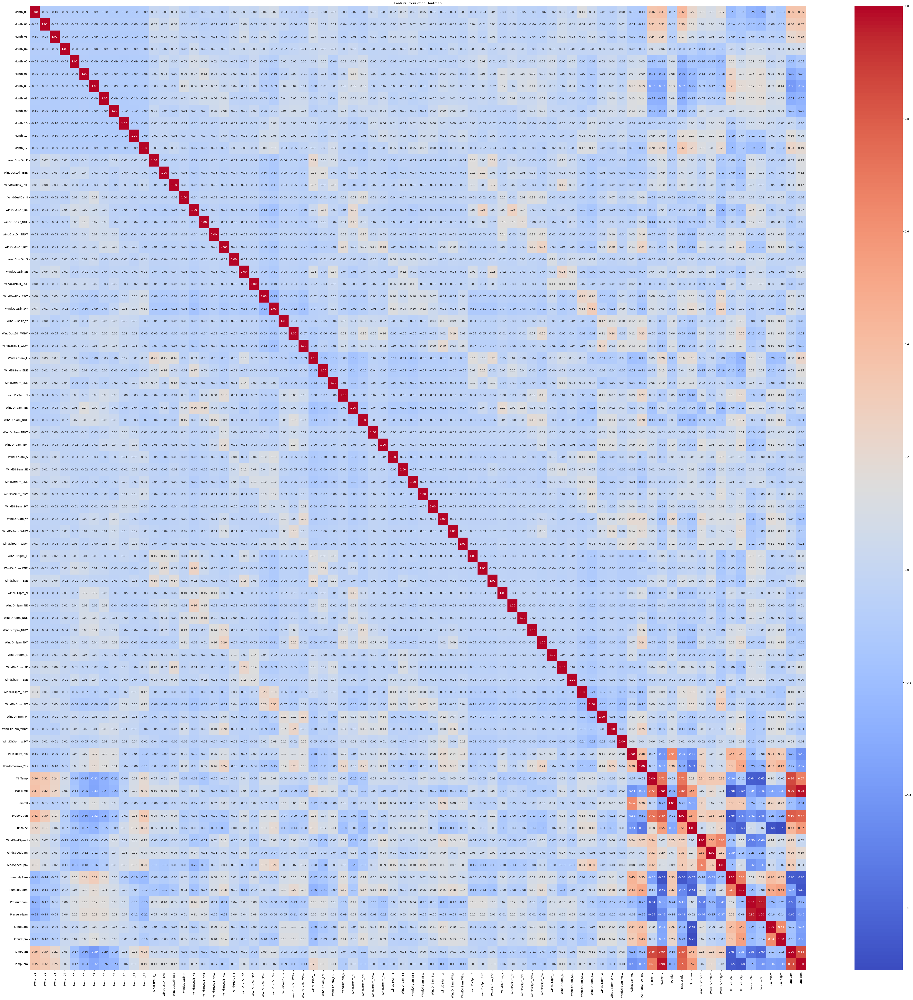

In [741]:
plt.figure(figsize=(64, 64))
sns_plot = sns.heatmap(pth_full_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlation Heatmap')
plt.show()
fig = sns_plot.get_figure()
fig.savefig("perth_full_heapmap.png", dpi=300)

### The Perth correlation heapmap also shows stronger correlation between numerical features, RainToday and RainTomorrow when compared to the whole Australia¶
Compared to Sydney, the lower left corners have a few wider blue(negative correlation) strips, they are temperture and Month correlation - the wider blue strips mean Perth have more cool/cold months.

In [743]:
selected_clms = ['MinTemp', 'MaxTemp',	'Rainfall',	'Evaporation', 'Sunshine', 'WindGustSpeed',	'WindSpeed9am',	'WindSpeed3pm',	'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm',	'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday_Yes', 'RainTomorrow_Yes']
pth_selected_corr_matrix = pth1[selected_clms].corr()

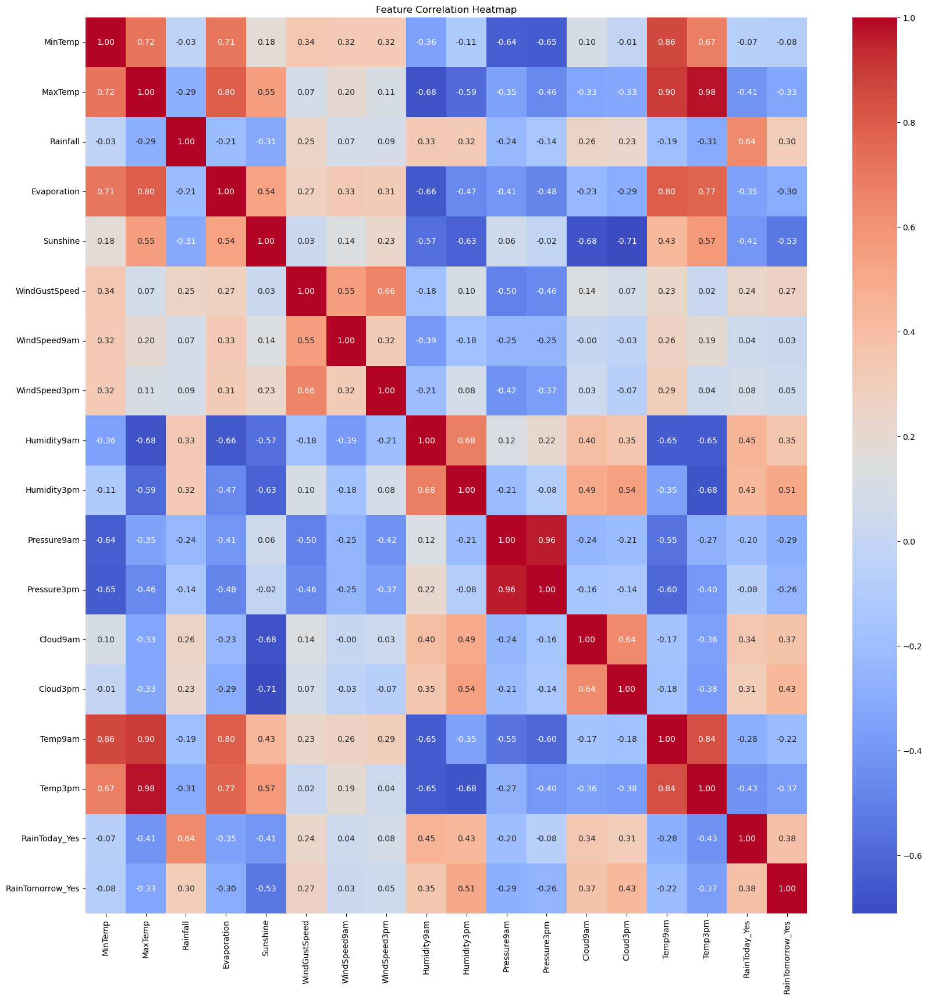

In [744]:
plt.figure(figsize=(20, 20))
sns_plot = sns.heatmap(pth_selected_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlation Heatmap')
plt.show()
fig = sns_plot.get_figure()
fig.savefig("perth_selected_heapmap.png", dpi=300)

Pressure has strong negative correlation with RainTomorrow, Humidity and Cloud have string positive correlatioin with RainTomorrow. As expected RainToday also have strong correlation with RainTomorrow. 

### Heatmap for the months, some of the numerical features, RainToday and RainTomorrow

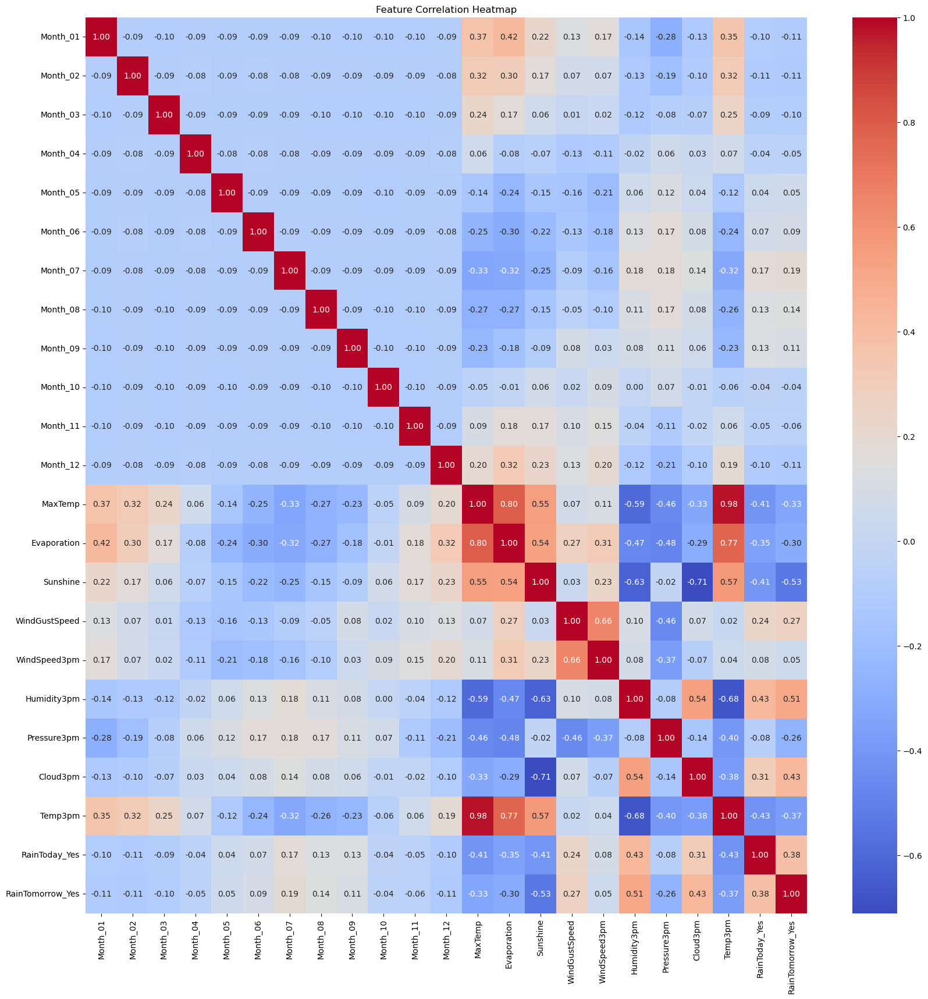

In [749]:
selected_clms2 = ['Month_01', 'Month_02', 'Month_03', 'Month_04', 'Month_05', 'Month_06', 'Month_07', 'Month_08', 'Month_09', 'Month_10', 'Month_11', 'Month_12', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed',	'WindSpeed3pm', 'Humidity3pm', 'Pressure3pm', 'Cloud3pm', 'Temp3pm', 'RainToday_Yes', 'RainTomorrow_Yes']
pth_selected_corr_matrix2 = pth1[selected_clms2].corr()
plt.figure(figsize=(20, 20))
sns_plot = sns.heatmap(pth_selected_corr_matrix2, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlation Heatmap')
plt.show()
fig = sns_plot.get_figure()
fig.savefig("perth_selected_heapmap2.png", dpi=300)

The weather pattern across the year is quite visible.

In [752]:
X_pth, y_pth = pth.drop('RainTomorrow', axis = 1), pth['RainTomorrow']
X_pth = featureEncoding(X_pth, oneHot=True, PolyNomial=True)
X_pth[X_pth.columns] = StandardScaler().fit_transform(X_pth[X_pth.columns])
X_pth

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Sunshine^2,Sunshine WindGustSpeed,Sunshine WindSpeed9am,Sunshine WindSpeed3pm,Sunshine Humidity9am,Sunshine Humidity3pm,Sunshine Pressure9am,Sunshine Pressure3pm,Sunshine Cloud9am,Sunshine Cloud3pm,Sunshine Temp9am,Sunshine Temp3pm,WindGustSpeed^2,WindGustSpeed WindSpeed9am,WindGustSpeed WindSpeed3pm,WindGustSpeed Humidity9am,WindGustSpeed Humidity3pm,WindGustSpeed Pressure9am,WindGustSpeed Pressure3pm,WindGustSpeed Cloud9am,WindGustSpeed Cloud3pm,WindGustSpeed Temp9am,WindGustSpeed Temp3pm,WindSpeed9am^2,WindSpeed9am WindSpeed3pm,WindSpeed9am Humidity9am,WindSpeed9am Humidity3pm,WindSpeed9am Pressure9am,WindSpeed9am Pressure3pm,WindSpeed9am Cloud9am,WindSpeed9am Cloud3pm,WindSpeed9am Temp9am,WindSpeed9am Temp3pm,WindSpeed3pm^2,WindSpeed3pm Humidity9am,WindSpeed3pm Humidity3pm,WindSpeed3pm Pressure9am,WindSpeed3pm Pressure3pm,WindSpeed3pm Cloud9am,WindSpeed3pm Cloud3pm,WindSpeed3pm Temp9am,WindSpeed3pm Temp3pm,Humidity9am^2,Humidity9am Humidity3pm,Humidity9am Pressure9am,Humidity9am Pressure3pm,Humidity9am Cloud9am,Humidity9am Cloud3pm,Humidity9am Temp9am,Humidity9am Temp3pm,Humidity3pm^2,Humidity3pm Pressure9am,Humidity3pm Pressure3pm,Humidity3pm Cloud9am,Humidity3pm Cloud3pm,Humidity3pm Temp9am,Humidity3pm Temp3pm,Pressure9am^2,Pressure9am Pressure3pm,Pressure9am Cloud9am,Pressure9am Cloud3pm,Pressure9am Temp9am,Pressure9am Temp3pm,Pressure3pm^2,Pressure3pm Cloud9am,Pressure3pm Cloud3pm,Pressure3pm Temp9am,Pressure3pm Temp3pm,Cloud9am^2,Cloud9am Cloud3pm,Cloud9am Temp9am,Cloud9am Temp3pm,Cloud3pm^2,Cloud3pm Temp9am,Cloud3pm Temp3pm,Temp9am^2,Temp9am Temp3pm,Temp3pm^2
0,-0.312418,-0.282792,-0.314327,-0.278681,-0.302109,-0.287536,3.346279,-0.306002,-0.309862,-0.317491,-0.310502,-0.295546,-0.217802,-0.237097,-0.206746,-0.142254,3.227243,-0.202360,-0.134817,-0.216968,-0.172081,-0.205001,-0.189628,-0.420765,-0.536453,-0.202360,-0.219462,-0.310502,-0.428897

In [753]:
X_pth_train, X_pth_test, y_pth_train, y_pth_test = train_test_split(X_pth, y_pth, random_state=42)
lgr_pth = LogisticRegression(max_iter=1000).fit(X_pth_train, y_pth_train)

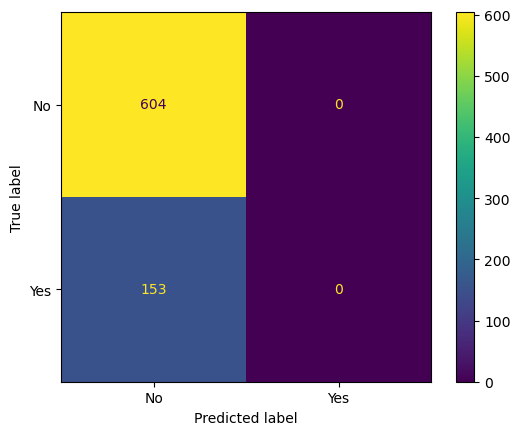

accuracy: 0.797886393659181
precision: Nan
recall: 0.0
specificity: 1.0


In [754]:
dummy_pth = DummyClassifier().fit(X_pth_train, y_pth_train)
cm = confusion_matrix(y_pth_test, dummy_pth.predict(X_pth_test))
plotConfusionMatrix(cm, dummy_pth)

In [755]:
df_results['Dummy Perth'] = cm

In [756]:
accuracy_score(y_pth_train, lgr_pth.predict(X_pth_train))

0.9307760141093474

In [757]:
accuracy_score(y_pth_test, lgr_pth.predict(X_pth_test))

0.8996036988110965

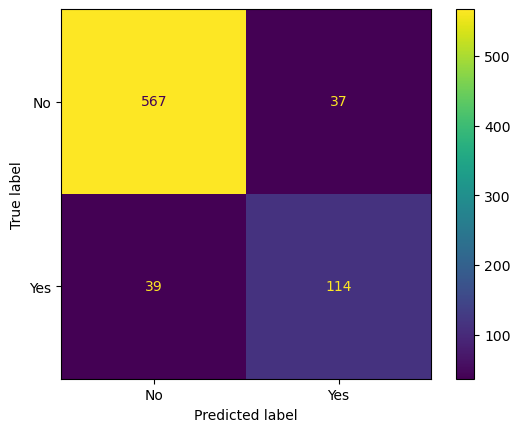

accuracy: 0.8996036988110965
precision: 0.7549668874172185
recall: 0.7450980392156863
specificity: 0.9387417218543046


In [758]:
cm = confusion_matrix(y_pth_test, lgr_pth.predict(X_pth_test))
plotConfusionMatrix(cm, lgr_pth)

In [759]:
df_results['LogisticRegression Base Perth'] = cm

### The LogisticRegression model has much better performance for Perth.
Perth weather is easier to predict (more stable) I suppose, this might be the case for most places, like California, with mediterranean climate.

# Optimization and model comparison
The following steps are applied to process the data:
- convert terperature values from Celsius to kelvin
- calculate and add square root features for numerical features
- OneHotEncoder, PolynomialFeatures, StandardScaler
- class_weights='balanced'

The following models are used:
- LogisticRgression
- SVM
- DecisionTreeClassifier
- KNeighborsClassifier
- RandomForestClassifier
- GradientBoostingClassifie

### Feature Engineering to include square root of numerical values

In [770]:
df0

,Month,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
6049,01,Cobar,17.9,35.2,0.0,12.0,12.3,SSW,48.0,ENE,SW,6.0,20.0,20.0,13.0,1006.3,1004.4,2.0,5.0,26.6,33.4,No,No
6050,01,Cobar,18.4,28.9,0.0,14.8,13.0,S,37.0,SSE,SSE,19.0,19.0,30.0,8.0,1012.9,1012.1,1.0,1.0,20.3,27.0,No,No
6052,01,Cobar,19.4,37.6,0.0,10.8,10.6,NNE,46.0,NNE,NNW,30.0,15.0,42.0,22.0,1012.3,1009.2,1.0,6.0,28.7,34.9,No,No
6053,01,Cobar,21.9,38.4,0.0,11.4,12.2,WNW,31.0,WNW,WSW,6.0,6.0,37.0,22.0,1012.7,1009.1,1.0,5.0,29.1,35.6,No,No
6054,01,Cobar,24.2,41.0,0.0,11.2,8.4,WNW,35.0,NW,WNW,17.0,13.0,19.0,15.0,1010.7,1007.4,1.0,6.0,33.6,37.6,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142298,06,Darwin,19.3,33.4,0.0,6.0,11.0,ENE,35.0,SE,NE,9.0,20.0,63.0,32.0,1013.9,1010.5,0.0,1.0,24.5,32.3,No,No
142299,06,Darwin,21.2,32.6,0.0,7.6,8.6,E,37.0,SE,SE,13.0,11.0,56.0,28.0,1014.6,1011.2,7.0,0.0,24.8,32.0,No,No
142300,06,Darwin,20.7,32.8,0.0,5.6,11.0,E,33.0,E,W,17.0,11.0,46.0,23.0,1015.3,1011.8,0.0,0.0,24.8,32.1,No,No
142301,06,Darwin,19.5,31.8,0.0,6.2,10.6,ESE,26.0,SE,NNW,9.0,17.0,62.0,58.0,1014.9,1010.7,1.0,1.0,24.8,29.2,No,No


#### define numerical_selector()

In [782]:
numerical_selector = make_column_selector(dtype_include=['int64', 'float64'])

### change temperature to Kelvin based

In [785]:
df_aus = df0.copy()

In [787]:
df_aus['MinTemp'] = df_aus['MinTemp'] + 273.15
df_aus['MaxTemp'] = df_aus['MaxTemp'] + 273.15
df_aus['Temp9am'] = df_aus['Temp9am'] + 273.15
df_aus['Temp3pm'] = df_aus['Temp3pm'] + 273.15

In [789]:
df_aus['RainTomorrow'] = df_aus['RainTomorrow'].map(lambda x: 1 if x=='Yes' else 0)

In [791]:
df_aus

,Month,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
6049,01,Cobar,291.05,308.35,0.0,12.0,12.3,SSW,48.0,ENE,SW,6.0,20.0,20.0,13.0,1006.3,1004.4,2.0,5.0,299.75,306.55,No,0
6050,01,Cobar,291.55,302.05,0.0,14.8,13.0,S,37.0,SSE,SSE,19.0,19.0,30.0,8.0,1012.9,1012.1,1.0,1.0,293.45,300.15,No,0
6052,01,Cobar,292.55,310.75,0.0,10.8,10.6,NNE,46.0,NNE,NNW,30.0,15.0,42.0,22.0,1012.3,1009.2,1.0,6.0,301.85,308.05,No,0
6053,01,Cobar,295.05,311.55,0.0,11.4,12.2,WNW,31.0,WNW,WSW,6.0,6.0,37.0,22.0,1012.7,1009.1,1.0,5.0,302.25,308.75,No,0
6054,01,Cobar,297.35,314.15,0.0,11.2,8.4,WNW,35.0,NW,WNW,17.0,13.0,19.0,15.0,1010.7,1007.4,1.0,6.0,306.75,310.75,No,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142298,06,Darwin,292.45,306.55,0.0,6.0,11.0,ENE,35.0,SE,NE,9.0,20.0,63.0,32.0,1013.9,1010.5,0.0,1.0,297.65,305.45,No,0
142299,06,Darwin,294.35,305.75,0.0,7.6,8.6,E,37.0,SE,SE,13.0,11.0,56.0,28.0,1014.6,1011.2,7.0,0.0,297.95,305.15,No,0
142300,06,Darwin,293.85,305.95,0.0,5.6,11.0,E,33.0,E,W,17.0,11.0,46.0,23.0,1015.3,1011.8,0.0,0.0,297.95,305.25,No,0
142301,06,Darwin,292.65,304.95,0.0,6.2,10.6,ESE,26.0,SE,NNW,9.0,17.0,62.0,58.0,1014.9,1010.7,1.0,1.0,297.95,302.35,No,0


### Prepare DataFrames for Sydney and Perth

In [795]:
df_syd = df_aus[(df_aus['Location'] == 'Sydney') | (df_aus['Location'] == 'SydneyAirport')]

In [797]:
df_syd

,Month,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
31168,10,Sydney,286.05,293.45,0.2,3.0,10.9,ENE,37.0,W,E,11.0,26.0,70.0,57.0,1028.8,1025.6,3.0,1.0,290.05,292.95,No,0
31169,10,Sydney,286.45,294.65,0.0,6.6,11.0,ENE,41.0,W,ENE,11.0,28.0,75.0,58.0,1025.9,1022.4,2.0,5.0,290.75,294.45,No,0
31170,10,Sydney,288.45,296.15,0.0,5.6,11.0,NNE,41.0,W,ENE,6.0,19.0,70.0,63.0,1021.4,1017.8,1.0,4.0,292.15,295.35,No,0
31174,10,Sydney,286.05,299.85,0.2,3.8,12.1,NE,33.0,W,ENE,13.0,24.0,73.0,56.0,1018.0,1015.0,1.0,5.0,290.95,295.65,No,0
31175,10,Sydney,287.95,296.95,0.0,6.8,9.6,SSE,54.0,SSE,SE,13.0,26.0,76.0,69.0,1016.0,1014.7,2.0,7.0,293.35,293.75,No,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36524,06,SydneyAirport,281.75,291.75,0.2,2.0,7.8,SSW,56.0,NNW,S,13.0,28.0,69.0,67.0,1025.7,1025.3,2.0,2.0,286.45,290.85,No,0
36525,06,SydneyAirport,282.65,290.95,0.2,2.0,9.2,SW,35.0,NNW,SSE,9.0,9.0,74.0,70.0,1028.3,1024.6,2.0,2.0,287.45,289.95,No,0
36526,06,SydneyAirport,281.85,292.55,0.0,2.4,2.7,NNW,30.0,NW,NW,13.0,15.0,83.0,57.0,1020.8,1014.7,6.0,6.0,284.05,291.35,No,0
36527,06,SydneyAirport,282.55,293.05,0.0,1.4,9.3,SW,43.0,WNW,W,22.0,28.0,61.0,41.0,1017.3,1015.2,5.0,2.0,286.05,292.45,No,0


In [798]:
df_pth = df_aus[df_aus['Location'] == 'Perth']

In [799]:
df_pth

,Month,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
120639,07,Perth,279.55,293.85,0.0,1.8,7.0,NE,22.0,ESE,ENE,6.0,9.0,80.0,39.0,1024.1,1019.0,0.0,6.0,284.25,292.85,No,0
120641,07,Perth,282.65,292.35,1.8,1.2,4.7,W,26.0,NNE,NNW,11.0,6.0,93.0,73.0,1019.3,1018.4,6.0,6.0,286.35,290.85,Yes,1
120642,07,Perth,282.65,289.55,1.8,1.4,4.9,WSW,44.0,W,SW,13.0,17.0,69.0,57.0,1020.4,1022.1,7.0,5.0,289.05,289.15,Yes,1
120643,07,Perth,273.85,289.05,6.8,2.4,9.3,NNE,24.0,ENE,NE,4.0,7.0,86.0,41.0,1032.0,1029.6,0.0,1.0,280.05,288.65,Yes,0
120644,07,Perth,273.85,291.45,0.0,0.8,9.3,N,37.0,NE,NNE,15.0,13.0,72.0,36.0,1028.9,1024.2,1.0,5.0,281.85,291.05,No,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123826,06,Perth,283.45,293.05,0.2,1.8,7.5,NW,37.0,NNE,NNW,9.0,15.0,89.0,60.0,1017.1,1013.8,5.0,6.0,286.15,291.65,No,1
123827,06,Perth,286.15,289.95,61.2,3.6,0.0,SSW,46.0,W,SW,17.0,17.0,90.0,75.0,1005.6,1008.9,7.0,7.0,289.55,288.75,Yes,0
123828,06,Perth,286.45,292.05,0.4,1.8,6.5,SE,37.0,SE,ESE,11.0,11.0,85.0,65.0,1019.2,1019.4,6.0,6.0,288.25,291.15,No,0
123829,06,Perth,284.65,291.35,0.0,3.8,9.3,SE,30.0,ESE,ESE,9.0,11.0,62.0,47.0,1025.9,1023.4,1.0,3.0,287.15,290.75,No,0


### Feature engineering and encoding for Australia, create square_root features for numerical features

In [805]:
X_aus, y_aus = df_aus.drop(columns=['Location', 'RainTomorrow']), df_aus['RainTomorrow']
for f in numerical_selector(X_aus):
    X_aus[f+'_sq_root'] = X_aus[f] ** (1/2)
X_aus = featureEncoding(X_aus, oneHot=True, PolyNomial=True)
X_aus = X_aus.drop(columns=['MinTemp_sq_root^2', 'MaxTemp_sq_root^2', 'Rainfall_sq_root^2', 'Evaporation_sq_root^2', 'Sunshine_sq_root^2', 'WindGustSpeed_sq_root^2', 'WindSpeed9am_sq_root^2', 'WindSpeed3pm_sq_root^2', 'Humidity9am_sq_root^2', 'Humidity3pm_sq_root^2', 'Pressure9am_sq_root^2', 'Pressure3pm_sq_root^2', 'Cloud9am_sq_root^2', 'Cloud3pm_sq_root^2', 'Temp9am_sq_root^2', 'Temp3pm_sq_root^2'])
X_aus

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTemp_sq_root,MaxTemp_sq_root,Rainfall_sq_root,Evaporation_sq_root,Sunshine_sq_root,WindGustSpeed_sq_root,WindSpeed9am_sq_root,WindSpeed3pm_sq_root,Humidity9am_sq_root,Humidity3pm_sq_root,Pressure9am_sq_root,Pressure3pm_sq_root,Cloud9am_sq_root,Cloud3pm_sq_root,Temp9am_sq_root,Temp3pm_sq_root,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MinTemp MinTemp_sq_root,MinTemp MaxTemp_sq_root,MinTemp Rainfall_sq_root,MinTemp Evaporation_sq_root,MinTemp Sunshine_sq_root,MinTemp WindGustSpeed_sq_root,MinTemp WindSpeed9am_sq_root,MinTemp WindSpeed3pm_sq_root,MinTemp Humidity9am_sq_root,MinTemp Humidity3pm_sq_root,MinTemp Pressure9am_sq_root,MinTemp Pressure3pm_sq_root,MinTemp Cloud9am_sq_root,MinTemp Cloud3pm_sq_root,MinTemp Temp9am_sq_root,MinTemp Temp3pm_sq_root,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,MaxTemp MinTemp_sq_root,MaxTemp MaxTemp_sq_root,MaxTemp Rainfall_sq_root,MaxTemp Evaporation_sq_root,MaxTemp Sunshine_sq_root,MaxTemp WindGustSpeed_sq_root,MaxTemp WindSpeed9am_sq_root,MaxTemp WindSpeed3pm_sq_root,MaxTemp Humidity9am_sq_root,MaxTemp Humidity3pm_sq_root,MaxTemp Pressure9am_sq_root,MaxTemp Pressure3pm_sq_root,MaxTemp Cloud9am_sq_root,MaxTemp Cloud3pm_sq_root,MaxTemp Temp9am_sq_root,MaxTemp Temp3pm_sq_root,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Rainfall MinTemp_sq_root,Rainfall MaxTemp_sq_root,Rainfall Rainfall_sq_root,Rainfall Evaporation_sq_root,Rainfall Sunshine_sq_root,Rainfall WindGustSpeed_sq_root,Rainfall WindSpeed9am_sq_root,Rainfall WindSpeed3pm_sq_root,Rainfall Humidity9am_sq_root,Rainfall Humidity3pm_sq_root,Rainfall Pressure9am_sq_root,Rainfall Pressure3pm_sq_root,Rainfall Cloud9am_sq_root,Rainfall Cloud3pm_sq_root,Rainfall Temp9am_sq_root,Rainfall Temp3pm_sq_root,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Evaporation MinTemp_sq_root,Evaporation MaxTemp_sq_root,Evaporation Rainfall_sq_root,Evaporation Evaporation_sq_root,Evaporation Sunshine_sq_root,Evaporation WindGustSpeed_sq_root,Evaporation WindSpeed9am_sq_root,Evaporation WindSpeed3pm_sq_root,Evaporation Humidity9am_sq_root,Evaporation Humidity3pm

In [807]:
X_aus[X_aus.columns] = StandardScaler().fit_transform(X_aus[X_aus.columns])
X_aus_train, X_aus_test, y_aus_train, y_aus_test = train_test_split(X_aus, y_aus, random_state=42)

### LogisticRegression Australia

It doesn't make sense to do a single forecast for a large country like Australia, here I will just use a the simple LogisticRegression() to obtain a number for the record

In [812]:
lgr = LogisticRegression(max_iter=1000).fit(X_aus_train, y_aus_train)
accuracy_score(y_aus_train, lgr.predict(X_aus_train))

0.8612312418764032

In [813]:
accuracy_score(y_aus_test, lgr.predict(X_aus_test))

0.8584190003544843

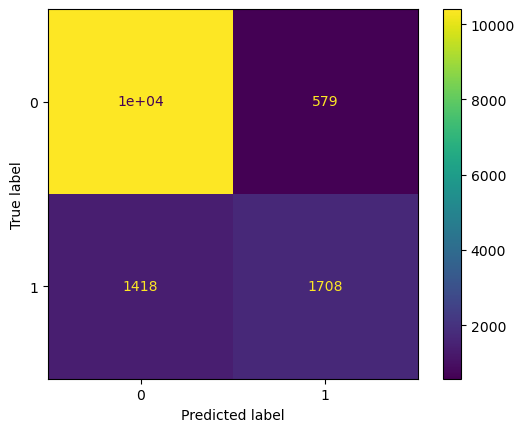

accuracy: 0.8584190003544843
precision: 0.7468299081766506
recall: 0.54638515674984
specificity: 0.9472629565534202


In [814]:
cm = confusion_matrix(y_aus_test, lgr.predict(X_aus_test))
plotConfusionMatrix(cm, lgr)

In [815]:
df_results['LogisticRegression Australia'] = cm

## Sydney
Models for Sydney perform not as good as those for Perth, grid search will be used for Sydney models to find tune hyperparameters custom prediction threshold will also be used, but additional optimizations like class_weights='balanced' and TargetEncoder() will be used for Perth only to reduce the amount of repetitive works

In [818]:
X_syd, y_syd = df_syd.drop(columns=['Location', 'RainTomorrow']), df_syd['RainTomorrow']
for f in numerical_selector(X_syd):
    X_syd[f+'_sq_root'] = X_syd[f] ** (1/2)
X_syd = featureEncoding(X_syd, oneHot=True, PolyNomial=True)
X_syd = X_syd.drop(columns=['MinTemp_sq_root^2', 'MaxTemp_sq_root^2', 'Rainfall_sq_root^2', 'Evaporation_sq_root^2', 'Sunshine_sq_root^2', 'WindGustSpeed_sq_root^2', 'WindSpeed9am_sq_root^2', 'WindSpeed3pm_sq_root^2', 'Humidity9am_sq_root^2', 'Humidity3pm_sq_root^2', 'Pressure9am_sq_root^2', 'Pressure3pm_sq_root^2', 'Cloud9am_sq_root^2', 'Cloud3pm_sq_root^2', 'Temp9am_sq_root^2', 'Temp3pm_sq_root^2'])
X_syd


,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTemp_sq_root,MaxTemp_sq_root,Rainfall_sq_root,Evaporation_sq_root,Sunshine_sq_root,WindGustSpeed_sq_root,WindSpeed9am_sq_root,WindSpeed3pm_sq_root,Humidity9am_sq_root,Humidity3pm_sq_root,Pressure9am_sq_root,Pressure3pm_sq_root,Cloud9am_sq_root,Cloud3pm_sq_root,Temp9am_sq_root,Temp3pm_sq_root,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MinTemp MinTemp_sq_root,MinTemp MaxTemp_sq_root,MinTemp Rainfall_sq_root,MinTemp Evaporation_sq_root,MinTemp Sunshine_sq_root,MinTemp WindGustSpeed_sq_root,MinTemp WindSpeed9am_sq_root,MinTemp WindSpeed3pm_sq_root,MinTemp Humidity9am_sq_root,MinTemp Humidity3pm_sq_root,MinTemp Pressure9am_sq_root,MinTemp Pressure3pm_sq_root,MinTemp Cloud9am_sq_root,MinTemp Cloud3pm_sq_root,MinTemp Temp9am_sq_root,MinTemp Temp3pm_sq_root,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,MaxTemp MinTemp_sq_root,MaxTemp MaxTemp_sq_root,MaxTemp Rainfall_sq_root,MaxTemp Evaporation_sq_root,MaxTemp Sunshine_sq_root,MaxTemp WindGustSpeed_sq_root,MaxTemp WindSpeed9am_sq_root,MaxTemp WindSpeed3pm_sq_root,MaxTemp Humidity9am_sq_root,MaxTemp Humidity3pm_sq_root,MaxTemp Pressure9am_sq_root,MaxTemp Pressure3pm_sq_root,MaxTemp Cloud9am_sq_root,MaxTemp Cloud3pm_sq_root,MaxTemp Temp9am_sq_root,MaxTemp Temp3pm_sq_root,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Rainfall MinTemp_sq_root,Rainfall MaxTemp_sq_root,Rainfall Rainfall_sq_root,Rainfall Evaporation_sq_root,Rainfall Sunshine_sq_root,Rainfall WindGustSpeed_sq_root,Rainfall WindSpeed9am_sq_root,Rainfall WindSpeed3pm_sq_root,Rainfall Humidity9am_sq_root,Rainfall Humidity3pm_sq_root,Rainfall Pressure9am_sq_root,Rainfall Pressure3pm_sq_root,Rainfall Cloud9am_sq_root,Rainfall Cloud3pm_sq_root,Rainfall Temp9am_sq_root,Rainfall Temp3pm_sq_root,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Evaporation MinTemp_sq_root,Evaporation MaxTemp_sq_root,Evaporation Rainfall_sq_root,Evaporation Evaporation_sq_root,Evaporation Sunshine_sq_root,Evaporation WindGustSpeed_sq_root,Evaporation WindSpeed9am_sq_root,Evaporation WindSpeed3pm_sq_root,Evaporation Humidity9am_sq_root,Evaporation Humidity3pm

In [819]:
X_syd[X_syd.columns] = StandardScaler().fit_transform(X_syd[X_syd.columns])
X_syd_train, X_syd_test, y_syd_train, y_syd_test = train_test_split(X_syd, y_syd, random_state=42)

In [820]:
X_syd_train

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTemp_sq_root,MaxTemp_sq_root,Rainfall_sq_root,Evaporation_sq_root,Sunshine_sq_root,WindGustSpeed_sq_root,WindSpeed9am_sq_root,WindSpeed3pm_sq_root,Humidity9am_sq_root,Humidity3pm_sq_root,Pressure9am_sq_root,Pressure3pm_sq_root,Cloud9am_sq_root,Cloud3pm_sq_root,Temp9am_sq_root,Temp3pm_sq_root,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MinTemp MinTemp_sq_root,MinTemp MaxTemp_sq_root,MinTemp Rainfall_sq_root,MinTemp Evaporation_sq_root,MinTemp Sunshine_sq_root,MinTemp WindGustSpeed_sq_root,MinTemp WindSpeed9am_sq_root,MinTemp WindSpeed3pm_sq_root,MinTemp Humidity9am_sq_root,MinTemp Humidity3pm_sq_root,MinTemp Pressure9am_sq_root,MinTemp Pressure3pm_sq_root,MinTemp Cloud9am_sq_root,MinTemp Cloud3pm_sq_root,MinTemp Temp9am_sq_root,MinTemp Temp3pm_sq_root,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,MaxTemp MinTemp_sq_root,MaxTemp MaxTemp_sq_root,MaxTemp Rainfall_sq_root,MaxTemp Evaporation_sq_root,MaxTemp Sunshine_sq_root,MaxTemp WindGustSpeed_sq_root,MaxTemp WindSpeed9am_sq_root,MaxTemp WindSpeed3pm_sq_root,MaxTemp Humidity9am_sq_root,MaxTemp Humidity3pm_sq_root,MaxTemp Pressure9am_sq_root,MaxTemp Pressure3pm_sq_root,MaxTemp Cloud9am_sq_root,MaxTemp Cloud3pm_sq_root,MaxTemp Temp9am_sq_root,MaxTemp Temp3pm_sq_root,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Rainfall MinTemp_sq_root,Rainfall MaxTemp_sq_root,Rainfall Rainfall_sq_root,Rainfall Evaporation_sq_root,Rainfall Sunshine_sq_root,Rainfall WindGustSpeed_sq_root,Rainfall WindSpeed9am_sq_root,Rainfall WindSpeed3pm_sq_root,Rainfall Humidity9am_sq_root,Rainfall Humidity3pm_sq_root,Rainfall Pressure9am_sq_root,Rainfall Pressure3pm_sq_root,Rainfall Cloud9am_sq_root,Rainfall Cloud3pm_sq_root,Rainfall Temp9am_sq_root,Rainfall Temp3pm_sq_root,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Evaporation MinTemp_sq_root,Evaporation MaxTemp_sq_root,Evaporation Rainfall_sq_root,Evaporation Evaporation_sq_root,Evaporation Sunshine_sq_root,Evaporation WindGustSpeed_sq_root,Evaporation WindSpeed9am_sq_root,Evaporation WindSpeed3pm_sq_root,Evaporation Humidity9am_sq_root,Evaporation Humidity3pm

### LogisticRegression Sydney

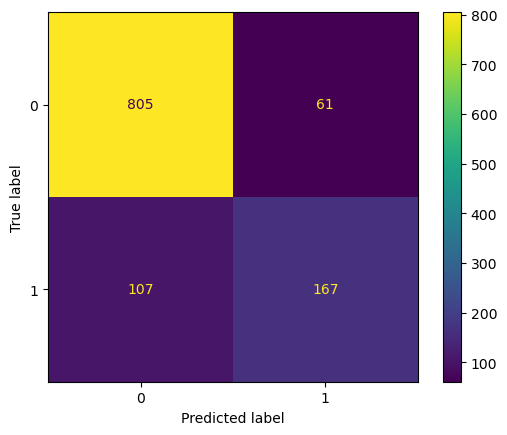

accuracy: 0.8526315789473684
precision: 0.7324561403508771
recall: 0.6094890510948905
specificity: 0.9295612009237876


In [829]:
lgr_syd = LogisticRegression(max_iter=1000).fit(X_syd_train, y_syd_train)
cm = confusion_matrix(y_syd_test, lgr_syd.predict(X_syd_test))
plotConfusionMatrix(cm, lgr_syd)

In [831]:
accuracy_score(y_syd_train, lgr_syd.predict(X_syd_train))

0.8538011695906432

In [833]:
df_results['LogisticRegression Sydney'] = cm

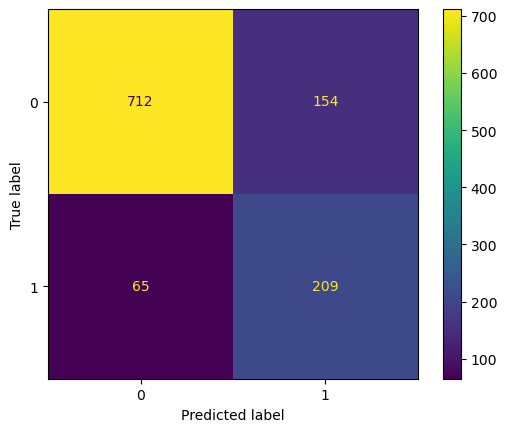

accuracy: 0.8078947368421052
precision: 0.5757575757575758
recall: 0.7627737226277372
specificity: 0.8221709006928406


In [835]:
lgr_syd_preds = custom_predict(lgr_syd, X_syd_test, threshold=0.3)
cm = confusion_matrix(y_syd_test, lgr_syd_preds)
plotConfusionMatrix(cm, lgr_syd)

In [837]:
df_results['LogisticRegression Sydney T03'] = cm

### SVM Sydney

In [841]:
start_time = time.time()
params = {
    'C': [3, 4, 5],
    'kernel': ['rbf'],
    'gamma': np.logspace(-4, -3, 10),}
grid_svc_syd = GridSearchCV(SVC(probability=True), params).fit(X_syd_train, y_syd_train)
print(grid_svc_syd.score(X_syd_test, y_syd_test))
print(grid_svc_syd.best_estimator_)
print(grid_svc_syd.best_params_['kernel'])
end_time = time.time()
print(f"Grid searchtime: {end_time - start_time:.4f} seconds")

0.862280701754386
SVC(C=5, gamma=0.000774263682681127, probability=True)
rbf
Grid searchtime: 1153.2540 seconds


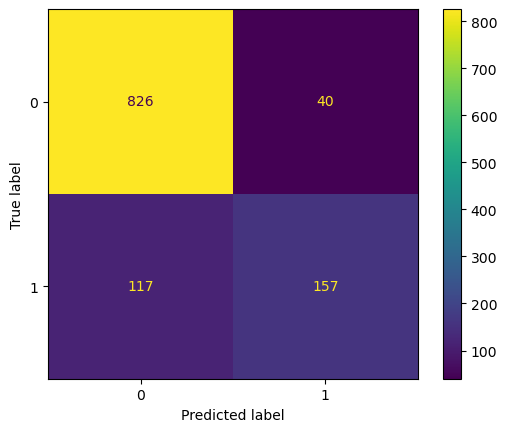

accuracy: 0.862280701754386
precision: 0.7969543147208121
recall: 0.572992700729927
specificity: 0.953810623556582


In [843]:
cm = confusion_matrix(y_syd_test, grid_svc_syd.predict(X_syd_test))
plotConfusionMatrix(cm, grid_svc_syd)

In [844]:
df_results['SVM Sydney'] = cm

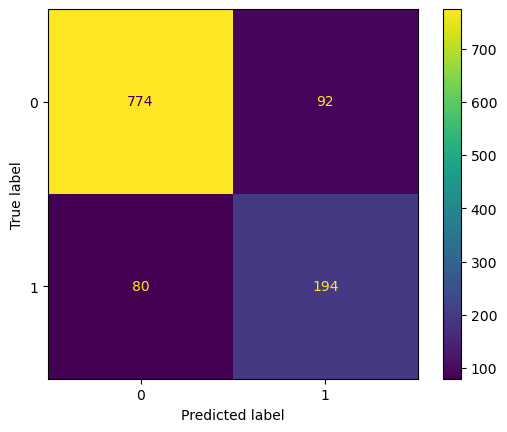

accuracy: 0.8491228070175438
precision: 0.6783216783216783
recall: 0.708029197080292
specificity: 0.8937644341801386


In [845]:
grid_svc_syd_preds = custom_predict(grid_svc_syd, X_syd_test, threshold=0.3)
cm = confusion_matrix(y_syd_test, grid_svc_syd_preds)
plotConfusionMatrix(cm, grid_svc_syd)

In [846]:
df_results['SVM Sydney T03'] = cm

### DecisionTree Sydney

In [849]:
start_time = time.time()
accu = []
for i in range(2, 41):
    dtci = DecisionTreeClassifier(max_depth = i).fit(X_syd_train, y_syd_train)
    dtci_preds = dtci.predict(X_syd_test)
    accu.append(("maxDepth:", i, "accuracy:", accuracy_score(y_syd_test, dtci_preds)))

accu
end_time = time.time()
training_time = end_time - start_time
accu

[('maxDepth:', 2, 'accuracy:', 0.8403508771929824),
 ('maxDepth:', 3, 'accuracy:', 0.8385964912280702),
 ('maxDepth:', 4, 'accuracy:', 0.8403508771929824),
 ('maxDepth:', 5, 'accuracy:', 0.8289473684210527),
 ('maxDepth:', 6, 'accuracy:', 0.8324561403508772),
 ('maxDepth:', 7, 'accuracy:', 0.8201754385964912),
 ('maxDepth:', 8, 'accuracy:', 0.8210526315789474),
 ('maxDepth:', 9, 'accuracy:', 0.8035087719298246),
 ('maxDepth:', 10, 'accuracy:', 0.7912280701754386),
 ('maxDepth:', 11, 'accuracy:', 0.8026315789473685),
 ('maxDepth:', 12, 'accuracy:', 0.7929824561403509),
 ('maxDepth:', 13, 'accuracy:', 0.7956140350877193),
 ('maxDepth:', 14, 'accuracy:', 0.7789473684210526),
 ('maxDepth:', 15, 'accuracy:', 0.7903508771929825),
 ('maxDepth:', 16, 'accuracy:', 0.7947368421052632),
 ('maxDepth:', 17, 'accuracy:', 0.7850877192982456),
 ('maxDepth:', 18, 'accuracy:', 0.7771929824561403),
 ('maxDepth:', 19, 'accuracy:', 0.7807017543859649),
 ('maxDepth:', 20, 'accuracy:', 0.7745614035087719),
 

In [850]:
print(f"Training time: {training_time:.4f} seconds")

Training time: 37.7204 seconds


In [852]:
dtc_syd4 = DecisionTreeClassifier(max_depth = 4).fit(X_syd_train, y_syd_train)
accuracy_score(y_syd_test, dtc_syd4.predict(X_syd_test)) 

0.8403508771929824

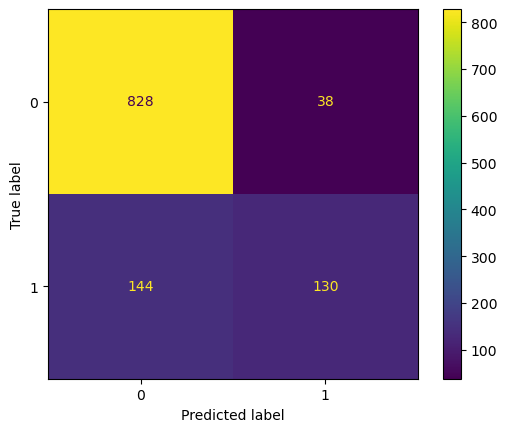

accuracy: 0.8403508771929824
precision: 0.7738095238095238
recall: 0.4744525547445255
specificity: 0.9561200923787528


In [853]:
cm = confusion_matrix(y_syd_test, dtc_syd4.predict(X_syd_test))
plotConfusionMatrix(cm, dtc_syd4)

In [854]:
df_results['DecisionTree Sydney'] = cm

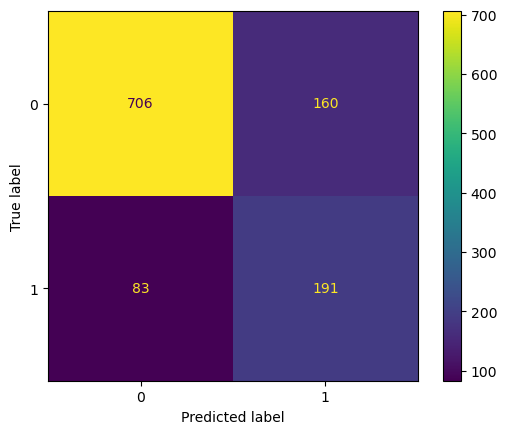

accuracy: 0.7868421052631579
precision: 0.5441595441595442
recall: 0.6970802919708029
specificity: 0.815242494226328


In [855]:
dtc_syd4_preds = custom_predict(dtc_syd4, X_syd_test, threshold=0.3)
cm = confusion_matrix(y_syd_test, dtc_syd4_preds)
plotConfusionMatrix(cm, dtc_syd4)

In [856]:
df_results['DecisionTree Sydney T03'] = cm

### KNN Sydney

In [859]:
start_time = time.time()
accu = []
for i in range(3, 61):
    knni = KNeighborsClassifier(i).fit(X_syd_train, y_syd_train)
    accu.append(("n_neighbors:", i, "accuracy:", knni.score(X_syd_test, y_syd_test)))
accu
end_time = time.time()
training_time = end_time - start_time
accu

[('n_neighbors:', 3, 'accuracy:', 0.8385964912280702),
 ('n_neighbors:', 4, 'accuracy:', 0.8307017543859649),
 ('n_neighbors:', 5, 'accuracy:', 0.8385964912280702),
 ('n_neighbors:', 6, 'accuracy:', 0.8342105263157895),
 ('n_neighbors:', 7, 'accuracy:', 0.8403508771929824),
 ('n_neighbors:', 8, 'accuracy:', 0.8412280701754385),
 ('n_neighbors:', 9, 'accuracy:', 0.8421052631578947),
 ('n_neighbors:', 10, 'accuracy:', 0.8421052631578947),
 ('n_neighbors:', 11, 'accuracy:', 0.8473684210526315),
 ('n_neighbors:', 12, 'accuracy:', 0.8464912280701754),
 ('n_neighbors:', 13, 'accuracy:', 0.8456140350877193),
 ('n_neighbors:', 14, 'accuracy:', 0.8429824561403508),
 ('n_neighbors:', 15, 'accuracy:', 0.8429824561403508),
 ('n_neighbors:', 16, 'accuracy:', 0.8447368421052631),
 ('n_neighbors:', 17, 'accuracy:', 0.8412280701754385),
 ('n_neighbors:', 18, 'accuracy:', 0.8429824561403508),
 ('n_neighbors:', 19, 'accuracy:', 0.8429824561403508),
 ('n_neighbors:', 20, 'accuracy:', 0.8421052631578947),

In [860]:
print(f"Training time: {training_time:.4f} seconds")

Training time: 27.8842 seconds


In [861]:
knn_syd11 = KNeighborsClassifier(11).fit(X_syd_train, y_syd_train)
accuracy_score(y_syd_test, knn_syd11.predict(X_syd_test)) 

0.8473684210526315

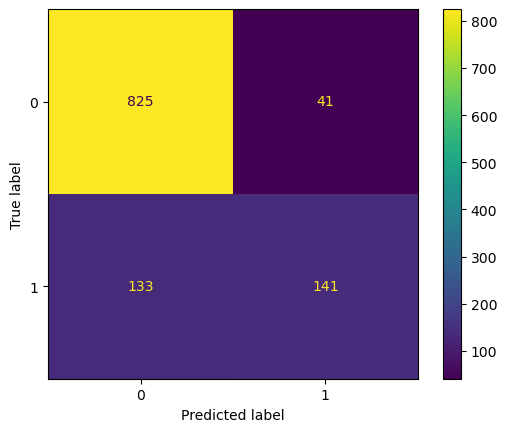

accuracy: 0.8473684210526315
precision: 0.7747252747252747
recall: 0.5145985401459854
specificity: 0.9526558891454965


In [877]:
cm = confusion_matrix(y_syd_test, knn_syd11.predict(X_syd_test))
plotConfusionMatrix(cm, knn_syd11)

In [879]:
df_results['KNN Sydney'] = cm

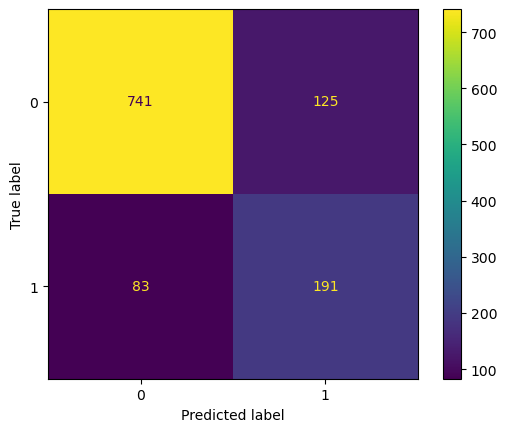

accuracy: 0.8175438596491228
precision: 0.6044303797468354
recall: 0.6970802919708029
specificity: 0.8556581986143187


In [881]:
knn_syd11_preds = custom_predict(knn_syd11, X_syd_test, threshold=0.3)
cm = confusion_matrix(y_syd_test, knn_syd11_preds)
plotConfusionMatrix(cm, knn_syd11)

In [883]:
df_results['KNN Sydney T03'] = cm

### RandomForest Sydney

In [887]:
start_time = time.time()
accu=[]
for n_estimators in range(80, 151, 10):
    for max_features in range(20, 101, 10):
        rfci = RandomForestClassifier(n_estimators=n_estimators, max_features=max_features, oob_score=True, random_state=0)
        rfci.fit(X_syd_train, y_syd_train)
        accu.append((n_estimators, max_features, (rfci.oob_score_)))
end_time = time.time()
search_time = end_time - start_time
accu

[(80, 20, 0.8365497076023392),
 (80, 30, 0.82953216374269),
 (80, 40, 0.8374269005847953),
 (80, 50, 0.8347953216374269),
 (80, 60, 0.835672514619883),
 (80, 70, 0.8385964912280702),
 (80, 80, 0.8391812865497076),
 (80, 90, 0.835672514619883),
 (80, 100, 0.8289473684210527),
 (90, 20, 0.8374269005847953),
 (90, 30, 0.8315789473684211),
 (90, 40, 0.839766081871345),
 (90, 50, 0.835672514619883),
 (90, 60, 0.833625730994152),
 (90, 70, 0.8377192982456141),
 (90, 80, 0.8380116959064328),
 (90, 90, 0.8377192982456141),
 (90, 100, 0.8307017543859649),
 (100, 20, 0.8383040935672514),
 (100, 30, 0.8315789473684211),
 (100, 40, 0.8383040935672514),
 (100, 50, 0.8342105263157895),
 (100, 60, 0.8330409356725146),
 (100, 70, 0.8400584795321637),
 (100, 80, 0.8365497076023392),
 (100, 90, 0.8359649122807018),
 (100, 100, 0.8342105263157895),
 (110, 20, 0.8368421052631579),
 (110, 30, 0.8324561403508772),
 (110, 40, 0.8388888888888889),
 (110, 50, 0.833625730994152),
 (110, 60, 0.835672514619883),


In [888]:
print(f"Prediction time: {search_time:.4f} seconds")

Prediction time: 562.6056 seconds


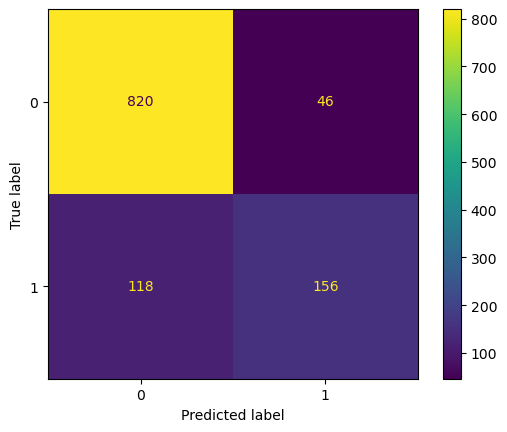

accuracy: 0.856140350877193
precision: 0.7722772277227723
recall: 0.5693430656934306
specificity: 0.9468822170900693


In [891]:
rfc_x = RandomForestClassifier(n_estimators=120, max_features=70, oob_score=True, random_state=0)
rfc_x.fit(X_syd_train, y_syd_train)
cm = confusion_matrix(y_syd_test, rfc_x.predict(X_syd_test))
plotConfusionMatrix(cm, rfc_x)

In [892]:
df_results['RandomForest Sydney'] = cm

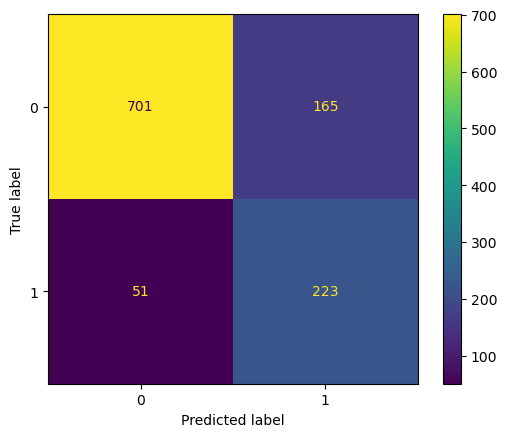

accuracy: 0.8105263157894737
precision: 0.5747422680412371
recall: 0.8138686131386861
specificity: 0.8094688221709007


In [893]:
rfc_x_preds = custom_predict(rfc_x, X_syd_test, threshold=0.3)
cm = confusion_matrix(y_syd_test, rfc_x_preds)
plotConfusionMatrix(cm, rfc_x)

In [894]:
df_results['RandomForest Sydney T03'] = cm

### Gradient Boosting Classifier Sydney

In [901]:
# The initial round of grid search with coarse granularity, commentted out
#
# start_time = time.time()
# accu = []
# for mDepth in [4, 5, 6]:
#     for mFeatures in [10, 20, 40, 60]:
#         for nEstimators in [100, 300, 600]:
#             gbc = GradientBoostingClassifier(max_depth=mDepth, max_features=mFeatures, n_estimators=nEstimators, random_state=0)
#             gbc.fit(X_syd_train, y_syd_train)
#             accu.append((mDepth, mFeatures, nEstimators, (accuracy_score(y_syd_test, gbc.predict(X_syd_test)))))
# end_time = time.time()
# train_time = end_time - start_time
# print(f"Training time: {train_time:.4f} seconds")

In [903]:
# accu

In [906]:
start_time = time.time()
accu = []
for mDepth in [5]:
    for mFeatures in [35, 40, 45, 60]:
        for nEstimators in [200, 250, 300, 350, 400]:
            gbc = GradientBoostingClassifier(max_depth=mDepth, max_features=mFeatures, n_estimators=nEstimators, random_state=0)
            gbc.fit(X_syd_train, y_syd_train)
            accu.append((mDepth, mFeatures, nEstimators, '-', (accuracy_score(y_syd_test, gbc.predict(X_syd_test)))))
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

Training time: 194.5806 seconds


In [907]:
accu

[(5, 35, 200, '-', 0.8675438596491228),
 (5, 35, 250, '-', 0.8657894736842106),
 (5, 35, 300, '-', 0.8657894736842106),
 (5, 35, 350, '-', 0.868421052631579),
 (5, 35, 400, '-', 0.8657894736842106),
 (5, 40, 200, '-', 0.8701754385964913),
 (5, 40, 250, '-', 0.8710526315789474),
 (5, 40, 300, '-', 0.874561403508772),
 (5, 40, 350, '-', 0.8710526315789474),
 (5, 40, 400, '-', 0.8728070175438597),
 (5, 45, 200, '-', 0.8675438596491228),
 (5, 45, 250, '-', 0.874561403508772),
 (5, 45, 300, '-', 0.8710526315789474),
 (5, 45, 350, '-', 0.8692982456140351),
 (5, 45, 400, '-', 0.8666666666666667),
 (5, 60, 200, '-', 0.8614035087719298),
 (5, 60, 250, '-', 0.8631578947368421),
 (5, 60, 300, '-', 0.8614035087719298),
 (5, 60, 350, '-', 0.8640350877192983),
 (5, 60, 400, '-', 0.8657894736842106)]

In [909]:
gbc_5_40_300 = GradientBoostingClassifier(max_depth=5, max_features=40, n_estimators=300, random_state=0)

In [910]:
gbc_5_40_300.fit(X_syd_train, y_syd_train)

GradientBoostingClassifier(max_depth=5, max_features=40, n_estimators=300,
                           random_state=0)

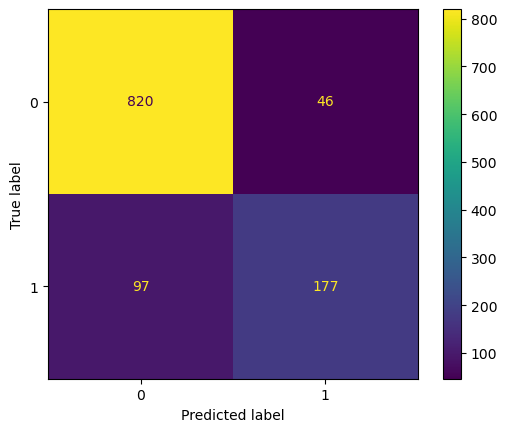

accuracy: 0.874561403508772
precision: 0.7937219730941704
recall: 0.6459854014598541
specificity: 0.9468822170900693


In [911]:
cm = confusion_matrix(y_syd_test, gbc_5_40_300.predict(X_syd_test))
plotConfusionMatrix(cm, gbc_5_40_300)

In [917]:
df_results['GradientBoosting Sydney'] = cm

### custom threshold

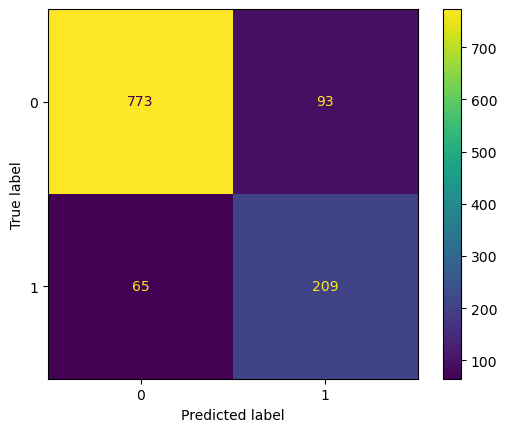

accuracy: 0.8614035087719298
precision: 0.6920529801324503
recall: 0.7627737226277372
specificity: 0.8926096997690531


In [920]:
gbc_5_40_300_preds = custom_predict(gbc_5_40_300, X_syd_test, threshold=0.3)
cm = confusion_matrix(y_syd_test, gbc_5_40_300_preds)
plotConfusionMatrix(cm, gbc_5_40_300)

In [921]:
df_results['GradientBoosting Sydney T03'] = cm

## Perth

In [927]:
X_pth, y_pth = df_pth.drop(columns=['Location', 'RainTomorrow']), df_pth['RainTomorrow']
for f in numerical_selector(X_pth):
    X_pth[f+'_sq_root'] = X_pth[f] ** (1/2)
X_pth = featureEncoding(X_pth, oneHot=True, PolyNomial=True)
X_pth = X_pth.drop(columns=['MinTemp_sq_root^2', 'MaxTemp_sq_root^2', 'Rainfall_sq_root^2', 'Evaporation_sq_root^2', 'Sunshine_sq_root^2', 'WindGustSpeed_sq_root^2', 'WindSpeed9am_sq_root^2', 'WindSpeed3pm_sq_root^2', 'Humidity9am_sq_root^2', 'Humidity3pm_sq_root^2', 'Pressure9am_sq_root^2', 'Pressure3pm_sq_root^2', 'Cloud9am_sq_root^2', 'Cloud3pm_sq_root^2', 'Temp9am_sq_root^2', 'Temp3pm_sq_root^2'])
X_pth

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTemp_sq_root,MaxTemp_sq_root,Rainfall_sq_root,Evaporation_sq_root,Sunshine_sq_root,WindGustSpeed_sq_root,WindSpeed9am_sq_root,WindSpeed3pm_sq_root,Humidity9am_sq_root,Humidity3pm_sq_root,Pressure9am_sq_root,Pressure3pm_sq_root,Cloud9am_sq_root,Cloud3pm_sq_root,Temp9am_sq_root,Temp3pm_sq_root,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MinTemp MinTemp_sq_root,MinTemp MaxTemp_sq_root,MinTemp Rainfall_sq_root,MinTemp Evaporation_sq_root,MinTemp Sunshine_sq_root,MinTemp WindGustSpeed_sq_root,MinTemp WindSpeed9am_sq_root,MinTemp WindSpeed3pm_sq_root,MinTemp Humidity9am_sq_root,MinTemp Humidity3pm_sq_root,MinTemp Pressure9am_sq_root,MinTemp Pressure3pm_sq_root,MinTemp Cloud9am_sq_root,MinTemp Cloud3pm_sq_root,MinTemp Temp9am_sq_root,MinTemp Temp3pm_sq_root,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,MaxTemp MinTemp_sq_root,MaxTemp MaxTemp_sq_root,MaxTemp Rainfall_sq_root,MaxTemp Evaporation_sq_root,MaxTemp Sunshine_sq_root,MaxTemp WindGustSpeed_sq_root,MaxTemp WindSpeed9am_sq_root,MaxTemp WindSpeed3pm_sq_root,MaxTemp Humidity9am_sq_root,MaxTemp Humidity3pm_sq_root,MaxTemp Pressure9am_sq_root,MaxTemp Pressure3pm_sq_root,MaxTemp Cloud9am_sq_root,MaxTemp Cloud3pm_sq_root,MaxTemp Temp9am_sq_root,MaxTemp Temp3pm_sq_root,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Rainfall MinTemp_sq_root,Rainfall MaxTemp_sq_root,Rainfall Rainfall_sq_root,Rainfall Evaporation_sq_root,Rainfall Sunshine_sq_root,Rainfall WindGustSpeed_sq_root,Rainfall WindSpeed9am_sq_root,Rainfall WindSpeed3pm_sq_root,Rainfall Humidity9am_sq_root,Rainfall Humidity3pm_sq_root,Rainfall Pressure9am_sq_root,Rainfall Pressure3pm_sq_root,Rainfall Cloud9am_sq_root,Rainfall Cloud3pm_sq_root,Rainfall Temp9am_sq_root,Rainfall Temp3pm_sq_root,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Evaporation MinTemp_sq_root,Evaporation MaxTemp_sq_root,Evaporation Rainfall_sq_root,Evaporation Evaporation_sq_root,Evaporation Sunshine_sq_root,Evaporation WindGustSpeed_sq_root,Evaporation WindSpeed9am_sq_root,Evaporation WindSpeed3pm_sq_root,Evaporation Humidity9am_sq_root,Evaporation Humidity3pm

In [928]:
X_pth[X_pth.columns] = StandardScaler().fit_transform(X_pth[X_pth.columns])
X_pth_train, X_pth_test, y_pth_train, y_pth_test = train_test_split(X_pth, y_pth, random_state=42)

### LogisticRegression Perth

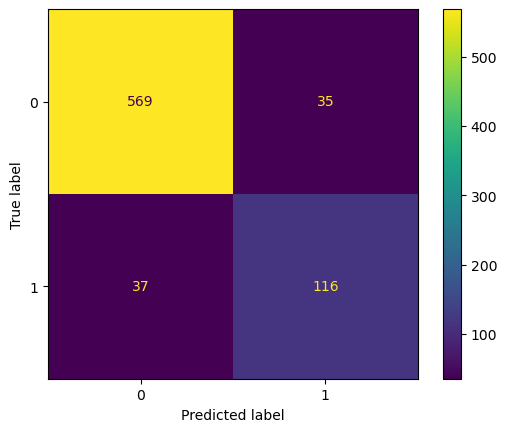

accuracy: 0.904887714663144
precision: 0.7682119205298014
recall: 0.7581699346405228
specificity: 0.9420529801324503


In [932]:
lgr_pth = LogisticRegression(max_iter=1000).fit(X_pth_train, y_pth_train)
cm = confusion_matrix(y_pth_test, lgr_pth.predict(X_pth_test))
plotConfusionMatrix(cm, lgr_pth)

In [933]:
accuracy_score(y_pth_train, lgr_pth.predict(X_pth_train))

0.9325396825396826

In [936]:
df_results['LogisticRegression Perth'] = cm

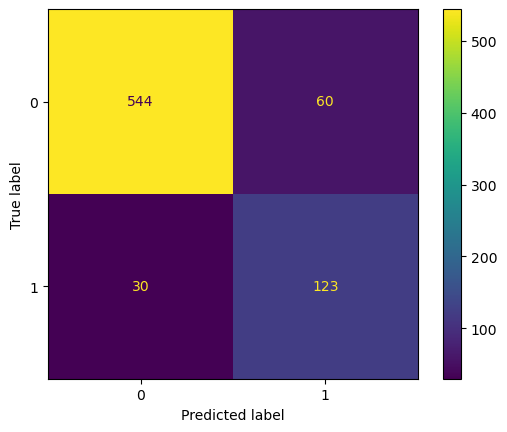

accuracy: 0.8811096433289299
precision: 0.6721311475409836
recall: 0.803921568627451
specificity: 0.9006622516556292


In [938]:
lgr_pth_preds = custom_predict(lgr_pth, X_pth_test, threshold=0.3)
cm = confusion_matrix(y_pth_test, lgr_pth_preds)
plotConfusionMatrix(cm, lgr_pth)

In [940]:
df_results['LogisticRegression Perth T03'] = cm

In [943]:
sorted(list(zip(lgr_pth.coef_[0], X_pth_train.columns)), reverse = True)[:10]

[(0.8717921182516535, 'Rainfall Cloud3pm'),
 (0.764574805651982, 'Humidity3pm^2'),
 (0.7444454718704698, 'Rainfall^2'),
 (0.7400440509476613, 'Humidity9am Rainfall_sq_root'),
 (0.6763962113479256, 'WindSpeed3pm Cloud3pm_sq_root'),
 (0.6450386156843145, 'Sunshine Rainfall_sq_root'),
 (0.6232496673691906, 'Humidity3pm Cloud3pm'),
 (0.6223856766908564, 'Sunshine Cloud3pm_sq_root'),
 (0.5511488684017419, 'WindSpeed9am^2'),
 (0.535558163968215, 'WindGustSpeed Cloud9am_sq_root')]

In [945]:
sorted(list(zip(lgr_pth.coef_[0], X_pth_train.columns)), reverse = True)[-10:]

[(-0.5108428987281133, 'Humidity9am Evaporation_sq_root'),
 (-0.5433335021869655, 'Evaporation WindSpeed3pm'),
 (-0.577161709219301, 'WindGustSpeed Cloud3pm'),
 (-0.5890332124290547, 'Sunshine Humidity3pm'),
 (-0.5948731917723935, 'Cloud9am WindSpeed3pm_sq_root'),
 (-0.6132680130046696, 'Humidity9am Humidity3pm_sq_root'),
 (-0.6567594409726505, 'WindSpeed3pm Cloud9am'),
 (-0.6984944318608078, 'Humidity9am Humidity3pm'),
 (-0.7668149210067827, 'Rainfall Evaporation'),
 (-0.8950061835366483, 'WindSpeed9am Rainfall_sq_root')]

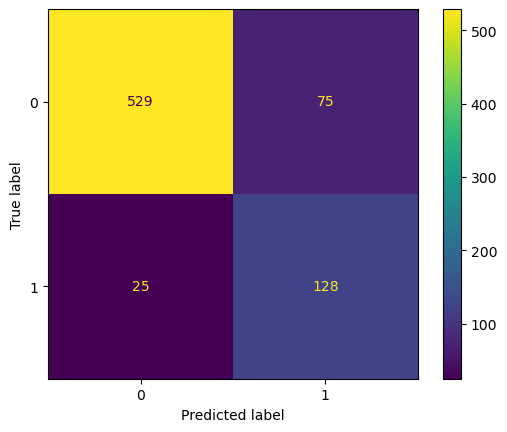

accuracy: 0.8678996036988111
precision: 0.6305418719211823
recall: 0.8366013071895425
specificity: 0.8758278145695364


In [947]:
lgr_pth_balanced = LogisticRegression(max_iter=1000, class_weight='balanced').fit(X_pth_train, y_pth_train)
cm = confusion_matrix(y_pth_test, lgr_pth_balanced.predict(X_pth_test))
plotConfusionMatrix(cm, lgr_pth_balanced)

In [949]:
df_results['LogisticRegression Perth Balanced'] = cm

#### custom threshold

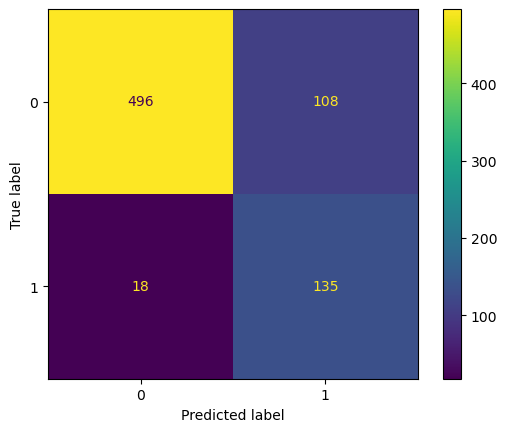

accuracy: 0.8335535006605019
precision: 0.5555555555555556
recall: 0.8823529411764706
specificity: 0.8211920529801324


In [952]:
lgr_pth_balanced_preds = custom_predict(lgr_pth_balanced, X_pth_test, threshold=0.3)
cm = confusion_matrix(y_pth_test, lgr_pth_balanced_preds)
plotConfusionMatrix(cm, lgr_pth_balanced)

In [954]:
df_results['LogisticRegression Perth Balanced T03'] = cm

### SVM Perth

In [959]:
# The initial round of grid search with coarse granularity, commentted out
#
# start_time = time.time()
# params = {
#     'C': [0.1, 0.5, 1, 2, 4],
#     'kernel': ['rbf'],
#     'gamma': np.logspace(-4, -3, 10),}
# grid_svc_pth = GridSearchCV(SVC(probability=True), params).fit(X_pth_train, y_pth_train)
# print(grid_svc_pth.score(X_pth_test, y_pth_test))
# print(grid_svc_pth.best_estimator_)
# print(grid_svc_pth.best_params_['kernel'])
# end_time = time.time()

In [961]:
# training_time = end_time - start_time
# print(f"grid search time: {training_time:.4f} seconds")

In [964]:
start_time = time.time()
params = {
    'C': [2.5, 3, 4],
    'kernel': ['rbf'],
    'gamma': np.logspace(-4, -3, 10),}
grid_svc_pth = GridSearchCV(SVC(probability=True), params).fit(X_pth_train, y_pth_train)
print(grid_svc_pth.score(X_pth_test, y_pth_test))
print(grid_svc_pth.best_estimator_)
print(grid_svc_pth.best_params_['kernel'])
end_time = time.time()

0.9035667107001321
SVC(C=2.5, gamma=0.0002782559402207126, probability=True)
rbf


In [965]:
training_time = end_time - start_time
print(f"grid search time: {training_time:.4f} seconds")

grid search time: 337.7247 seconds


In [966]:
svc_g_pth = SVC(C=2, gamma=0.00021544346900318845, probability=True).fit(X_pth_train, y_pth_train)
accuracy_score(y_pth_train, svc_g_pth.predict(X_pth_train))

0.9149029982363316

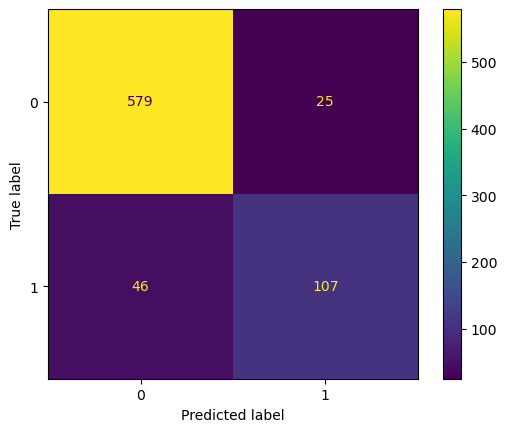

accuracy: 0.9062087186261559
precision: 0.8106060606060606
recall: 0.6993464052287581
specificity: 0.9586092715231788


In [967]:
cm = confusion_matrix(y_pth_test, svc_g_pth.predict(X_pth_test))
plotConfusionMatrix(cm, svc_g_pth)

In [968]:
df_results['SVC Perth'] = cm

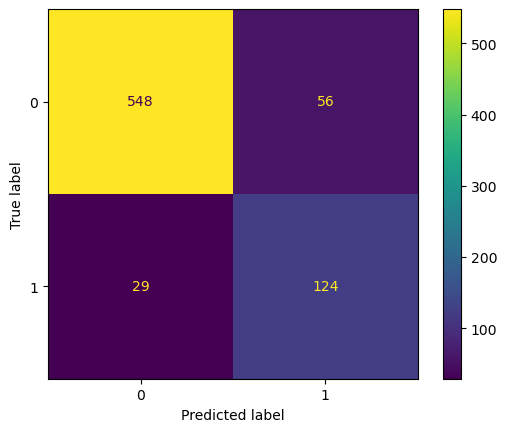

accuracy: 0.8877146631439894
precision: 0.6888888888888889
recall: 0.8104575163398693
specificity: 0.9072847682119205


In [969]:
svc_g_pth_preds = custom_predict(svc_g_pth, X_pth_test, threshold=0.3)
cm = confusion_matrix(y_pth_test, svc_g_pth_preds)
plotConfusionMatrix(cm, svc_g_pth)

In [970]:
df_results['SVC Perth T03'] = cm

In [972]:
x = permutation_importance(svc_g_pth, X_pth_test, y_pth_test, random_state=42)

In [973]:
sorted(list(zip(x.importances_mean, X_pth_test.columns)), reverse = True)[:10]

[(0.004227212681638082, 'WindDir3pm_NW'),
 (0.003963011889035695, 'WindGustDir_WNW'),
 (0.0031704095112286, 'WindDir3pm_W'),
 (0.0023778071334214614, 'WindDir9am_SSE'),
 (0.0018494055482167094, 'WindDir9am_NNE'),
 (0.0015852047556143222, 'WindGustDir_N'),
 (0.0015852047556143222, 'WindDir9am_NE'),
 (0.0013210039630119352, 'WindGustDir_SSW'),
 (0.0013210039630119352, 'WindDir3pm_SSE'),
 (0.0013210039630119352, 'WindDir3pm_S')]

In [974]:
sorted(list(zip(x.importances_mean, X_pth_test.columns)), reverse = True)[-10:]

[(-0.0015852047556142335, 'Pressure3pm Sunshine_sq_root'),
 (-0.0015852047556142335, 'MinTemp_sq_root Sunshine_sq_root'),
 (-0.0015852047556142335, 'MinTemp Sunshine_sq_root'),
 (-0.0015852047556142335, 'MinTemp Sunshine'),
 (-0.0015852047556142335, 'MaxTemp_sq_root Sunshine_sq_root'),
 (-0.0015852047556142335, 'MaxTemp Sunshine_sq_root'),
 (-0.0015852047556142335, 'Humidity3pm Cloud9am_sq_root'),
 (-0.0015852047556142335, 'Humidity3pm Cloud9am'),
 (-0.0023778071334213725, 'WindGustDir_NW'),
 (-0.0026420079260237594, 'WindGustDir_W')]

### DecisionTree Perth

In [988]:
start_time = time.time()
accu = []
for i in range(2, 41):
    dtci = DecisionTreeClassifier(max_depth = i).fit(X_pth_train, y_pth_train)
    dtci_preds = dtci.predict(X_pth_test)
    accu.append(("maxDepth:", i, "accuracy:", accuracy_score(y_pth_test, dtci_preds)))
accu
end_time = time.time()
training_time = end_time - start_time
accu

[('maxDepth:', 2, 'accuracy:', 0.8837516512549538),
 ('maxDepth:', 3, 'accuracy:', 0.8863936591809776),
 ('maxDepth:', 4, 'accuracy:', 0.8916776750330251),
 ('maxDepth:', 5, 'accuracy:', 0.8850726552179656),
 ('maxDepth:', 6, 'accuracy:', 0.8797886393659181),
 ('maxDepth:', 7, 'accuracy:', 0.8797886393659181),
 ('maxDepth:', 8, 'accuracy:', 0.8784676354029062),
 ('maxDepth:', 9, 'accuracy:', 0.8612945838837517),
 ('maxDepth:', 10, 'accuracy:', 0.8678996036988111),
 ('maxDepth:', 11, 'accuracy:', 0.8652575957727873),
 ('maxDepth:', 12, 'accuracy:', 0.8652575957727873),
 ('maxDepth:', 13, 'accuracy:', 0.8612945838837517),
 ('maxDepth:', 14, 'accuracy:', 0.8494055482166446),
 ('maxDepth:', 15, 'accuracy:', 0.8533685601056803),
 ('maxDepth:', 16, 'accuracy:', 0.8520475561426685),
 ('maxDepth:', 17, 'accuracy:', 0.8467635402906208),
 ('maxDepth:', 18, 'accuracy:', 0.8507265521796565),
 ('maxDepth:', 19, 'accuracy:', 0.8546895640686922),
 ('maxDepth:', 20, 'accuracy:', 0.8533685601056803),
 

In [989]:
print(f"Training time: {training_time:.4f} seconds")

Training time: 23.0899 seconds


In [990]:
dtc_pth4 = DecisionTreeClassifier(max_depth = 4).fit(X_pth_train, y_pth_train)
accuracy_score(y_pth_test, dtc_pth4.predict(X_pth_test)) 

0.8916776750330251

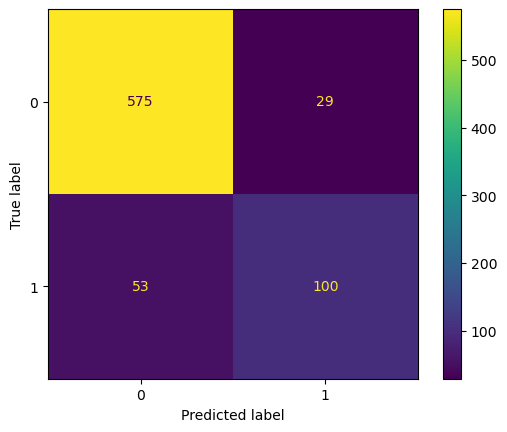

accuracy: 0.8916776750330251
precision: 0.7751937984496124
recall: 0.6535947712418301
specificity: 0.9519867549668874


In [991]:
cm = confusion_matrix(y_pth_test, dtc_pth4.predict(X_pth_test))
plotConfusionMatrix(cm, dtc_pth4)

In [992]:
df_results['DecisionTree Perth'] = cm

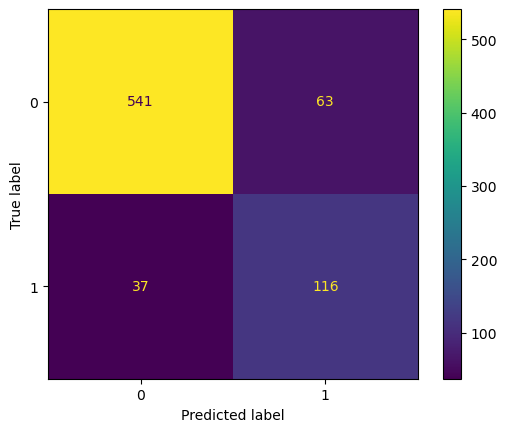

accuracy: 0.8678996036988111
precision: 0.6480446927374302
recall: 0.7581699346405228
specificity: 0.8956953642384106


In [993]:
dtc_pth4_preds = custom_predict(dtc_pth4, X_pth_test, threshold=0.3)
cm = confusion_matrix(y_pth_test, dtc_pth4_preds)
plotConfusionMatrix(cm, dtc_pth4)

In [994]:
df_results['DecisionTree Perth T03'] = cm

### KNN Perth

In [1004]:
start_time = time.time()
accu = []
for i in range(3, 61):
    knni = KNeighborsClassifier(i).fit(X_pth_train, y_pth_train)
    accu.append(("n_neighbors:", i, "accuracy:", knni.score(X_pth_test, y_pth_test)))
accu
end_time = time.time()
training_time = end_time - start_time
accu

[('n_neighbors:', 3, 'accuracy:', 0.8863936591809776),
 ('n_neighbors:', 4, 'accuracy:', 0.8837516512549538),
 ('n_neighbors:', 5, 'accuracy:', 0.8890356671070013),
 ('n_neighbors:', 6, 'accuracy:', 0.8877146631439894),
 ('n_neighbors:', 7, 'accuracy:', 0.8956406869220608),
 ('n_neighbors:', 8, 'accuracy:', 0.8916776750330251),
 ('n_neighbors:', 9, 'accuracy:', 0.9022457067371202),
 ('n_neighbors:', 10, 'accuracy:', 0.8956406869220608),
 ('n_neighbors:', 11, 'accuracy:', 0.8996036988110965),
 ('n_neighbors:', 12, 'accuracy:', 0.8996036988110965),
 ('n_neighbors:', 13, 'accuracy:', 0.8969616908850726),
 ('n_neighbors:', 14, 'accuracy:', 0.8996036988110965),
 ('n_neighbors:', 15, 'accuracy:', 0.9035667107001321),
 ('n_neighbors:', 16, 'accuracy:', 0.9009247027741083),
 ('n_neighbors:', 17, 'accuracy:', 0.9009247027741083),
 ('n_neighbors:', 18, 'accuracy:', 0.9022457067371202),
 ('n_neighbors:', 19, 'accuracy:', 0.9009247027741083),
 ('n_neighbors:', 20, 'accuracy:', 0.8996036988110965),

In [1005]:
print(f"Training time: {training_time:.4f} seconds")

Training time: 10.1702 seconds


In [1006]:
knn_pth15 = KNeighborsClassifier(15).fit(X_pth_train, y_pth_train)
accuracy_score(y_pth_test, knn_pth15.predict(X_pth_test)) 

0.9035667107001321

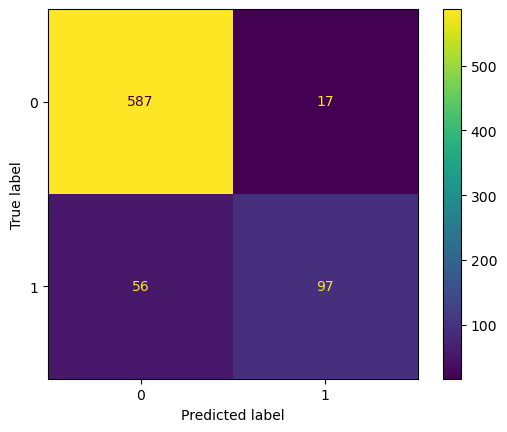

accuracy: 0.9035667107001321
precision: 0.8508771929824561
recall: 0.6339869281045751
specificity: 0.9718543046357616


In [1010]:
cm = confusion_matrix(y_pth_test, knn_pth15.predict(X_pth_test))
plotConfusionMatrix(cm, knn_pth15)

In [1012]:
df_results['KNN Perth'] = cm

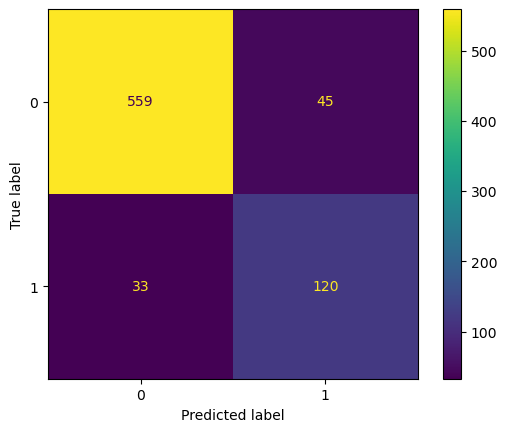

accuracy: 0.8969616908850726
precision: 0.7272727272727273
recall: 0.7843137254901961
specificity: 0.9254966887417219


In [1014]:
knn_pth15_preds = custom_predict(knn_pth15, X_pth_test, threshold=0.3)
cm = confusion_matrix(y_pth_test, knn_pth15_preds)
plotConfusionMatrix(cm, knn_pth15)

In [1016]:
df_results['KNN Perth T03'] = cm

#### 'KNeighborsClassifier' object has no attribute 'feature_importances_'

### RandomForest Perth

In [1021]:
start_time = time.time()
accu=[]
for i in range(20, 121, 10):
    for j in range(20, 81, 10):
        rfci = RandomForestClassifier(n_estimators=i, max_features=j, oob_score=True, random_state=0)
        rfci.fit(X_pth_train, y_pth_train)
        accu.append((i, j, (rfci.oob_score_)))
end_time = time.time()
search_time = end_time - start_time
accu

[(20, 20, 0.8778659611992945),
 (20, 30, 0.8761022927689595),
 (20, 40, 0.8831569664902998),
 (20, 50, 0.8818342151675485),
 (20, 60, 0.8800705467372134),
 (20, 70, 0.8813932980599647),
 (20, 80, 0.8862433862433863),
 (30, 20, 0.8822751322751323),
 (30, 30, 0.8813932980599647),
 (30, 40, 0.8937389770723104),
 (30, 50, 0.8844797178130511),
 (30, 60, 0.8844797178130511),
 (30, 70, 0.88668430335097),
 (30, 80, 0.8910934744268078),
 (40, 20, 0.8853615520282186),
 (40, 30, 0.8880070546737213),
 (40, 40, 0.8959435626102292),
 (40, 50, 0.8902116402116402),
 (40, 60, 0.8853615520282186),
 (40, 70, 0.8915343915343915),
 (40, 80, 0.8910934744268078),
 (50, 20, 0.8858024691358025),
 (50, 30, 0.8897707231040565),
 (50, 40, 0.8928571428571429),
 (50, 50, 0.8915343915343915),
 (50, 60, 0.8871252204585538),
 (50, 70, 0.8928571428571429),
 (50, 80, 0.8897707231040565),
 (60, 20, 0.8884479717813051),
 (60, 30, 0.8915343915343915),
 (60, 40, 0.8990299823633157),
 (60, 50, 0.892416225749559),
 (60, 60, 0

In [1022]:
print(f"grid search time: {search_time:.4f} seconds")

grid search time: 179.9326 seconds


In [1023]:
rfc_g_pth = RandomForestClassifier(n_estimators=110, max_features=40, oob_score=True, random_state=0)

In [1024]:
rfc_g_pth.fit(X_pth_train, y_pth_train)

RandomForestClassifier(max_features=40, n_estimators=110, oob_score=True,
                       random_state=0)

In [1025]:
accuracy_score(y_pth_train, rfc_g_pth.predict(X_pth_train))

1.0

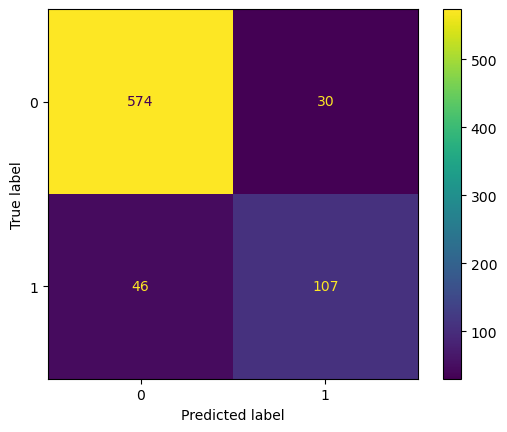

accuracy: 0.8996036988110965
precision: 0.781021897810219
recall: 0.6993464052287581
specificity: 0.9503311258278145


In [1026]:
cm = confusion_matrix(y_pth_test, rfc_g_pth.predict(X_pth_test))
plotConfusionMatrix(cm, rfc_g_pth)

In [1027]:
df_results['RandomForest Perth'] = cm

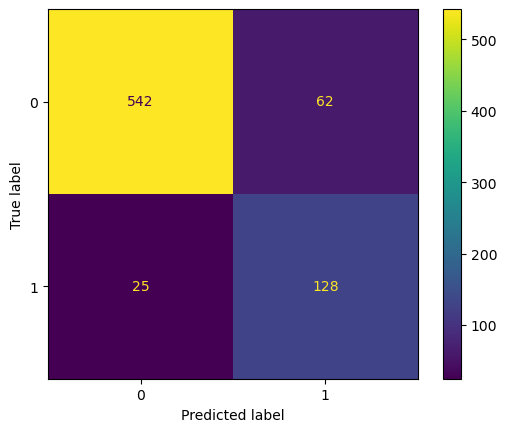

accuracy: 0.8850726552179656
precision: 0.6736842105263158
recall: 0.8366013071895425
specificity: 0.8973509933774835


In [1028]:
rfc_g_pth_preds = custom_predict(rfc_g_pth, X_pth_test, threshold=0.3)
cm = confusion_matrix(y_pth_test, rfc_g_pth_preds)
plotConfusionMatrix(cm, rfc_g_pth)

In [1029]:
df_results['RandomForest Perth T03'] = cm

### class_weight=balanced

In [1041]:
start_time = time.time()
accu=[]
for i in range(20, 121, 10):
    for j in range(20, 81, 10):
        rfci = RandomForestClassifier(n_estimators=i, max_features=j, oob_score=True, random_state=0, class_weight='balanced')
        rfci.fit(X_pth_train, y_pth_train)
        accu.append((i, j, (rfci.oob_score_)))
end_time = time.time()
search_time = end_time - start_time
accu

[(20, 20, 0.8783068783068783),
 (20, 30, 0.8752204585537919),
 (20, 40, 0.8774250440917107),
 (20, 50, 0.8783068783068783),
 (20, 60, 0.8884479717813051),
 (20, 70, 0.8809523809523809),
 (20, 80, 0.8818342151675485),
 (30, 20, 0.8818342151675485),
 (30, 30, 0.8862433862433863),
 (30, 40, 0.876984126984127),
 (30, 50, 0.8791887125220459),
 (30, 60, 0.8893298059964727),
 (30, 70, 0.8853615520282186),
 (30, 80, 0.8831569664902998),
 (40, 20, 0.8875661375661376),
 (40, 30, 0.8862433862433863),
 (40, 40, 0.8783068783068783),
 (40, 50, 0.8818342151675485),
 (40, 60, 0.8937389770723104),
 (40, 70, 0.8875661375661376),
 (40, 80, 0.8875661375661376),
 (50, 20, 0.8888888888888888),
 (50, 30, 0.8849206349206349),
 (50, 40, 0.8835978835978836),
 (50, 50, 0.8858024691358025),
 (50, 60, 0.894620811287478),
 (50, 70, 0.8888888888888888),
 (50, 80, 0.8902116402116402),
 (60, 20, 0.8902116402116402),
 (60, 30, 0.8831569664902998),
 (60, 40, 0.8849206349206349),
 (60, 50, 0.8902116402116402),
 (60, 60, 

In [1042]:
rfc_pth_balanced = RandomForestClassifier(n_estimators=50, max_features=50, oob_score=True, random_state=0, class_weight='balanced')
rfc_pth_balanced.fit(X_pth_train, y_pth_train)

RandomForestClassifier(class_weight='balanced', max_features=50,
                       n_estimators=50, oob_score=True, random_state=0)

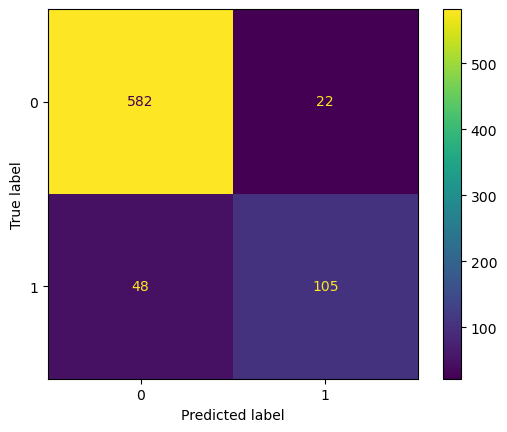

accuracy: 0.9075297225891678
precision: 0.8267716535433071
recall: 0.6862745098039216
specificity: 0.9635761589403974


In [1043]:
cm = confusion_matrix(y_pth_test, rfc_pth_balanced.predict(X_pth_test))
plotConfusionMatrix(cm, rfc_pth_balanced)

In [1044]:
df_results['RandomForest Perth Balanced'] = cm

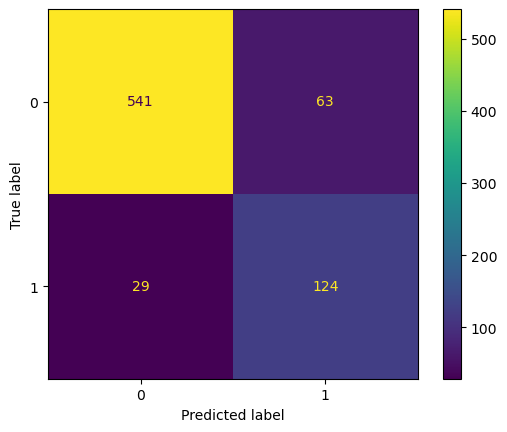

accuracy: 0.8784676354029062
precision: 0.6631016042780749
recall: 0.8104575163398693
specificity: 0.8956953642384106


In [1045]:
rfc_pth_balanced_preds = custom_predict(rfc_pth_balanced, X_pth_test, threshold=0.3)
cm = confusion_matrix(y_pth_test, rfc_pth_balanced_preds)
plotConfusionMatrix(cm, rfc_pth_balanced)

In [1046]:
df_results['RandomForest Perth Balanced T03'] = cm

### feature_importances

In [1055]:
sorted(list(zip(rfc_g_pth.feature_importances_, X_pth_test.columns)), reverse = True)[:20]

[(0.04358973759164427, 'Pressure3pm MaxTemp_sq_root'),
 (0.029117874119589233, 'Pressure3pm Temp3pm_sq_root'),
 (0.022390937315812078, 'Humidity3pm WindGustSpeed_sq_root'),
 (0.020919334869964504, 'Humidity3pm Pressure9am_sq_root'),
 (0.016189401741718054, 'Humidity3pm Temp3pm'),
 (0.01574951938283443, 'Pressure9am Temp3pm_sq_root'),
 (0.014856681142491687, 'Humidity3pm MaxTemp_sq_root'),
 (0.0148148396092117, 'Humidity3pm Temp9am_sq_root'),
 (0.014110767034405032, 'Humidity3pm Pressure3pm_sq_root'),
 (0.0130267781405961, 'Pressure3pm Temp9am_sq_root'),
 (0.010649511479413974, 'Pressure9am MaxTemp_sq_root'),
 (0.010306267370242803, 'Pressure3pm_sq_root Temp3pm_sq_root'),
 (0.010021863564652312, 'Humidity3pm_sq_root'),
 (0.009907685298400817, 'Humidity3pm_sq_root Temp3pm_sq_root'),
 (0.009870547352808989, 'Pressure9am Temp9am_sq_root'),
 (0.009374827656459498, 'Humidity3pm MinTemp_sq_root'),
 (0.009295591171442212, 'Humidity3pm_sq_root Temp9am_sq_root'),
 (0.009260728870920545, 'WindGus

### Get accuracy data and create plots for different n_estimators and max_features values

In [1059]:
start_time = time.time()
accu115e=[]
for max_features in [2, 5, 7, 10, 15, 20, 25, 30, 35, 40, 45, 50, 60, 70, 80, 90, 100, 120]:
    rfci = RandomForestClassifier(n_estimators=115, max_features=max_features, oob_score=True, random_state=0)
    rfci.fit(X_pth_train, y_pth_train)
    accu115e.append((max_features, (rfci.oob_score_)))
end_time = time.time()
search_time = end_time - start_time
print(f"grid search time: {search_time:.4f} seconds")

grid search time: 62.6603 seconds


In [1060]:
accu115e

[(2, 0.8862433862433863),
 (5, 0.8875661375661376),
 (7, 0.8893298059964727),
 (10, 0.894620811287478),
 (15, 0.892416225749559),
 (20, 0.8902116402116402),
 (25, 0.8915343915343915),
 (30, 0.890652557319224),
 (35, 0.8915343915343915),
 (40, 0.8985890652557319),
 (45, 0.8919753086419753),
 (50, 0.8955026455026455),
 (60, 0.892416225749559),
 (70, 0.8981481481481481),
 (80, 0.8932980599647267),
 (90, 0.8963844797178131),
 (100, 0.8977072310405644),
 (120, 0.8937389770723104)]

In [1062]:
start_time = time.time()
accu18e=[]
for max_features in [2, 5, 7, 10, 15, 20, 25, 30, 35, 40, 45, 50, 60, 70, 80, 90, 100, 120]:
    rfci = RandomForestClassifier(n_estimators=18, max_features=max_features, oob_score=True, random_state=0)
    rfci.fit(X_pth_train, y_pth_train)
    accu18e.append((max_features, (rfci.oob_score_)))
end_time = time.time()
search_time = end_time - start_time
print(f"grid search time: {search_time:.4f} seconds")

grid search time: 9.6274 seconds


In [1063]:
accu18e

[(2, 0.8672839506172839),
 (5, 0.8708112874779541),
 (7, 0.8747795414462081),
 (10, 0.8791887125220459),
 (15, 0.8721340388007055),
 (20, 0.873015873015873),
 (25, 0.8756613756613757),
 (30, 0.8756613756613757),
 (35, 0.8694885361552028),
 (40, 0.8818342151675485),
 (45, 0.8756613756613757),
 (50, 0.8813932980599647),
 (60, 0.8761022927689595),
 (70, 0.8831569664902998),
 (80, 0.8840388007054674),
 (90, 0.8752204585537919),
 (100, 0.8800705467372134),
 (120, 0.8791887125220459)]

In [1064]:
dd1 = pd.DataFrame({'max_features': [x[0] for x in accu18e], 'n_estimators=18': [x[1] for x in accu18e], 'n_estimators=115': [x[1] for x in accu115e]})
dd1 = dd1.set_index('max_features')

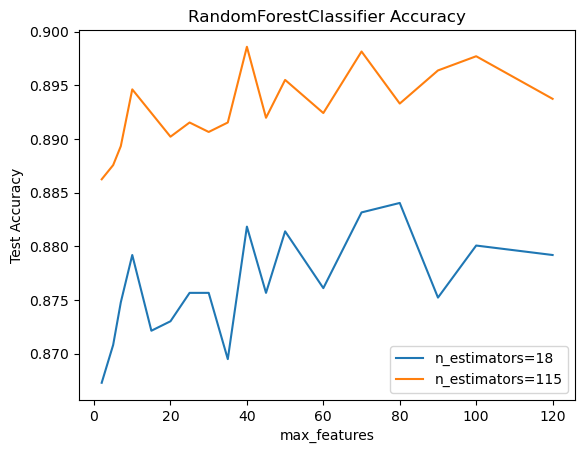

In [1065]:
dd1.plot.line(y=['n_estimators=18', 'n_estimators=115'])
plt.title('RandomForestClassifier Accuracy')
plt.xlabel('max_features')
plt.ylabel('Test Accuracy')
plt.show()

In [1069]:
start_time = time.time()
accu3f=[]
for n_estimators in [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 60, 70, 80, 90, 100, 120, 200, 300, 400, 500]:
    rfci = RandomForestClassifier(n_estimators=n_estimators, max_features=3, oob_score=True, random_state=0)
    rfci.fit(X_pth_train, y_pth_train)
    accu3f.append((n_estimators, (rfci.oob_score_)))
end_time = time.time()
search_time = end_time - start_time
print(f"grid search time: {search_time:.4f} seconds")

/opt/anaconda3/lib/python3.12/site-packages/sklearn/ensemble/_forest.py:615: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/ensemble/_forest.py:615: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/ensemble/_forest.py:615: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(


grid search time: 5.8554 seconds


In [1070]:
accu3f

[(5, 0.8386243386243386),
 (10, 0.8615520282186949),
 (15, 0.8721340388007055),
 (20, 0.8756613756613757),
 (25, 0.876984126984127),
 (30, 0.8840388007054674),
 (35, 0.8844797178130511),
 (40, 0.8840388007054674),
 (45, 0.8880070546737213),
 (50, 0.8884479717813051),
 (60, 0.8893298059964727),
 (70, 0.8915343915343915),
 (80, 0.8919753086419753),
 (90, 0.8910934744268078),
 (100, 0.890652557319224),
 (120, 0.8893298059964727),
 (200, 0.8888888888888888),
 (300, 0.892416225749559),
 (400, 0.8919753086419753),
 (500, 0.8932980599647267)]

In [1072]:
start_time = time.time()
accu45f=[]
for n_estimators in [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 60, 70, 80, 90, 100, 120, 200, 300, 400, 500]:
    rfci = RandomForestClassifier(n_estimators=n_estimators, max_features=45, oob_score=True, random_state=0)
    rfci.fit(X_pth_train, y_pth_train)
    accu45f.append((n_estimators, (rfci.oob_score_)))
end_time = time.time()
search_time = end_time - start_time
print(f"grid search time: {search_time:.4f} seconds")

/opt/anaconda3/lib/python3.12/site-packages/sklearn/ensemble/_forest.py:615: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/ensemble/_forest.py:615: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/ensemble/_forest.py:615: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(


grid search time: 66.0449 seconds


In [1073]:
accu45f

[(5, 0.857583774250441),
 (10, 0.8668430335097002),
 (15, 0.8756613756613757),
 (20, 0.8805114638447972),
 (25, 0.8840388007054674),
 (30, 0.8849206349206349),
 (35, 0.8871252204585538),
 (40, 0.8875661375661376),
 (45, 0.8888888888888888),
 (50, 0.8880070546737213),
 (60, 0.8910934744268078),
 (70, 0.8888888888888888),
 (80, 0.892416225749559),
 (90, 0.8910934744268078),
 (100, 0.8928571428571429),
 (120, 0.8941798941798942),
 (200, 0.8955026455026455),
 (300, 0.8999118165784833),
 (400, 0.8977072310405644),
 (500, 0.8968253968253969)]

In [1075]:
dd1 = pd.DataFrame({'n_estimators': [x[0] for x in accu3f], 'max_features=3': [x[1] for x in accu3f], 'max_features=45': [x[1] for x in accu45f]})
dd1 = dd1.set_index('n_estimators')

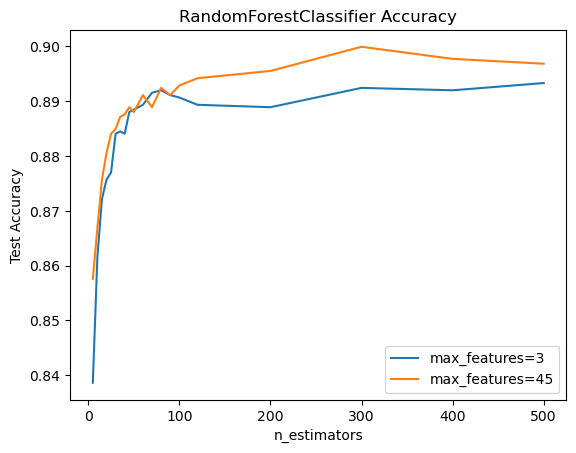

In [1076]:
dd1.plot.line(y=['max_features=3', 'max_features=45'])
plt.title('RandomForestClassifier Accuracy')
plt.xlabel('n_estimators')
plt.ylabel('Test Accuracy')
plt.show()

### GradientBoostingClassifier Perth

In [1092]:
start_time = time.time()
accu = []
for mDepth in [5, 6]:
    for mFeatures in [10, 20, 40, 60, 80]:
        for nEstimators in [200, 400, 600, 800]:
            gbc = GradientBoostingClassifier(max_depth=mDepth, max_features=mFeatures, n_estimators=nEstimators, random_state=0)
            gbc.fit(X_pth_train, y_pth_train)
            accu.append((mDepth, mFeatures, nEstimators, '-', (accuracy_score(y_pth_test, gbc.predict(X_pth_test)))))
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

Training time: 432.6553 seconds


In [1093]:
accu

[(5, 10, 200, '-', 0.904887714663144),
 (5, 10, 400, '-', 0.8982826948480845),
 (5, 10, 600, '-', 0.8982826948480845),
 (5, 10, 800, '-', 0.8982826948480845),
 (5, 20, 200, '-', 0.9035667107001321),
 (5, 20, 400, '-', 0.8996036988110965),
 (5, 20, 600, '-', 0.9009247027741083),
 (5, 20, 800, '-', 0.9062087186261559),
 (5, 40, 200, '-', 0.9022457067371202),
 (5, 40, 400, '-', 0.9088507265521797),
 (5, 40, 600, '-', 0.9062087186261559),
 (5, 40, 800, '-', 0.9062087186261559),
 (5, 60, 200, '-', 0.892998678996037),
 (5, 60, 400, '-', 0.8916776750330251),
 (5, 60, 600, '-', 0.8969616908850726),
 (5, 60, 800, '-', 0.8969616908850726),
 (5, 80, 200, '-', 0.8956406869220608),
 (5, 80, 400, '-', 0.8996036988110965),
 (5, 80, 600, '-', 0.8996036988110965),
 (5, 80, 800, '-', 0.8996036988110965),
 (6, 10, 200, '-', 0.8982826948480845),
 (6, 10, 400, '-', 0.8996036988110965),
 (6, 10, 600, '-', 0.8982826948480845),
 (6, 10, 800, '-', 0.8996036988110965),
 (6, 20, 200, '-', 0.9022457067371202),
 (

### class_weight='balanced' is not supported in GradientBoostingClassifier

In [1096]:
start_time = time.time()
accu = []
for mDepth in [5]:
    for mFeatures in [35, 40, 45]:
        for nEstimators in [300, 400, 500]:
            gbc = GradientBoostingClassifier(max_depth=mDepth, max_features=mFeatures, n_estimators=nEstimators, random_state=0)
            gbc.fit(X_pth_train, y_pth_train)
            accu.append((mDepth, mFeatures, nEstimators, '-', (accuracy_score(y_pth_test, gbc.predict(X_pth_test)))))
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

Training time: 66.7871 seconds


In [1097]:
accu

[(5, 35, 300, '-', 0.8969616908850726),
 (5, 35, 400, '-', 0.8956406869220608),
 (5, 35, 500, '-', 0.8982826948480845),
 (5, 40, 300, '-', 0.9022457067371202),
 (5, 40, 400, '-', 0.9088507265521797),
 (5, 40, 500, '-', 0.9075297225891678),
 (5, 45, 300, '-', 0.8969616908850726),
 (5, 45, 400, '-', 0.8969616908850726),
 (5, 45, 500, '-', 0.8956406869220608)]

In [1099]:
gbc_pth = GradientBoostingClassifier(max_depth=5, max_features=40, n_estimators=400, random_state=0)
gbc_pth.fit(X_pth_train, y_pth_train)
accuracy_score(y_pth_test, gbc_pth.predict(X_pth_test))

0.9088507265521797

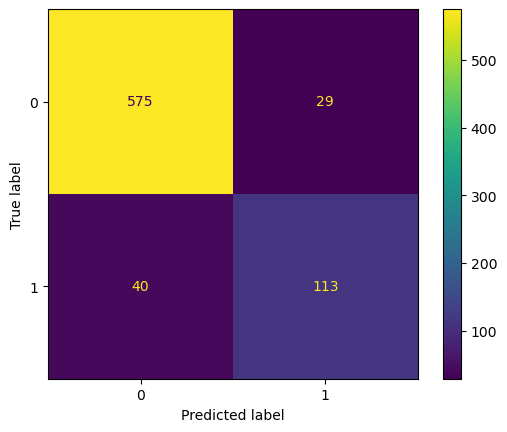

accuracy: 0.9088507265521797
precision: 0.795774647887324
recall: 0.738562091503268
specificity: 0.9519867549668874


In [1100]:
cm = confusion_matrix(y_pth_test, gbc_pth.predict(X_pth_test))
plotConfusionMatrix(cm, gbc_pth)

In [1101]:
df_results['GradientBoosting Perth'] = cm

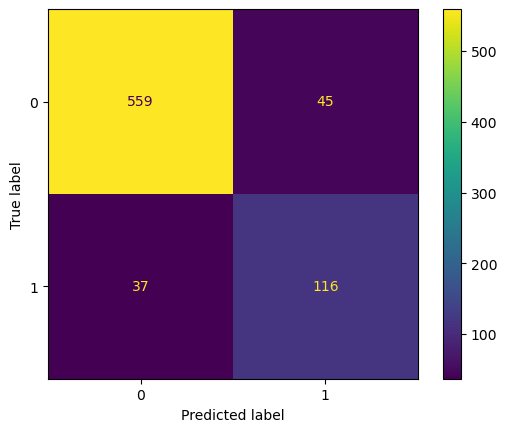

accuracy: 0.8916776750330251
precision: 0.7204968944099379
recall: 0.7581699346405228
specificity: 0.9254966887417219


In [1102]:
gbc_pth_preds = custom_predict(gbc_pth, X_pth_test, threshold=0.3)
cm = confusion_matrix(y_pth_test, gbc_pth_preds)
plotConfusionMatrix(cm, gbc_pth)

In [1103]:
df_results['GradientBoosting Perth T03'] = cm

In [1104]:
sorted(list(zip(gbc_pth.feature_importances_, X_pth_test.columns)), reverse = True)[:20]

[(0.08323251656557917, 'Humidity3pm WindGustSpeed_sq_root'),
 (0.05792270722340537, 'Humidity3pm_sq_root Pressure3pm_sq_root'),
 (0.04707151127403764, 'Pressure3pm MaxTemp_sq_root'),
 (0.03979085488156344, 'Pressure3pm Temp3pm_sq_root'),
 (0.038382227704447276, 'Humidity3pm Temp3pm_sq_root'),
 (0.03486413832243305, 'Pressure3pm Temp9am_sq_root'),
 (0.02470418064286319, 'Humidity3pm Pressure3pm_sq_root'),
 (0.02299695164081255, 'Humidity3pm Temp9am_sq_root'),
 (0.019972174845625402, 'Sunshine Temp9am'),
 (0.01629365135210469, 'Pressure9am Temp9am_sq_root'),
 (0.01408598406859571, 'Humidity3pm MinTemp_sq_root'),
 (0.011774843998149008, 'Sunshine MinTemp_sq_root'),
 (0.011731949042398375, 'Pressure9am Temp3pm_sq_root'),
 (0.010152135355637956, 'Pressure9am MinTemp_sq_root'),
 (0.009631384270208737, 'Pressure3pm^2'),
 (0.009534136731178602, 'Pressure3pm Pressure3pm_sq_root'),
 (0.008886029877124016, 'Humidity3pm Pressure3pm'),
 (0.0087750133681482, 'Pressure3pm MinTemp_sq_root'),
 (0.00807

In [1106]:
start_time = time.time()
accu = []
for nEstimators in [5, 10, 20, 40, 60, 80, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1200]:
    gbc = GradientBoostingClassifier(max_depth=6, max_features=35, n_estimators=nEstimators, random_state=0)
    gbc.fit(X_pth_train, y_pth_train)
    accu.append((nEstimators, accuracy_score(y_pth_test, gbc.predict(X_pth_test))))

end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

Training time: 128.8604 seconds


In [1107]:
accu

[(5, 0.8586525759577279),
 (10, 0.8784676354029062),
 (20, 0.8969616908850726),
 (40, 0.9009247027741083),
 (60, 0.8969616908850726),
 (80, 0.8956406869220608),
 (100, 0.8969616908850726),
 (200, 0.892998678996037),
 (300, 0.892998678996037),
 (400, 0.8903566710700133),
 (500, 0.8943196829590488),
 (600, 0.892998678996037),
 (700, 0.8943196829590488),
 (800, 0.8943196829590488),
 (900, 0.8943196829590488),
 (1000, 0.8956406869220608),
 (1200, 0.8956406869220608)]

In [1109]:
start_time = time.time()
accu3f = []
for nEstimators in [5, 10, 20, 40, 60, 80, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1200]:
    gbc = GradientBoostingClassifier(max_depth=6, max_features=3, n_estimators=nEstimators, random_state=0)
    gbc.fit(X_pth_train, y_pth_train)
    accu3f.append((nEstimators, accuracy_score(y_pth_test, gbc.predict(X_pth_test))))

end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

Training time: 18.5692 seconds


In [1110]:
accu3f

[(5, 0.8243064729194187),
 (10, 0.8890356671070013),
 (20, 0.9022457067371202),
 (40, 0.9009247027741083),
 (60, 0.9022457067371202),
 (80, 0.8956406869220608),
 (100, 0.8956406869220608),
 (200, 0.9009247027741083),
 (300, 0.8969616908850726),
 (400, 0.9009247027741083),
 (500, 0.9009247027741083),
 (600, 0.9009247027741083),
 (700, 0.9035667107001321),
 (800, 0.9062087186261559),
 (900, 0.9035667107001321),
 (1000, 0.9022457067371202),
 (1200, 0.904887714663144)]

In [1112]:
dd1 = pd.DataFrame({'n_estimators': [x[0] for x in accu], 'max_features=3': [x[1] for x in accu3f], 'max_features=35': [x[1] for x in accu]})
dd1 = dd1.set_index('n_estimators')

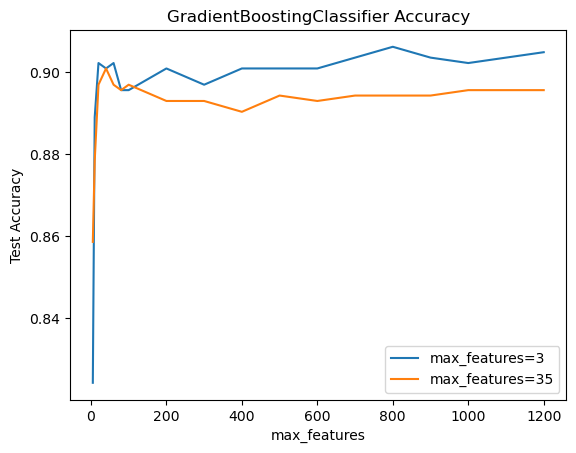

In [1113]:
# dd1.plot.line(x='n_estimators', y=['max_features=3', 'max_features=35'])
dd1.plot.line(y=['max_features=3', 'max_features=35'])
plt.title('GradientBoostingClassifier Accuracy')
plt.xlabel('max_features')
plt.ylabel('Test Accuracy')
plt.show()

In [1114]:
dd1

,max_features=3,max_features=35
n_estimators,,
5,0.824306,0.858653
10,0.889036,0.878468
20,0.902246,0.896962
40,0.900925,0.900925
60,0.902246,0.896962
80,0.895641,0.895641
100,0.895641,0.896962
200,0.900925,0.892999
300,0.896962,0.892999


In [1117]:
start_time = time.time()
accu400 = []
for max_features in [2, 5, 7, 10, 15, 20, 25, 30, 35, 40, 45, 50, 60, 70, 80, 90, 100, 120]:
    gbc = GradientBoostingClassifier(max_depth=6, max_features=max_features, n_estimators=400, random_state=0)
    gbc.fit(X_pth_train, y_pth_train)
    accu400.append((max_features, accuracy_score(y_pth_test, gbc.predict(X_pth_test))))

end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

Training time: 177.4968 seconds


In [1118]:
accu400

[(2, 0.9062087186261559),
 (5, 0.904887714663144),
 (7, 0.8982826948480845),
 (10, 0.8996036988110965),
 (15, 0.8969616908850726),
 (20, 0.9022457067371202),
 (25, 0.8969616908850726),
 (30, 0.8969616908850726),
 (35, 0.8903566710700133),
 (40, 0.9035667107001321),
 (45, 0.9009247027741083),
 (50, 0.9022457067371202),
 (60, 0.904887714663144),
 (70, 0.9022457067371202),
 (80, 0.9035667107001321),
 (90, 0.9009247027741083),
 (100, 0.9022457067371202),
 (120, 0.8969616908850726)]

In [1120]:
start_time = time.time()
accu = []
for max_features in [2, 5, 7, 10, 15, 20, 25, 30, 35, 40, 45, 50, 60, 70, 80, 90, 100, 120]:
    gbc = GradientBoostingClassifier(max_depth=6, max_features=max_features, n_estimators=5, random_state=0)
    gbc.fit(X_pth_train, y_pth_train)
    accu.append((max_features, accuracy_score(y_pth_test, gbc.predict(X_pth_test))))

end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

Training time: 2.5603 seconds


In [1121]:
accu

[(2, 0.8243064729194187),
 (5, 0.8533685601056803),
 (7, 0.8520475561426685),
 (10, 0.8494055482166446),
 (15, 0.8705416116248349),
 (20, 0.8665785997357992),
 (25, 0.8678996036988111),
 (30, 0.8599735799207398),
 (35, 0.8586525759577279),
 (40, 0.869220607661823),
 (45, 0.8784676354029062),
 (50, 0.8731836195508587),
 (60, 0.8546895640686922),
 (70, 0.8678996036988111),
 (80, 0.8705416116248349),
 (90, 0.8639365918097754),
 (100, 0.8560105680317041),
 (120, 0.8546895640686922)]

In [1122]:
dd = pd.DataFrame({'max_features': [x[0] for x in accu], 'Test Accuracy': [x[1] for x in accu]})

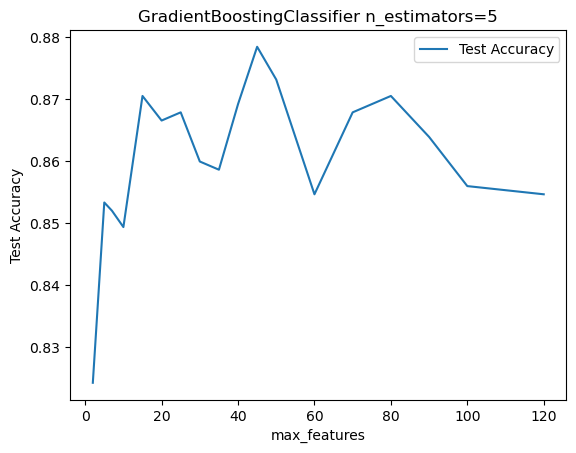

In [1123]:
# dd.plot.line(x='time', y=['value1', 'value2'])
dd.plot.line(x='max_features', y='Test Accuracy')
plt.title('GradientBoostingClassifier n_estimators=5')
plt.xlabel('max_features')
plt.ylabel('Test Accuracy')
plt.show()

In [1125]:
dd2 = pd.DataFrame({'max_features': [x[0] for x in accu], 'n_estimators=5': [x[1] for x in accu], 'n_estimators=400': [x[1] for x in accu400]})

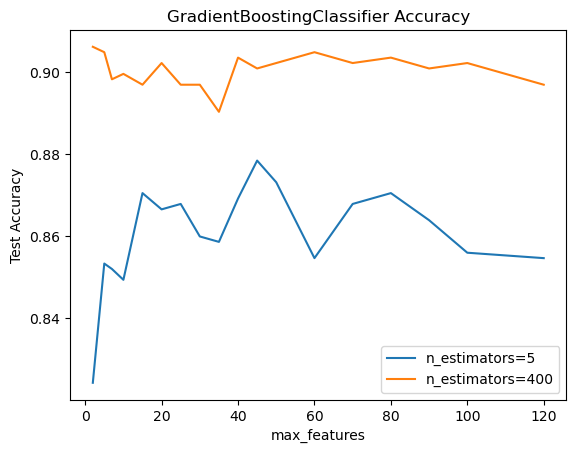

In [1126]:
dd2.plot.line(x='max_features', y=['n_estimators=5', 'n_estimators=400'])
plt.title('GradientBoostingClassifier Accuracy')
plt.xlabel('max_features')
plt.ylabel('Test Accuracy')
plt.show()

# Use TargetEncoder for categorical features
TargetEncoder is another optimization added, together with custom threshold and class_weights='balanced' there are many combinations to try, I will use only LogisticRgression, RandomForestClassifier and GradientBoostingClassifier to reduce repetitive works.

In [1155]:
encoder=TargetEncoder(target_type="binary", random_state=42)

In [1157]:
categorical_selector = make_column_selector(dtype_include=object)

In [1159]:
X_pth2, y_pth2 = df_pth.drop(columns=['Location', 'RainTomorrow']), df_pth['RainTomorrow']
for f in numerical_selector(X_pth2):
    X_pth2[f+'_sq_root'] = X_pth2[f] ** (1/2)

In [1161]:
pth_num=X_pth2[numerical_selector(X_pth2)]

In [1163]:
X_pth_encoded = pd.DataFrame(encoder.fit_transform(X_pth2[categorical_selector(X_pth2)], y_pth), columns=categorical_selector(X_pth2))
X_pth_encoded

,Month,WindGustDir,WindDir9am,WindDir3pm,RainToday
0,0.459648,0.150874,0.078320,0.119763,0.125027
1,0.458869,0.444100,0.497591,0.636871,0.522362
2,0.473434,0.389180,0.614687,0.082484,0.515864
3,0.459648,0.286093,0.071902,0.160929,0.522078
4,0.455793,0.372348,0.227927,0.349873,0.128943
...,...,...,...,...,...
3020,0.353380,0.640568,0.457633,0.667629,0.128943
3021,0.292732,0.084192,0.614687,0.082484,0.515864
3022,0.292732,0.069147,0.075719,0.073220,0.127468
3023,0.292732,0.069147,0.063977,0.073220,0.127468


In [1164]:
pth_num = featureEncoding(pth_num, oneHot=False, PolyNomial=True)
pth_num

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTemp_sq_root,MaxTemp_sq_root,Rainfall_sq_root,Evaporation_sq_root,Sunshine_sq_root,WindGustSpeed_sq_root,WindSpeed9am_sq_root,WindSpeed3pm_sq_root,Humidity9am_sq_root,Humidity3pm_sq_root,Pressure9am_sq_root,Pressure3pm_sq_root,Cloud9am_sq_root,Cloud3pm_sq_root,Temp9am_sq_root,Temp3pm_sq_root,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MinTemp MinTemp_sq_root,MinTemp MaxTemp_sq_root,MinTemp Rainfall_sq_root,MinTemp Evaporation_sq_root,MinTemp Sunshine_sq_root,MinTemp WindGustSpeed_sq_root,MinTemp WindSpeed9am_sq_root,MinTemp WindSpeed3pm_sq_root,MinTemp Humidity9am_sq_root,MinTemp Humidity3pm_sq_root,MinTemp Pressure9am_sq_root,MinTemp Pressure3pm_sq_root,MinTemp Cloud9am_sq_root,MinTemp Cloud3pm_sq_root,MinTemp Temp9am_sq_root,MinTemp Temp3pm_sq_root,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,MaxTemp MinTemp_sq_root,MaxTemp MaxTemp_sq_root,MaxTemp Rainfall_sq_root,MaxTemp Evaporation_sq_root,MaxTemp Sunshine_sq_root,MaxTemp WindGustSpeed_sq_root,MaxTemp WindSpeed9am_sq_root,MaxTemp WindSpeed3pm_sq_root,MaxTemp Humidity9am_sq_root,MaxTemp Humidity3pm_sq_root,MaxTemp Pressure9am_sq_root,MaxTemp Pressure3pm_sq_root,MaxTemp Cloud9am_sq_root,MaxTemp Cloud3pm_sq_root,MaxTemp Temp9am_sq_root,MaxTemp Temp3pm_sq_root,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Rainfall MinTemp_sq_root,Rainfall MaxTemp_sq_root,Rainfall Rainfall_sq_root,Rainfall Evaporation_sq_root,Rainfall Sunshine_sq_root,Rainfall WindGustSpeed_sq_root,Rainfall WindSpeed9am_sq_root,Rainfall WindSpeed3pm_sq_root,Rainfall Humidity9am_sq_root,Rainfall Humidity3pm_sq_root,Rainfall Pressure9am_sq_root,Rainfall Pressure3pm_sq_root,Rainfall Cloud9am_sq_root,Rainfall Cloud3pm_sq_root,Rainfall Temp9am_sq_root,Rainfall Temp3pm_sq_root,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Evaporation MinTemp_sq_root,Evaporation MaxTemp_sq_root,Evaporation Rainfall_sq_root,Evaporation Evaporation_sq_root,Evaporation Sunshine_sq_root,Evaporation WindGustSpeed_sq_root,Evaporation WindSpeed9am_sq_root,Evaporation WindSpeed3pm_sq_root,Evaporation Humidity9am_sq_root,Evaporation Humidity3pm_sq_root,Evaporation Pressure9am_sq_root,Evaporation Pressure3pm_sq_root,Evaporation Cloud9am_sq_root,Evaporation Cloud3pm_sq_root,Evaporation Temp9am_sq_root,Evaporation Temp3pm_sq_root,Sunshine^2,Sunshine WindGustSpeed,Sunshine WindSpeed9am,Sunshine WindSpeed3pm,Sunshine Humidity9am,Sunshine Humidity3pm,Sunshine Pressure9am,Sunshine Pressure3pm,Sunshine Cloud9am,Sunshine Cloud3pm,Sunshine Temp9am,Sunshine Temp3pm,Sunshine MinTemp_sq_root,Sunshine MaxTemp_sq_root,Sunshine Rainfall_sq_root,Sunshine Evaporation_sq_root,Sunshine Sunshine_sq_root,Sunshine WindGustSpeed_sq_root,Sunshine WindSpeed9am_sq_root,Sunshine WindSpeed3pm_sq_root,Sunshine Humidity9am_sq_root,Sunshine Humidity3pm_sq_root,Sunshine Pressure9am_sq_root,Sunshine Pressure3pm_sq_root,Sunshine Cloud9am_sq_root,Sunshine Cloud3pm_sq_root,Sunshine Temp

In [1167]:
X_pth2 = pd.concat([pth_num, X_pth_encoded], axis=1)

In [1168]:
X_pth2[X_pth2.columns] = StandardScaler().fit_transform(X_pth2)
y_pth2 = y_pth.copy()

In [1169]:
X_pth2_train, X_pth2_test, y_pth2_train, y_pth2_test = train_test_split(X_pth2, y_pth2, random_state=42)
X_pth2_train

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTemp_sq_root,MaxTemp_sq_root,Rainfall_sq_root,Evaporation_sq_root,Sunshine_sq_root,WindGustSpeed_sq_root,WindSpeed9am_sq_root,WindSpeed3pm_sq_root,Humidity9am_sq_root,Humidity3pm_sq_root,Pressure9am_sq_root,Pressure3pm_sq_root,Cloud9am_sq_root,Cloud3pm_sq_root,Temp9am_sq_root,Temp3pm_sq_root,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MinTemp MinTemp_sq_root,MinTemp MaxTemp_sq_root,MinTemp Rainfall_sq_root,MinTemp Evaporation_sq_root,MinTemp Sunshine_sq_root,MinTemp WindGustSpeed_sq_root,MinTemp WindSpeed9am_sq_root,MinTemp WindSpeed3pm_sq_root,MinTemp Humidity9am_sq_root,MinTemp Humidity3pm_sq_root,MinTemp Pressure9am_sq_root,MinTemp Pressure3pm_sq_root,MinTemp Cloud9am_sq_root,MinTemp Cloud3pm_sq_root,MinTemp Temp9am_sq_root,MinTemp Temp3pm_sq_root,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,MaxTemp MinTemp_sq_root,MaxTemp MaxTemp_sq_root,MaxTemp Rainfall_sq_root,MaxTemp Evaporation_sq_root,MaxTemp Sunshine_sq_root,MaxTemp WindGustSpeed_sq_root,MaxTemp WindSpeed9am_sq_root,MaxTemp WindSpeed3pm_sq_root,MaxTemp Humidity9am_sq_root,MaxTemp Humidity3pm_sq_root,MaxTemp Pressure9am_sq_root,MaxTemp Pressure3pm_sq_root,MaxTemp Cloud9am_sq_root,MaxTemp Cloud3pm_sq_root,MaxTemp Temp9am_sq_root,MaxTemp Temp3pm_sq_root,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Rainfall MinTemp_sq_root,Rainfall MaxTemp_sq_root,Rainfall Rainfall_sq_root,Rainfall Evaporation_sq_root,Rainfall Sunshine_sq_root,Rainfall WindGustSpeed_sq_root,Rainfall WindSpeed9am_sq_root,Rainfall WindSpeed3pm_sq_root,Rainfall Humidity9am_sq_root,Rainfall Humidity3pm_sq_root,Rainfall Pressure9am_sq_root,Rainfall Pressure3pm_sq_root,Rainfall Cloud9am_sq_root,Rainfall Cloud3pm_sq_root,Rainfall Temp9am_sq_root,Rainfall Temp3pm_sq_root,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Evaporation MinTemp_sq_root,Evaporation MaxTemp_sq_root,Evaporation Rainfall_sq_root,Evaporation Evaporation_sq_root,Evaporation Sunshine_sq_root,Evaporation WindGustSpeed_sq_root,Evaporation WindSpeed9am_sq_root,Evaporation WindSpeed3pm_sq_root,Evaporation Humidity9am_sq_root,Evaporation Humidity3pm_sq_root,Evaporation Pressure9am_sq_root,Evaporation Pressure3pm_sq_root,Evaporation Cloud9am_sq_root,Evaporation Cloud3pm_sq_root,Evaporation Temp9am_sq_root,Evaporation Temp3pm_sq_root,Sunshine^2,Sunshine WindGustSpeed,Sunshine WindSpeed9am,Sunshine WindSpeed3pm,Sunshine Humidity9am,Sunshine Humidity3pm,Sunshine Pressure9am,Sunshine Pressure3pm,Sunshine Cloud9am,Sunshine Cloud3pm,Sunshine Temp9am,Sunshine Temp3pm,Sunshine MinTemp_sq_root,Sunshine MaxTemp_sq_root,Sunshine Rainfall_sq_root,Sunshine Evaporation_sq_root,Sunshine Sunshine_sq_root,Sunshine WindGustSpeed_sq_root,Sunshine WindSpeed9am_sq_root,Sunshine WindSpeed3pm_sq_root,Sunshine Humidity9am_sq_root,Sunshine Humidity3pm_sq_root,Sunshine Pressure9am_sq_root,Sunshine Pressure3pm_sq_root,Sunshine Cloud9am_sq_root,Sunshine Cloud3pm_sq_root,Sunshine Temp

### LogisticRegression, TargetEncoder

In [1175]:
lgr_pth2 = LogisticRegression(max_iter=1000).fit(X_pth2_train, y_pth2_train)
accuracy_score(y_pth2_train, lgr_pth2.predict(X_pth2_train))

0.9193121693121693

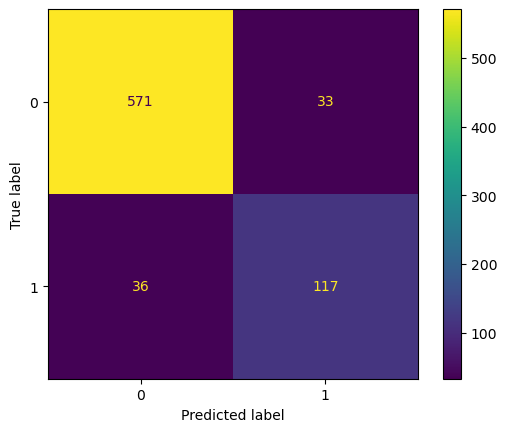

accuracy: 0.9088507265521797
precision: 0.78
recall: 0.7647058823529411
specificity: 0.945364238410596


In [1177]:
cm = confusion_matrix(y_pth2_test, lgr_pth2.predict(X_pth2_test))
plotConfusionMatrix(cm, lgr_pth2)

In [1178]:
df_results['LogisticRegression Target'] = cm

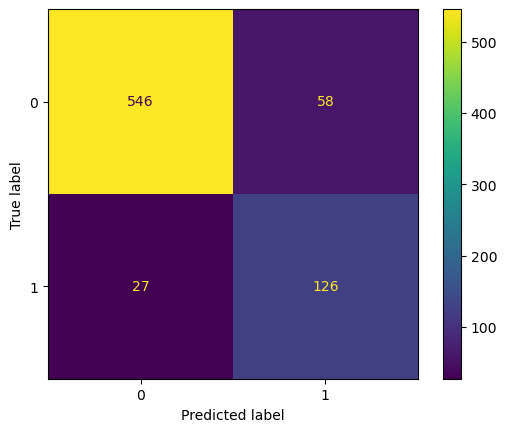

accuracy: 0.8877146631439894
precision: 0.6847826086956522
recall: 0.8235294117647058
specificity: 0.9039735099337748


In [1183]:
lgr_pth2_preds = custom_predict(lgr_pth2, X_pth2_test, threshold=0.3)
cm = confusion_matrix(y_pth2_test, lgr_pth2_preds)
plotConfusionMatrix(cm, lgr_pth2)

In [1185]:
df_results['LogisticRegression Target T03'] = cm

### LogisticRegression, TargetEncoder, class_weight='balanced'

In [1189]:
lgr_pth2_balanced = LogisticRegression(max_iter=1000, class_weight='balanced').fit(X_pth2_train, y_pth2_train)
accuracy_score(y_pth2_train, lgr_pth2_balanced.predict(X_pth2_train))

0.9052028218694885

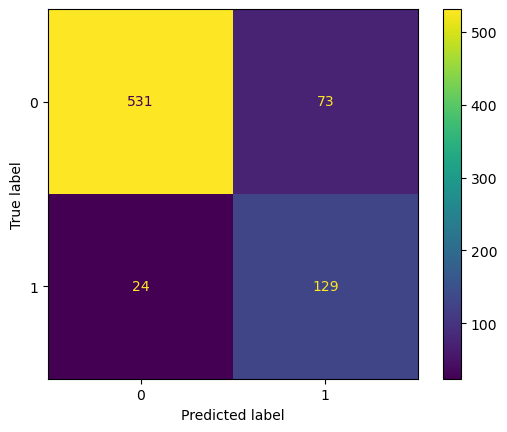

accuracy: 0.8718626155878467
precision: 0.6386138613861386
recall: 0.8431372549019608
specificity: 0.8791390728476821


In [1191]:
cm = confusion_matrix(y_pth2_test, lgr_pth2_balanced.predict(X_pth2_test))
plotConfusionMatrix(cm, lgr_pth2_balanced)

In [1193]:
df_results['LogisticRegression Target Balanced'] = cm

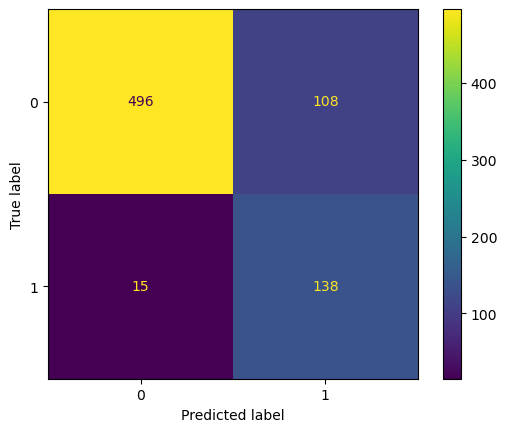

accuracy: 0.8375165125495376
precision: 0.5609756097560976
recall: 0.9019607843137255
specificity: 0.8211920529801324


In [1196]:
lgr_pth2_balanced_preds = custom_predict(lgr_pth2_balanced, X_pth2_test, threshold=0.3)
cm = confusion_matrix(y_pth2_test, lgr_pth2_balanced_preds)
plotConfusionMatrix(cm, lgr_pth2_balanced)

In [1198]:
df_results['LogisticRegression Target Balanced T03'] = cm

### RandomForestClassifier, TargetEncoder

In [1202]:
start_time = time.time()
accu=[]
for i in range(80, 121, 10):
    for j in range(30, 71, 10):
        rfci = RandomForestClassifier(n_estimators=i, max_features=j, oob_score=True, random_state=0)
        rfci.fit(X_pth2_train, y_pth2_train)
        accu.append((i, j, '-', (accuracy_score(y_pth2_test, rfci.predict(X_pth2_test)))))
end_time = time.time()
search_time = end_time - start_time
accu

[(80, 30, '-', 0.9088507265521797),
 (80, 40, '-', 0.9075297225891678),
 (80, 50, '-', 0.9035667107001321),
 (80, 60, '-', 0.9009247027741083),
 (80, 70, '-', 0.8996036988110965),
 (90, 30, '-', 0.9101717305151915),
 (90, 40, '-', 0.9009247027741083),
 (90, 50, '-', 0.9035667107001321),
 (90, 60, '-', 0.9022457067371202),
 (90, 70, '-', 0.9035667107001321),
 (100, 30, '-', 0.9141347424042272),
 (100, 40, '-', 0.9062087186261559),
 (100, 50, '-', 0.9022457067371202),
 (100, 60, '-', 0.9022457067371202),
 (100, 70, '-', 0.9022457067371202),
 (110, 30, '-', 0.9114927344782034),
 (110, 40, '-', 0.9075297225891678),
 (110, 50, '-', 0.8982826948480845),
 (110, 60, '-', 0.904887714663144),
 (110, 70, '-', 0.9022457067371202),
 (120, 30, '-', 0.9101717305151915),
 (120, 40, '-', 0.9062087186261559),
 (120, 50, '-', 0.9009247027741083),
 (120, 60, '-', 0.904887714663144),
 (120, 70, '-', 0.9035667107001321)]

In [1203]:
print(f"Prediction time: {search_time:.4f} seconds")

Prediction time: 94.5360 seconds


In [1204]:
rfc = RandomForestClassifier(n_estimators=100, max_features=30, oob_score=True, random_state=0)

In [1205]:
rfc.fit(X_pth2_train, y_pth2_train)
accuracy_score(y_pth2_train, rfc.predict(X_pth2_train))

1.0

In [1206]:
accuracy_score(y_pth2_test, rfc.predict(X_pth2_test))

0.9141347424042272

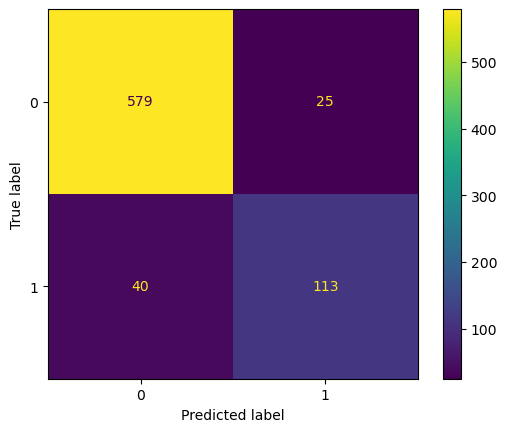

accuracy: 0.9141347424042272
precision: 0.8188405797101449
recall: 0.738562091503268
specificity: 0.9586092715231788


In [1207]:
cm = confusion_matrix(y_pth2_test, rfc.predict(X_pth2_test))
plotConfusionMatrix(cm, rfc)

In [1208]:
df_results['RandomForest Target'] = cm

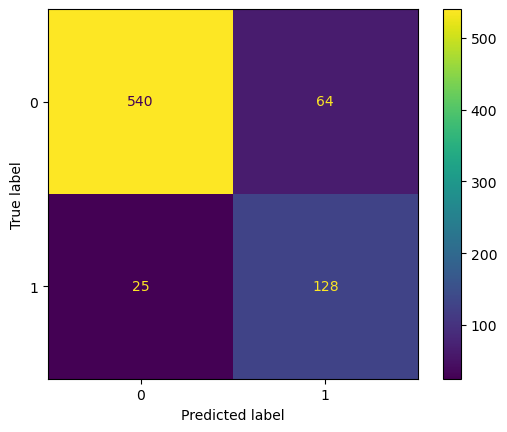

accuracy: 0.8824306472919419
precision: 0.6666666666666666
recall: 0.8366013071895425
specificity: 0.8940397350993378


In [1209]:
rfc_preds = custom_predict(rfc, X_pth2_test, threshold=0.3)
cm = confusion_matrix(y_pth2_test, rfc_preds)
plotConfusionMatrix(cm, rfc)

In [1218]:
df_results['RandomForest Target T03'] = cm

### RandomForestClassifier, TargetEncoder, class_weight='balanced'

In [1222]:
start_time = time.time()
accu=[]
for i in range(30, 101, 10):
    for j in range(10, 61, 5):
        rfci = RandomForestClassifier(n_estimators=i, max_features=j, oob_score=True, random_state=0, class_weight='balanced')
        rfci.fit(X_pth2_train, y_pth2_train)
        accu.append((i, j, '-', (accuracy_score(y_pth2_test, rfci.predict(X_pth2_test)))))
end_time = time.time()
search_time = end_time - start_time
accu

[(30, 10, '-', 0.9062087186261559),
 (30, 15, '-', 0.9062087186261559),
 (30, 20, '-', 0.9075297225891678),
 (30, 25, '-', 0.9035667107001321),
 (30, 30, '-', 0.8982826948480845),
 (30, 35, '-', 0.9141347424042272),
 (30, 40, '-', 0.904887714663144),
 (30, 45, '-', 0.904887714663144),
 (30, 50, '-', 0.9141347424042272),
 (30, 55, '-', 0.9114927344782034),
 (30, 60, '-', 0.9075297225891678),
 (40, 10, '-', 0.9062087186261559),
 (40, 15, '-', 0.9088507265521797),
 (40, 20, '-', 0.9101717305151915),
 (40, 25, '-', 0.904887714663144),
 (40, 30, '-', 0.9009247027741083),
 (40, 35, '-', 0.9180977542932629),
 (40, 40, '-', 0.9022457067371202),
 (40, 45, '-', 0.9101717305151915),
 (40, 50, '-', 0.9075297225891678),
 (40, 55, '-', 0.9101717305151915),
 (40, 60, '-', 0.9075297225891678),
 (50, 10, '-', 0.9062087186261559),
 (50, 15, '-', 0.9101717305151915),
 (50, 20, '-', 0.9141347424042272),
 (50, 25, '-', 0.904887714663144),
 (50, 30, '-', 0.9022457067371202),
 (50, 35, '-', 0.915455746367239

In [1223]:
print(f"Prediction time: {search_time:.4f} seconds")

Prediction time: 126.6864 seconds


In [1224]:
rfc_pth_balanced = RandomForestClassifier(n_estimators=40, max_features=35, oob_score=True, random_state=0, class_weight='balanced')
rfc_pth_balanced.fit(X_pth2_train, y_pth2_train)

RandomForestClassifier(class_weight='balanced', max_features=35,
                       n_estimators=40, oob_score=True, random_state=0)

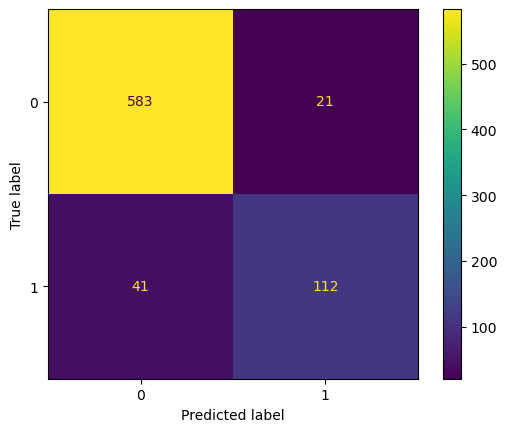

accuracy: 0.9180977542932629
precision: 0.8421052631578947
recall: 0.7320261437908496
specificity: 0.9652317880794702


In [1225]:
cm = confusion_matrix(y_pth2_test, rfc_pth_balanced.predict(X_pth2_test))
plotConfusionMatrix(cm, rfc_pth_balanced)

In [1226]:
df_results['RandomForest Target Balanced'] = cm

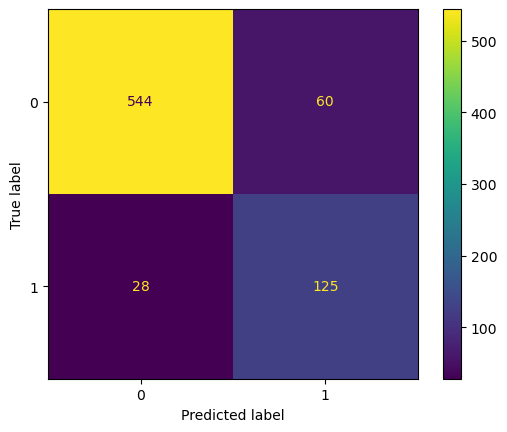

accuracy: 0.8837516512549538
precision: 0.6756756756756757
recall: 0.8169934640522876
specificity: 0.9006622516556292


In [1227]:
rfc_pth_balanced_preds = custom_predict(rfc_pth_balanced, X_pth2_test, threshold=0.3)
cm = confusion_matrix(y_pth2_test, rfc_pth_balanced_preds)
plotConfusionMatrix(cm, rfc_pth_balanced)

In [1228]:
df_results['RandomForest Target Balanced T03'] = cm

In [1230]:
start_time = time.time()
gbc = GradientBoostingClassifier(max_depth=5, max_features = 40, n_estimators=400, random_state=0)
gbc.fit(X_pth2_train, y_pth2_train)
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

boost_acc = gbc.score(X_pth2_test, y_pth2_test)
boost_acc

Training time: 10.0267 seconds


0.9009247027741083

In [1232]:
start_time = time.time()
accu = []
for mDepth in [5, 6]:
    for mFeatures in [10, 20, 40, 60, 80]:
        for nEstimators in [200, 400, 600, 800]:
            gbc = GradientBoostingClassifier(max_depth=mDepth, max_features=mFeatures, n_estimators=nEstimators, random_state=0)
            gbc.fit(X_pth2_train, y_pth2_train)
            accu.append((mDepth, mFeatures, nEstimators, '-', (accuracy_score(y_pth2_test, gbc.predict(X_pth2_test)))))
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

Training time: 465.6122 seconds


In [1233]:
accu

[(5, 10, 200, '-', 0.9035667107001321),
 (5, 10, 400, '-', 0.8996036988110965),
 (5, 10, 600, '-', 0.9009247027741083),
 (5, 10, 800, '-', 0.9022457067371202),
 (5, 20, 200, '-', 0.8969616908850726),
 (5, 20, 400, '-', 0.9009247027741083),
 (5, 20, 600, '-', 0.9035667107001321),
 (5, 20, 800, '-', 0.9022457067371202),
 (5, 40, 200, '-', 0.8996036988110965),
 (5, 40, 400, '-', 0.9009247027741083),
 (5, 40, 600, '-', 0.9075297225891678),
 (5, 40, 800, '-', 0.9062087186261559),
 (5, 60, 200, '-', 0.904887714663144),
 (5, 60, 400, '-', 0.9101717305151915),
 (5, 60, 600, '-', 0.9088507265521797),
 (5, 60, 800, '-', 0.904887714663144),
 (5, 80, 200, '-', 0.9075297225891678),
 (5, 80, 400, '-', 0.9075297225891678),
 (5, 80, 600, '-', 0.9062087186261559),
 (5, 80, 800, '-', 0.904887714663144),
 (6, 10, 200, '-', 0.8943196829590488),
 (6, 10, 400, '-', 0.892998678996037),
 (6, 10, 600, '-', 0.8996036988110965),
 (6, 10, 800, '-', 0.9009247027741083),
 (6, 20, 200, '-', 0.8982826948480845),
 (6,

In [1235]:
gbc_pth2 = GradientBoostingClassifier(max_depth=5, max_features=60, n_estimators=400, random_state=0)
gbc_pth2.fit(X_pth2_train, y_pth2_train)

GradientBoostingClassifier(max_depth=5, max_features=60, n_estimators=400,
                           random_state=0)

In [1236]:
accuracy_score(y_pth2_test, gbc_pth2.predict(X_pth2_test))

0.9101717305151915

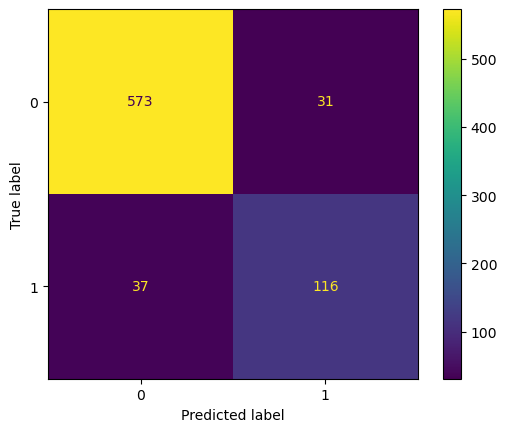

accuracy: 0.9101717305151915
precision: 0.7891156462585034
recall: 0.7581699346405228
specificity: 0.9486754966887417


In [1238]:
cm = confusion_matrix(y_pth2_test, gbc_pth2.predict(X_pth2_test))
plotConfusionMatrix(cm, gbc_pth2)

In [1239]:
df_results['GradientBoosting Target'] = cm

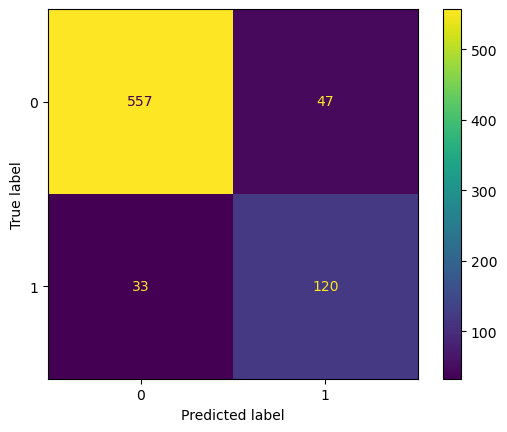

accuracy: 0.8943196829590488
precision: 0.718562874251497
recall: 0.7843137254901961
specificity: 0.9221854304635762


In [1240]:
gbc_pth2_preds = custom_predict(gbc_pth2, X_pth2_test, threshold=0.3)
cm = confusion_matrix(y_pth2_test, gbc_pth2_preds)
plotConfusionMatrix(cm, gbc_pth2)

In [1241]:
df_results['GradientBoosting Target T03'] = cm

In [1259]:
df_results

{'Dummy Australia': array([[10979,     0],
        [ 3126,     0]]),
 'LogisticRegression Base Australia': array([[10379,   600],
        [ 1405,  1721]]),
 'Dummy Sydney': array([[866,   0],
        [274,   0]]),
 'LogisticRegression Base Sydney': array([[804,  62],
        [106, 168]]),
 'Dummy Perth': array([[604,   0],
        [153,   0]]),
 'LogisticRegression Base Perth': array([[567,  37],
        [ 39, 114]]),
 'LogisticRegression Australia': array([[10400,   579],
        [ 1418,  1708]]),
 'LogisticRegression Sydney': array([[805,  61],
        [107, 167]]),
 'LogisticRegression Sydney T03': array([[712, 154],
        [ 65, 209]]),
 'SVM Sydney': array([[826,  40],
        [117, 157]]),
 'SVM Sydney T03': array([[774,  92],
        [ 80, 194]]),
 'DecisionTree Sydney': array([[828,  38],
        [144, 130]]),
 'DecisionTree Sydney T03': array([[706, 160],
        [ 83, 191]]),
 'KNN Sydney': array([[825,  41],
        [133, 141]]),
 'KNN Sydney T03': array([[741, 125],
      

In [1261]:
df_results['GradientBoosting Target T03'][0]

array([557,  47])

In [ ]:
# def plotConfusionMatrix(cm, model):
#     disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
#     disp.plot()
#     plt.show()
#     if (cm[1][1] + cm[0][1]) != 0:
#         precision = cm[1][1]/(cm[1][1] + cm[0][1])
#     recall = cm[1][1]/(cm[1][1] + cm[1][0])
#     specificity = cm[0][0]/(cm[0][0] + cm[0][1])
#     accuracy = (cm[0][0] + cm[1][1])/(cm[0][0] + cm[1][1] + cm[0][1] + cm[1][0])
#     print('accuracy:', accuracy)
#     print('precision:', precision if (cm[1][1] + cm[0][1]) != 0 else "Nan")
#     print('recall:', recall)
#     print('specificity:', specificity)

In [1263]:
data = []
for k, v in df_results.items():
    accuracy = (v[0][0] + v[1][1])/(v[0][0] + v[1][1] + v[0][1] + v[1][0])
    precision = v[1][1]/(v[1][1] + v[0][1]) if (v[1][1] + v[0][1]) != 0 else "NaN"
    recall = v[1][1]/(v[1][1] + v[1][0])
    specificity = v[0][0]/(v[0][0] + v[0][1])
    data.append([k, accuracy, precision, recall, specificity])

data
    

[['Dummy Australia', 0.77837646224743, 'NaN', 0.0, 1.0],
 ['LogisticRegression Base Australia',
  0.857851825593761,
  0.7414907367514002,
  0.5505438259756877,
  0.945350214044995],
 ['Dummy Sydney', 0.7596491228070176, 'NaN', 0.0, 1.0],
 ['LogisticRegression Base Sydney',
  0.8526315789473684,
  0.7304347826086957,
  0.6131386861313869,
  0.9284064665127021],
 ['Dummy Perth', 0.797886393659181, 'NaN', 0.0, 1.0],
 ['LogisticRegression Base Perth',
  0.8996036988110965,
  0.7549668874172185,
  0.7450980392156863,
  0.9387417218543046],
 ['LogisticRegression Australia',
  0.8584190003544843,
  0.7468299081766506,
  0.54638515674984,
  0.9472629565534202],
 ['LogisticRegression Sydney',
  0.8526315789473684,
  0.7324561403508771,
  0.6094890510948905,
  0.9295612009237876],
 ['LogisticRegression Sydney T03',
  0.8078947368421052,
  0.5757575757575758,
  0.7627737226277372,
  0.8221709006928406],
 ['SVM Sydney',
  0.862280701754386,
  0.7969543147208121,
  0.572992700729927,
  0.953810623

In [1271]:
df_matrix = pd.DataFrame(data, columns=['model', 'accuracy', 'precision', 'recall', 'specificity'])
# df_matrix.set_index('model', drop=True, inplace=True)
df_matrix

,model,accuracy,precision,recall,specificity
0,Dummy Australia,0.778376,NaN,0.000000,1.000000
1,LogisticRegression Base Australia,0.857852,0.741491,0.550544,0.945350
2,Dummy Sydney,0.759649,NaN,0.000000,1.000000
3,LogisticRegression Base Sydney,0.852632,0.730435,0.613139,0.928406
4,Dummy Perth,0.797886,NaN,0.000000,1.000000
5,LogisticRegression Base Perth,0.899604,0.754967,0.745098,0.938742
6,LogisticRegression Australia,0.858419,0.74683,0.546385,0.947263
7,LogisticRegression Sydney,0.852632,0.732456,0.609489,0.929561
8,LogisticRegression Sydney T03,0.807895,0.575758,0.762774,0.822171
9,SVM Sydney,0.862281,0.796954,0.572993,0.953811
